# Data import

In [1]:
import scanpy as sc
import pandas as pd
import tarfile
import os

meta = pd.read_csv("/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/human_meta.csv")

base = "/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human"
tmp = base + "/tmp"

os.makedirs(tmp, exist_ok=True)

ads = []

for _, r in meta.iterrows():

    sample = r["Sample name"]
    tar_path = f"{base}/{sample}.tar.gz"

    with tarfile.open(tar_path) as tar:
        tar.extractall(tmp)

    path = f"{tmp}/work/{sample}"

    ad = sc.read_10x_mtx(path, var_names="gene_symbols", cache=False)

    ad.obs_names = sample + "_" + ad.obs_names.astype(str)

    for c in meta.columns:
        ad.obs[c] = r[c]

    ad.obs["sample"] = sample

    ads.append(ad)

adata = sc.concat(ads, join="inner")
adata.write("/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/h5ad/raw_total.h5ad")

/home/Data_Drive_8TB/kykim/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


# Data preprocess

In [2]:
import scanpy as sc
file_path = "/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/h5ad/raw_total.h5ad"
adata = sc.read_h5ad(file_path)

In [3]:
adata.var["mt"] = adata.var_names.str.startswith("MT-")
adata.var["ribo"] = adata.var_names.str.startswith(("RPS","RPL"))
adata.var["hb"] = adata.var_names.str.startswith(("HBA","HBB"))

sc.pp.calculate_qc_metrics(
    adata,
    qc_vars=["mt","ribo","hb"],
    inplace=True,
    log1p=True)

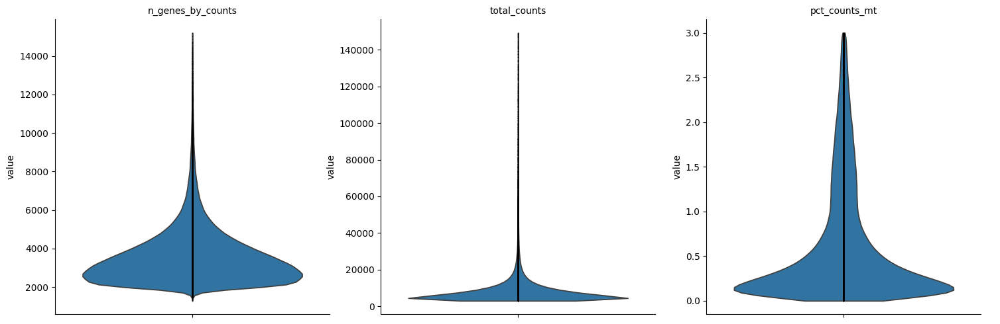

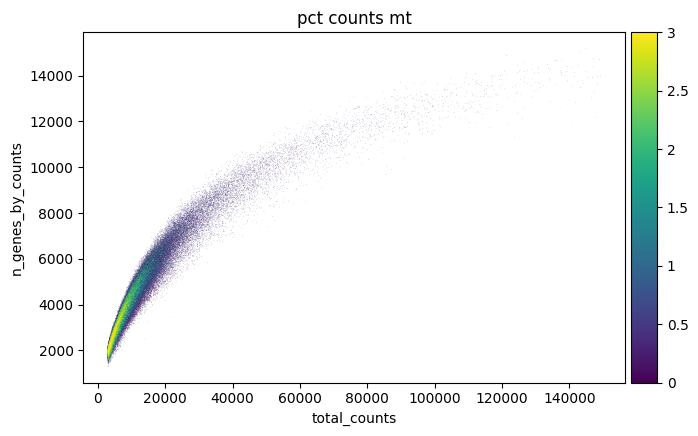

In [4]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.0,
    multi_panel=True,
)
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

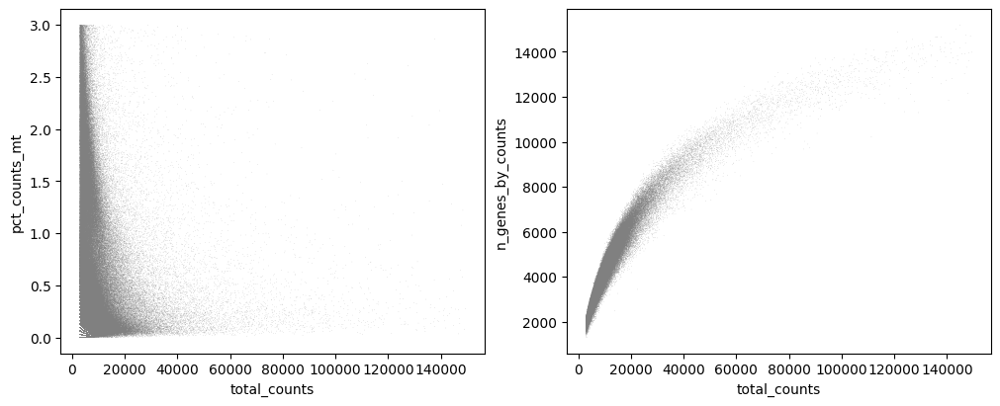

In [5]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(10, 4), layout="constrained")
sc.pl.scatter(adata, x="total_counts", y="pct_counts_mt", show=False, ax=axs[0])
sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts", show=False, ax=axs[1]);

Before QC: (303021, 36601)


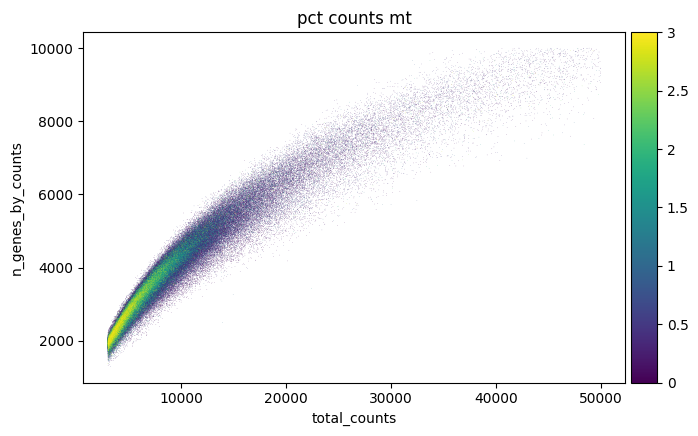

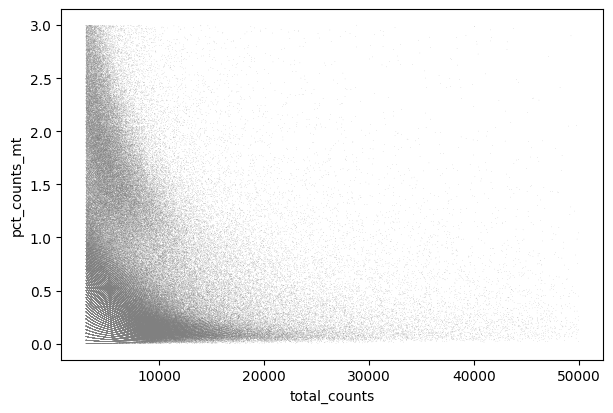

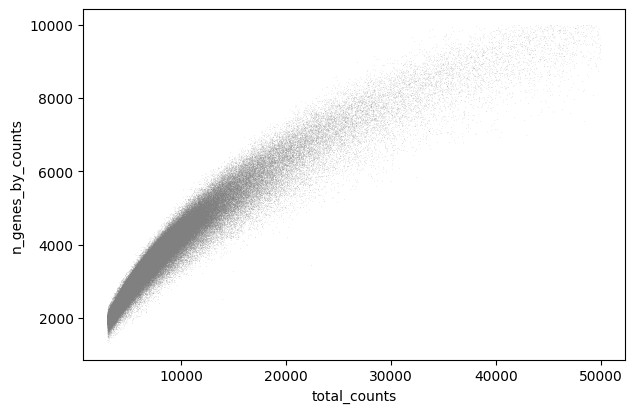

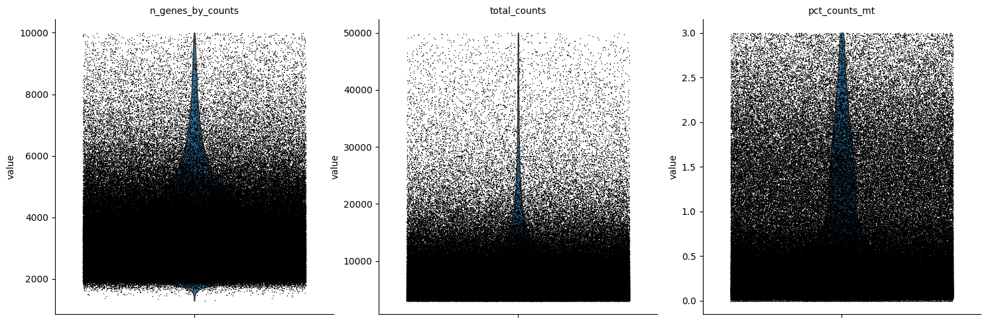

After QC: (300939, 34694)


In [6]:
print("Before QC:", adata.shape)

sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=3)
adata = adata[(adata.obs.n_genes_by_counts <= 10000), :]
adata = adata[adata.obs.pct_counts_mt < 20, :].copy()
adata = adata[(adata.obs.total_counts >= 500) & (adata.obs.total_counts <= 50000), :]

sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")
sc.pl.scatter(adata, x="total_counts", y="pct_counts_mt")
sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts")
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)
print("After QC:", adata.shape)

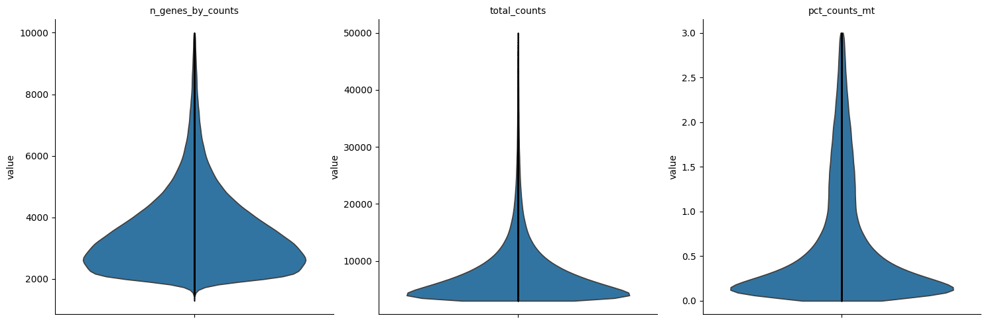

In [7]:
%matplotlib inline
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.0,
    multi_panel=True,
    show=True  # 반드시 True
)
plt.show()

In [8]:
adata.write("/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/h5ad/after_QC_Before_HVG_raw.h5ad")

In [9]:
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

/tmp/ipykernel_1182040/1526851425.py:1: ImplicitModificationWarning: Setting element `.layers['counts']` of view, initializing view as actual.
  adata.layers["counts"] = adata.X.copy()


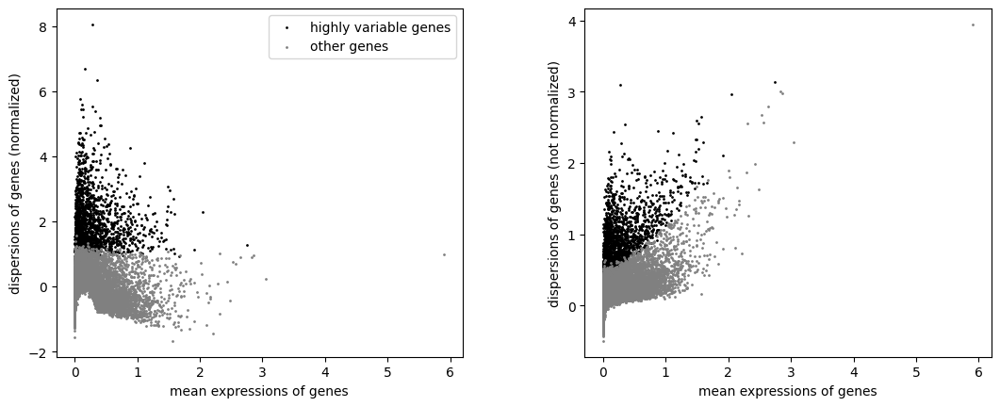

In [10]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000, batch_key="Sample name")
sc.pl.highly_variable_genes(adata)

In [11]:
adata = adata[:, adata.var['highly_variable']].copy()

# Clustering

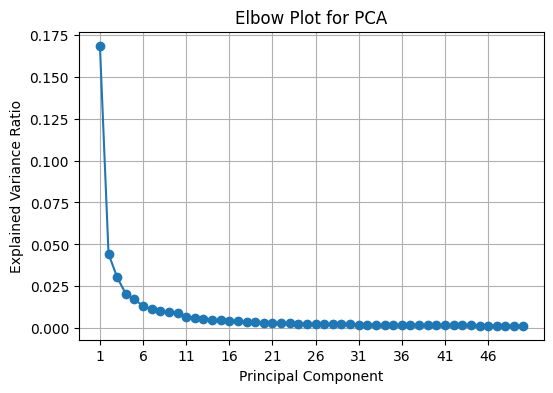

In [12]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline

sc.tl.pca(adata)
explained_variance_ratio = adata.uns["pca"]["variance_ratio"]

plt.figure(figsize=(6, 4))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker="o", linestyle="-")
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.title("Elbow Plot for PCA")
plt.xticks(np.arange(1, len(explained_variance_ratio) + 1, step=5))
plt.grid()
plt.show()

In [13]:
sc.tl.pca(adata, n_comps=21)

2026-04-27 06:17:16.327385: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1777238236.345919 1182040 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1777238236.351309 1182040 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1777238236.364516 1182040 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1777238236.364547 1182040 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1777238236.364548 1182040 computation_placer.cc:177] computation placer alr

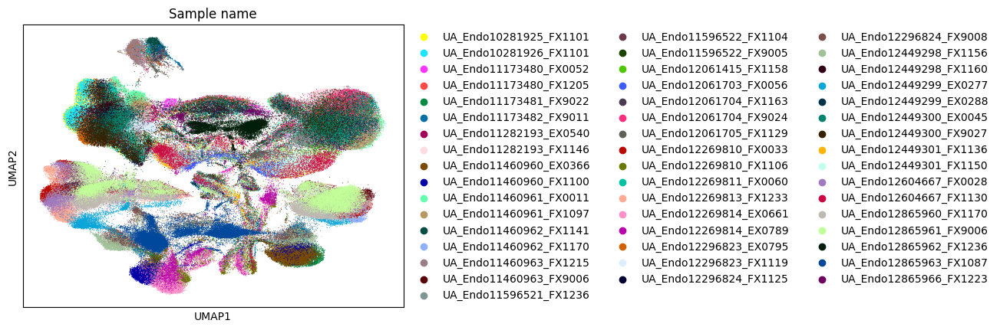

In [14]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.pl.umap(
    adata,
    color="Sample name",
    # Setting a smaller point size to get prevent overlap
    size=2)

In [15]:
import scvi 

scvi.model.SCVI.setup_anndata(adata, layer="counts", batch_key="Sample name")
vae = scvi.model.SCVI(adata, n_layers=2, n_latent=30, gene_likelihood="nb")

vae.train(max_epochs=400, early_stopping=True, early_stopping_patience=10)

Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA RTX A5000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/home/Data_Drive_8TB/kykim/.local/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Con

Training:   0%|          | 0/400 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 10 records. Best score: 1024.761. Signaling Trainer to stop.


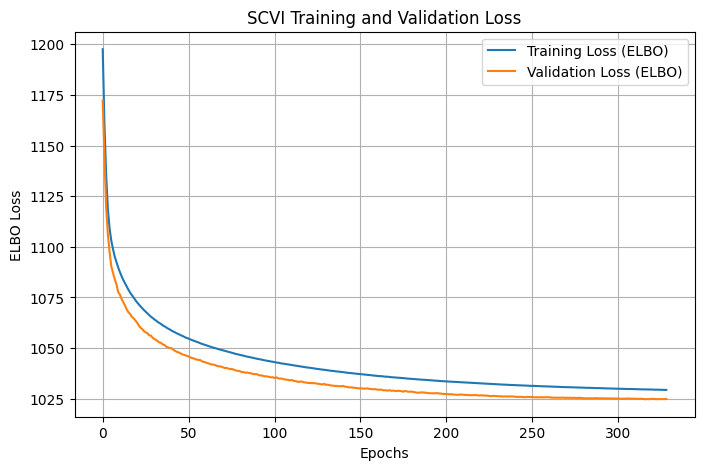

In [16]:
import matplotlib.pyplot as plt

train_loss = vae.history["elbo_train"]
val_loss = vae.history["elbo_validation"]
plt.figure(figsize=(8, 5))
plt.plot(train_loss, label="Training Loss (ELBO)")
plt.plot(val_loss, label="Validation Loss (ELBO)")
plt.xlabel("Epochs")
plt.ylabel("ELBO Loss")
plt.title("SCVI Training and Validation Loss")
plt.legend()
plt.grid()
plt.show()

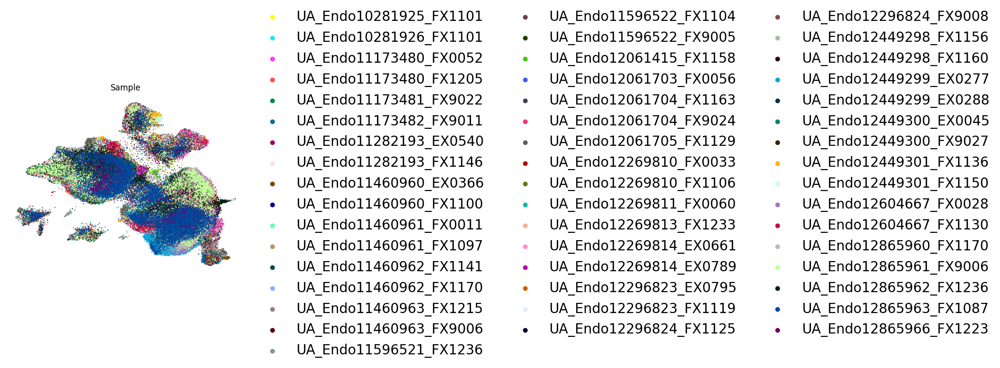

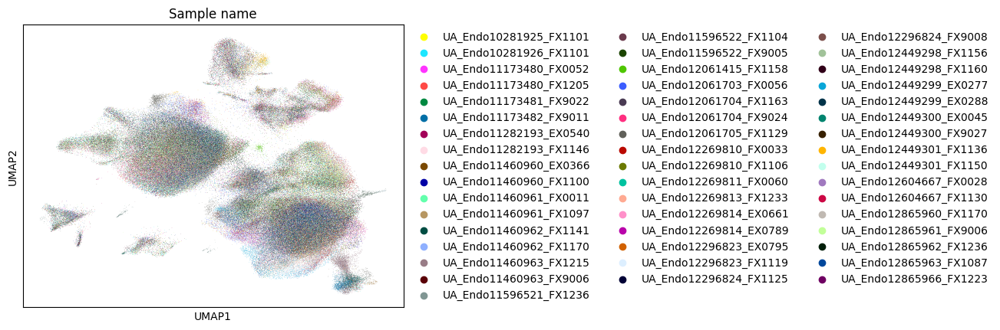

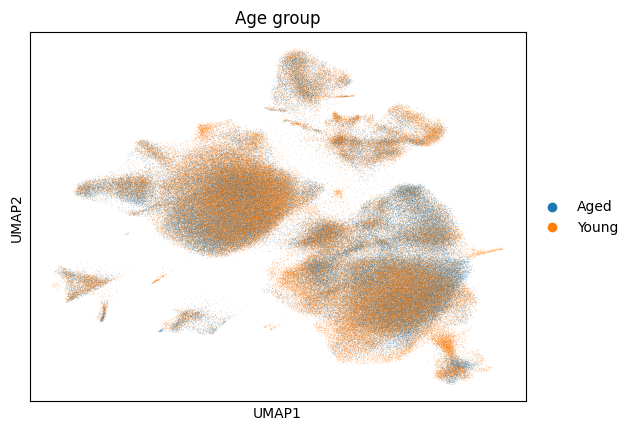

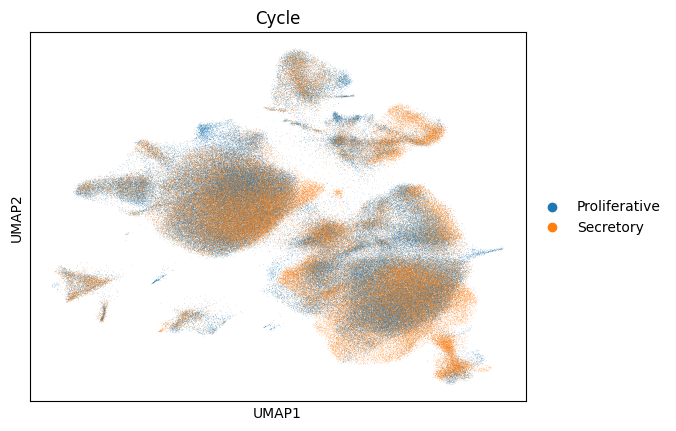

In [17]:
adata.obsm["X_scVI"] = vae.get_latent_representation()
sc.pp.neighbors(adata, use_rep = 'X_scVI')
sc.tl.umap(adata)
sc.pl.umap(
    adata,
    color=['Sample name'],
    frameon=False,
    size= 8,
    legend_fontsize=20,
    legend_fontoutline=3,
    title="Sample",
    show=False)

sc.pl.umap(adata, color=["Sample name"])
sc.pl.umap(adata, color=["Age group"])
sc.pl.umap(adata, color=["Cycle"])

In [18]:
for res in [0.25 , 0.5, 0.75, 1]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

Cluster 0: ['NR2F2-AS1', 'SLC24A3', 'LSAMP', 'CDH11', 'LDB2', 'ZEB1', 'TWIST2', 'NLGN1', 'IGF1', 'ALDH1A2', 'HPSE2', 'KCNIP4', 'MIR99AHG', 'RUNX1T1', 'PTCH1']
Cluster 1: ['NR2F2-AS1', 'ZEB1', 'CDH11', 'PDZRN3', 'TSHZ3', 'ALDH1A2', 'PLPP1', 'PRDM1', 'KIF26B', 'APCDD1', 'SNCAIP', 'NLGN1', 'ANTXR1', 'CHSY3', 'TLE4']
Cluster 2: ['CREB5', 'MIR4435-2HG', 'SERPINE1', 'CYTOR', 'COL6A3', 'COL4A1', 'GEM', 'SGIP1', 'COL12A1', 'NFATC2', 'PALM2-AKAP2', 'ETS1', 'BACH2', 'AKAP12', 'SAMD4A']
Cluster 3: ['NR2F2-AS1', 'CDH11', 'DLC1', 'NLGN1', 'CACNA1D', 'MIR99AHG', 'PTCH1', 'NRP1', 'FLRT2', 'LDB2', 'EBF1', 'RUNX1T1', 'ALDH1A2', 'SLC24A3', 'RORB']
Cluster 4: ['AC024230.1', 'LINC01541', 'SLC24A3', 'NR2F2-AS1', 'PCAT1', 'HPSE2', 'EYA2', 'AC012409.2', 'PDZRN3', 'LSAMP', 'PLCB4', 'ZEB1', 'RORB', 'ALDH1A2', 'KIAA1324']
Cluster 5: ['PTPRC', 'SKAP1', 'CELF2', 'PRKCH', 'DOCK10', 'CD96', 'CD247', 'ANKRD44', 'ARHGAP15', 'IKZF1', 'FYN', 'SAMD3', 'DOCK8', 'SLFN12L', 'CHST11']
Cluster 6: ['LINC01541', 'AC024230.1', 

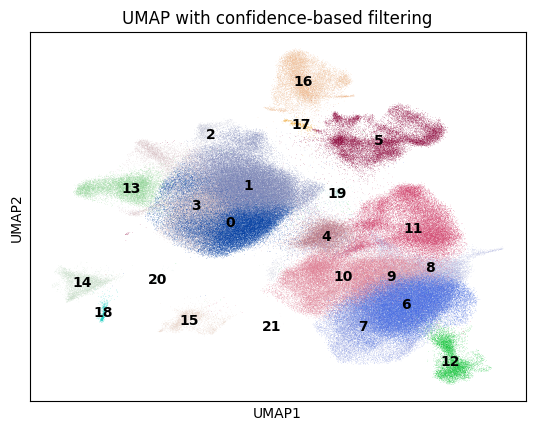

In [19]:
import scanpy as sc
import warnings
warnings.filterwarnings("ignore")

sc.tl.rank_genes_groups(adata, groupby='leiden_res_1.00', method='t-test')  # 또는 'wilcoxon'

top_genes = {}

groups = adata.uns['rank_genes_groups']['names'].dtype.names  # 클러스터 이름들

for group in groups:
    genes = adata.uns['rank_genes_groups']['names'][group][:15]
    top_genes[group] = genes.tolist()

for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {genes}")
sc.pl.umap(
    adata,
    color='leiden_res_1.00',
    title='UMAP with confidence-based filtering',
    legend_loc='on data')

In [20]:
import scanpy as sc

adata_source = sc.read_h5ad("/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/h5ad/after_QC_Before_HVG_raw.h5ad")

common_barcodes = adata.obs_names.intersection(adata_source.obs_names)

adata = adata[common_barcodes].copy()
adata_source = adata_source[common_barcodes].copy()

adata._X = adata_source.X.copy()
adata._var = adata_source.var.copy()
adata._n_vars = adata_source.n_vars

In [22]:
#adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

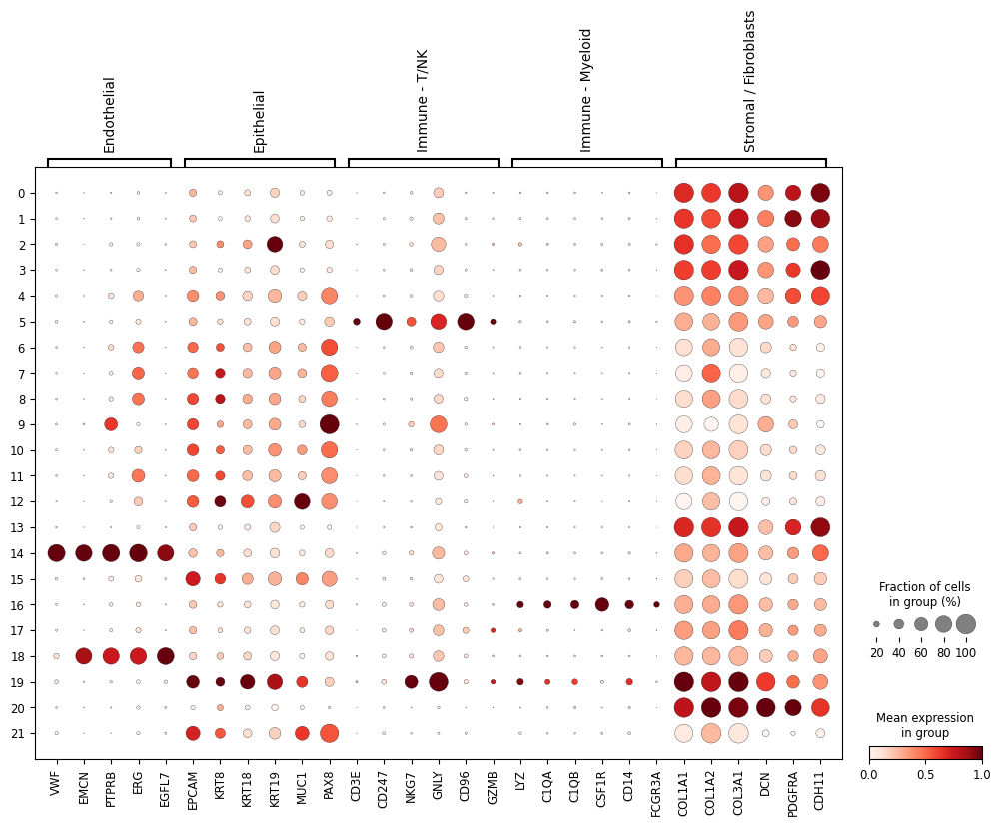

In [23]:
group_markers = {
"Endothelial": ["VWF","EMCN","PTPRB","ERG","EGFL7"],
"Epithelial": ["EPCAM","KRT8","KRT18","KRT19","MUC1","PAX8"],
"Immune - T/NK": ["CD3E","CD247","NKG7","GNLY","CD96","GZMB"],
"Immune - Myeloid": ["LYZ","C1QA","C1QB","CSF1R","CD14","FCGR3A"],
"Stromal / Fibroblasts": ["COL1A1","COL1A2","COL3A1","DCN","PDGFRA","CDH11"]}

existing_genes = {
    cat: [gene for gene in genes if gene in adata.var_names]
    for cat, genes in group_markers.items()
}

existing_genes = {cat: genes for cat, genes in existing_genes.items() if genes}

sc.pl.dotplot(
    adata,
    var_names=existing_genes,
    groupby="leiden_res_1.00",
    standard_scale="var")

Cluster Endothelial cells: ['LDB2', 'IGFBP7', 'NR5A2', 'PTPRB', 'FLI1', 'CALCRL', 'SMAD1', 'SPTBN1', 'A2M', 'EMCN']
Cluster Epithelial cells: ['RHEX', 'MECOM', 'UBE2D2', 'AC024230.1', 'EYA2', 'LINC01541', 'PLCB1', 'PATJ', 'TMEM101', 'STX18']
Cluster Immune - Lymphoid: ['PTPRC', 'CELF2', 'SKAP1', 'DOCK10', 'ARHGAP15', 'ANKRD44', 'PRKCH', 'CD96', 'CD247', 'IKZF1']
Cluster Immune - Myeloid: ['PLXDC2', 'LRMDA', 'DOCK2', 'DOCK8', 'ELMO1', 'TBXAS1', 'ZEB2', 'DPYD', 'SLC8A1', 'DOCK4']
Cluster Stromal / Fibroblasts: ['NR2F2-AS1', 'CDH11', 'NLGN1', 'ALDH1A2', 'COL3A1', 'ZEB1', 'SLC24A3', 'LSAMP', 'TSHZ3', 'TWIST2']


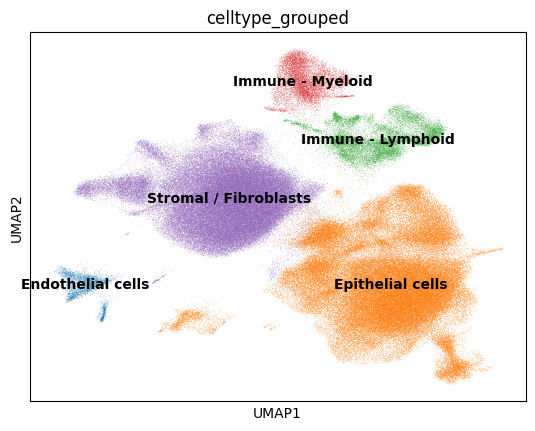

In [27]:
cluster_to_group = {
0: "Stromal / Fibroblasts", #
1: "Stromal / Fibroblasts", #
2: "Stromal / Fibroblasts", #
3: "Stromal / Fibroblasts", #
4: "Epithelial cells", #
5: "Immune - Lymphoid", #
6: "Epithelial cells", #
7: "Epithelial cells", #
8: "Epithelial cells", #
9: "Epithelial cells", #
10: "Epithelial cells", #
11: "Epithelial cells", #
12: "Epithelial cells", #
13: "Stromal / Fibroblasts", #
14: "Endothelial cells", #
15: "Epithelial cells", #
16: "Immune - Myeloid",
17: "Immune - Lymphoid",
18: "Endothelial cells",
19: "Epithelial cells",
20: "Stromal / Fibroblasts",
21: "Epithelial cells"}

adata.obs["celltype_grouped"] = adata.obs["leiden_res_1.00"].astype(int).map(cluster_to_group)

sc.tl.rank_genes_groups(adata, groupby='celltype_grouped', method='t-test')  # 또는 'wilcoxon'

top_genes = {}

groups = adata.uns['rank_genes_groups']['names'].dtype.names  # 클러스터 이름들

for group in groups:
    genes = adata.uns['rank_genes_groups']['names'][group][:10]
    top_genes[group] = genes.tolist()

for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {genes}")
    
sc.pl.umap(
    adata,
    color='celltype_grouped',
    legend_loc='on data')

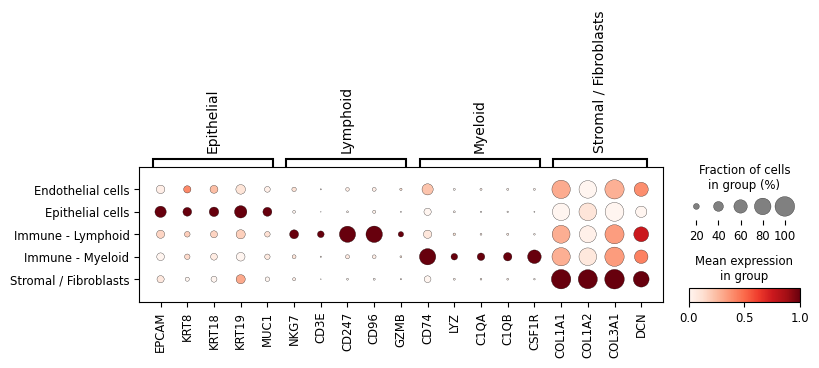

In [28]:
group_markers = {
"Epithelial": ["EPCAM","KRT8","KRT18","KRT19","MUC1"],
"Lymphoid": ["NKG7","CD3E","CD247","CD96","GZMB"],
"Myeloid": ["CD74","LYZ","C1QA","C1QB","CSF1R"],
"Stromal / Fibroblasts": ["COL1A1","COL1A2","COL3A1","DCN"]}

existing_genes = {
    cat: [gene for gene in genes if gene in adata.var_names]
    for cat, genes in group_markers.items()
}

existing_genes = {cat: genes for cat, genes in existing_genes.items() if genes}

sc.pl.dotplot(
    adata,
    var_names=existing_genes,
    groupby="celltype_grouped",
    standard_scale="var")

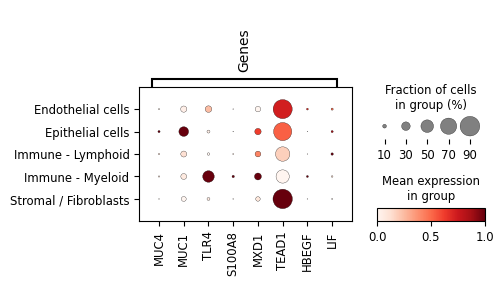

In [29]:
group_markers = {
"Genes": ["MUC4","MUC1","TLR4","S100A8","MXD1","TEAD1","HBEGF","LIF"]}

existing_genes = {
    cat: [gene for gene in genes if gene in adata.var_names]
    for cat, genes in group_markers.items()
}

existing_genes = {cat: genes for cat, genes in existing_genes.items() if genes}

sc.pl.dotplot(
    adata,
    var_names=existing_genes,
    groupby="celltype_grouped",
    standard_scale="var")

In [32]:
adata.__dict__['_varm'].clear()
adata.__dict__['_layers'].clear()

In [33]:
adata.write("/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/h5ad/After_Clustering.h5ad")

In [7]:
import scanpy as sc
adata = sc.read_h5ad("/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/h5ad/After_Clustering.h5ad")

In [6]:
import pandas as pd
import scanpy as sc
import sys
sys.path.append("/home/Data_Drive_8TB/kykim/QED")
from qed.data import readtxt, readseurat, readscanpy
from qed.data import get_enrichment_dataframes
from qed.data import merge_df
from qed.data import query
import inspect
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sc.tl.rank_genes_groups(adata, 'celltype_grouped', method="wilcoxon",use_raw =False)
sc.tl.dendrogram(adata, groupby='celltype_grouped')

result = adata.uns["rank_genes_groups"]
groups = result["names"].dtype.names  # 예: ("Tcells", "Bcells", ...)
result_df = pd.DataFrame(
    {
        f"{group}_{key}": result[key][group]
        for group in groups
        for key in ["names", "pvals_adj", "logfoldchanges", "scores"]
    }
)

up_dict = {}
down_dict = {}

for group in groups:
    n_col = f"{group}_names"
    p_col = f"{group}_pvals_adj"
    l_col = f"{group}_logfoldchanges"
    s_col = f"{group}_scores"

    degs_sig = result_df[result_df[p_col] < 0.05]
    degs_up = degs_sig[degs_sig[l_col] > 1].sort_values(by=s_col, ascending=False)
    degs_dw = degs_sig[degs_sig[l_col] < -1].sort_values(by=s_col, ascending=True)
    up_dict[group] = degs_up[n_col].reset_index(drop=True)
    down_dict[group] = degs_dw[n_col].reset_index(drop=True)

df_merge_up = pd.concat(up_dict.values(), axis=1)
df_merge_up.columns = list(up_dict.keys())  # 각 열 이름을 group 이름으로
df_merge_down = pd.concat(down_dict.values(), axis=1)
df_merge_down.columns = list(down_dict.keys())
sc.tl.dendrogram(adata, groupby='celltype_grouped')

import pandas as pd
import scanpy as sc

result = adata.uns["rank_genes_groups"]
groups = result["names"].dtype.names
result_df = pd.DataFrame(
    {
        f"{group}_{key}": result[key][group]
        for group in groups
        for key in ["names", "pvals_adj", "logfoldchanges", "scores"]
    }
)
up_dict = {}
down_dict = {}
for group in groups:
    n_col = f"{group}_names"
    p_col = f"{group}_pvals_adj"
    l_col = f"{group}_logfoldchanges"
    s_col = f"{group}_scores"
    degs_sig = result_df[result_df[p_col] < 0.05]
    degs_up = degs_sig[degs_sig[l_col] > 1].sort_values(by=s_col, ascending=False)
    degs_dw = degs_sig[degs_sig[l_col] < -1].sort_values(by=s_col, ascending=True)
    up_dict[group] = degs_up[n_col].reset_index(drop=True)
    down_dict[group] = degs_dw[n_col].reset_index(drop=True)
df_merge_up = pd.concat(up_dict.values(), axis=1)
df_merge_up.columns = list(up_dict.keys())  # 각 열 이름을 group 이름으로
df_merge_down = pd.concat(down_dict.values(), axis=1)
df_merge_down.columns = list(down_dict.keys())

import pandas as pd

class GeneSet:
    def __init__(self, genes, name, annot=None):
        self.genes = genes
        self.name = name
        self.params = {}
        self.GO = []
        self.annot = annot or {}

dblist = ['CellMarker_2024','CellMarker_Augmented_2021',"PanglaoDB_Augmented_2021"]

df_merge_up_100 = df_merge_up.head(20)
df_merge_up_100.to_csv('breast_cancer_DEG_up_leiden.csv', index=False, header=True)
alist = pd.read_csv('breast_cancer_DEG_up_leiden.csv')
geneset_list = []
for col in alist.columns:
    genes = alist[col].dropna().tolist()
    gs = GeneSet(genes=genes, name=col, annot={"Leiden": col})
    geneset_list.append(gs)

aalist = get_enrichment_dataframes(
    geneset_list=geneset_list,
    dblist=dblist,
    annot_colname="Leiden",
    n_jobs=None,
    handle_error=True,
    max_iter=1
)

df = merge_df(aalist)
df['Term'] = df['Term'].str.split(r'\(GO:').str[0].str.strip()
df['Term'] = df['Term'].str.split('R-H').str[0].str.strip()
df['Term'] = df['Term'].str.split('WP').str[0].str.strip()


from typing import List, Tuple, Dict
def heatmap_with_groupwise_ordering(df: pd.DataFrame,
                                     n: int,
                                     group_by: str,
                                     order_by: str = "Adjusted p-value",
                                     cmap: str = 'Blues',
                                     xlabel_rotation: int = 90,
                                     xlabel_fontsize: int = 15,
                                     ylabel_fontsize: int = 15,
                                     figsize: Tuple = (15, 10),
                                     vmin: float = None,
                                     vmax: float = None,
                                     cbar_kws: Dict = None,
                                     linewidths: float = 0.1,
                                     title: str = None,
                                     save_to_file: str = None,
                                     enable_column_order: bool = False,
                                     column_order: list = None,
                                     enable_highlight_columns: bool = False,
                                     highlight_column_names: list = None):

    if not isinstance(df, pd.DataFrame):
        raise TypeError("입력 'df'는 pandas DataFrame이어야 합니다.")
    if group_by not in df.columns:
        raise ValueError(f"'{group_by}' 컬럼이 DataFrame에 존재하지 않습니다.")
    if order_by not in df.columns:
        raise ValueError(f"'{order_by}' 컬럼이 DataFrame에 존재하지 않습니다.")
    if 'Term' not in df.columns:
        raise ValueError("'Term' 컬럼이 DataFrame에 존재하지 않습니다.")

    has_overlapping_genes = 'Overlapping genes' in df.columns

    df_copy = df.copy()
    df_copy[order_by] = pd.to_numeric(df_copy[order_by], errors='coerce')
    df = df_copy

    df['Term_lower'] = df['Term'].str.lower()

    # 상위 n개 Term 추출
    df_filtered_by_order = df[df[order_by].notna()]
    df_ranked_per_group = (
        df_filtered_by_order
        .sort_values(order_by)
        .groupby(group_by)
        .head(n)
        .reset_index(drop=True)
    )
    if df_ranked_per_group.empty:
        print(f"⚠️ 각 그룹에서 상위 {n}개의 Term을 선택할 수 없습니다.")
        return None, None

    all_selected_terms_lower = df_ranked_per_group['Term_lower'].unique()

    overlapping_genes_pivot = pd.DataFrame()
    if has_overlapping_genes:
        overlapping_genes_df = df[df['Term_lower'].isin(all_selected_terms_lower)][['Term_lower', group_by, 'Overlapping genes']]
        overlapping_genes_df['Overlapping genes'] = overlapping_genes_df['Overlapping genes'].apply(
            lambda x: ', '.join(map(str, x)) if isinstance(x, list) else str(x)
        )
        overlapping_genes_df = overlapping_genes_df.groupby(['Term_lower', group_by])['Overlapping genes'].apply(', '.join).reset_index()
        overlapping_genes_df.rename(columns={'Term_lower': 'Term'}, inplace=True)
        overlapping_genes_pivot = overlapping_genes_df.pivot(index='Term', columns=group_by, values='Overlapping genes').fillna('')
        overlapping_genes_pivot.index = overlapping_genes_pivot.index.map(lambda x: x.capitalize())

    aggregated_df = df[df['Term_lower'].isin(all_selected_terms_lower)].groupby(['Term_lower', group_by], as_index=False)[order_by].min()
    aggregated_df.rename(columns={'Term_lower': 'Term'}, inplace=True)
    pivot_df = aggregated_df.pivot(index="Term", columns=group_by, values=order_by).fillna(1).rename_axis(None, axis=1)

    is_pvalue_column = order_by.lower() in ['adjusted p-value', 'p-value']
    pivot_df_for_heatmap = -np.log10(np.maximum(pivot_df, np.finfo(float).eps)) if is_pvalue_column else pivot_df.copy()
    pivot_df_for_heatmap.index = pivot_df_for_heatmap.index.map(lambda x: x.capitalize())

    final_pivot_df = pd.concat([pivot_df_for_heatmap, overlapping_genes_pivot], axis=1)

    if save_to_file:
        try:
            final_pivot_df.to_csv(save_to_file, encoding='utf-8-sig')
            print(f"✅ 히트맵 데이터 저장 완료: '{save_to_file}'")
        except Exception as e:
            print(f"❌ 저장 실패: {e}")

    row_order = []
    seen_terms = set()

    if enable_column_order and column_order:
        group_order_for_plot = [group for group in column_order if group in df[group_by].unique()]
    else:
        group_order_for_plot = sorted(df[group_by].unique())

    for group in group_order_for_plot:
        current_group_terms = (
            df_ranked_per_group[df_ranked_per_group[group_by] == group]
            .sort_values(order_by)
        )
        for term_lower_val in current_group_terms['Term_lower']:
            capitalized_term = term_lower_val.capitalize()
            if capitalized_term in pivot_df_for_heatmap.index and capitalized_term not in seen_terms:
                row_order.append(capitalized_term)
                seen_terms.add(capitalized_term)

    clustered_data = final_pivot_df.loc[row_order]
    heatmap_data = clustered_data.select_dtypes(include=[np.number])
    if enable_column_order and column_order:
        valid_cols = [c for c in column_order if c in heatmap_data.columns]
        if valid_cols:
            heatmap_data = heatmap_data[valid_cols]

    else:
        try:
            numeric_col_keys = [float(c) for c in heatmap_data.columns]
            sorted_cols = [col for _, col in sorted(zip(numeric_col_keys, heatmap_data.columns))]
            heatmap_data = heatmap_data[sorted_cols]
        except ValueError:
            pass


    if is_pvalue_column:
        p_values_for_annotation = 10 ** (-np.clip(heatmap_data, None, 300))
        annotations = np.where(p_values_for_annotation <= 0.05, '*', '')
        annotations = annotations.astype(object)
    else:
        annotations = False

    highlight_column_indices = []
    if enable_highlight_columns and highlight_column_names:
        highlight_column_indices = [
            list(heatmap_data.columns).index(col)
            for col in highlight_column_names if col in heatmap_data.columns
        ]

    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(heatmap_data, cmap=cmap, vmin=vmin, vmax=vmax,
                linewidths=linewidths, annot=annotations, fmt='',
                linecolor='white', ax=ax, cbar_kws=cbar_kws, square=True,
                annot_kws={"size": 12, "color": "white", "weight": "bold"})

    for x in highlight_column_indices:
        ax.vlines(x + 1, *ax.get_ylim(), colors='black', linewidth=2)

    plt.xticks(rotation=xlabel_rotation, fontsize=xlabel_fontsize)
    plt.yticks(fontsize=ylabel_fontsize)
    if title:
        ax.set_title(title, fontsize=18, pad=20)
    plt.grid(False)

    if 'Term_lower' in df.columns:
        df.drop(columns='Term_lower', inplace=True)

    return fig, ax

Processing genesets:  20%|██        | 1/5 [00:01<00:04,  1.02s/it]

Error processing Stromal / Fibroblasts for CellMarker_Augmented_2021: Error analyzing gene list
Error processing Immune - Myeloid for CellMarker_Augmented_2021: Error analyzing gene list
Error processing Immune - Myeloid for CellMarker_2024: Error analyzing gene list
Error processing Immune - Lymphoid for CellMarker_Augmented_2021: Error analyzing gene list
Error processing Endothelial cells for CellMarker_Augmented_2021: Error analyzing gene list
Error processing Epithelial cells for CellMarker_2024: Error analyzing gene list
Error processing Stromal / Fibroblasts for CellMarker_2024: Error analyzing gene list
Error processing Endothelial cells for PanglaoDB_Augmented_2021: Error analyzing gene list
Error processing Stromal / Fibroblasts for PanglaoDB_Augmented_2021: Error analyzing gene list
Error processing Epithelial cells for CellMarker_Augmented_2021: Error analyzing gene list


Processing genesets: 15it [00:02,  7.48it/s]                      


Trying to re-request...
Endothelial cells with CellMarker_Augmented_2021 completed!
Endothelial cells with PanglaoDB_Augmented_2021 completed!
Epithelial cells with CellMarker_2024 completed!
Epithelial cells with CellMarker_Augmented_2021 completed!
Immune - Lymphoid with CellMarker_Augmented_2021 completed!
Immune - Myeloid with CellMarker_2024 completed!
Immune - Myeloid with CellMarker_Augmented_2021 completed!
Stromal / Fibroblasts with CellMarker_2024 completed!
Stromal / Fibroblasts with CellMarker_Augmented_2021 completed!
Stromal / Fibroblasts with PanglaoDB_Augmented_2021 completed!


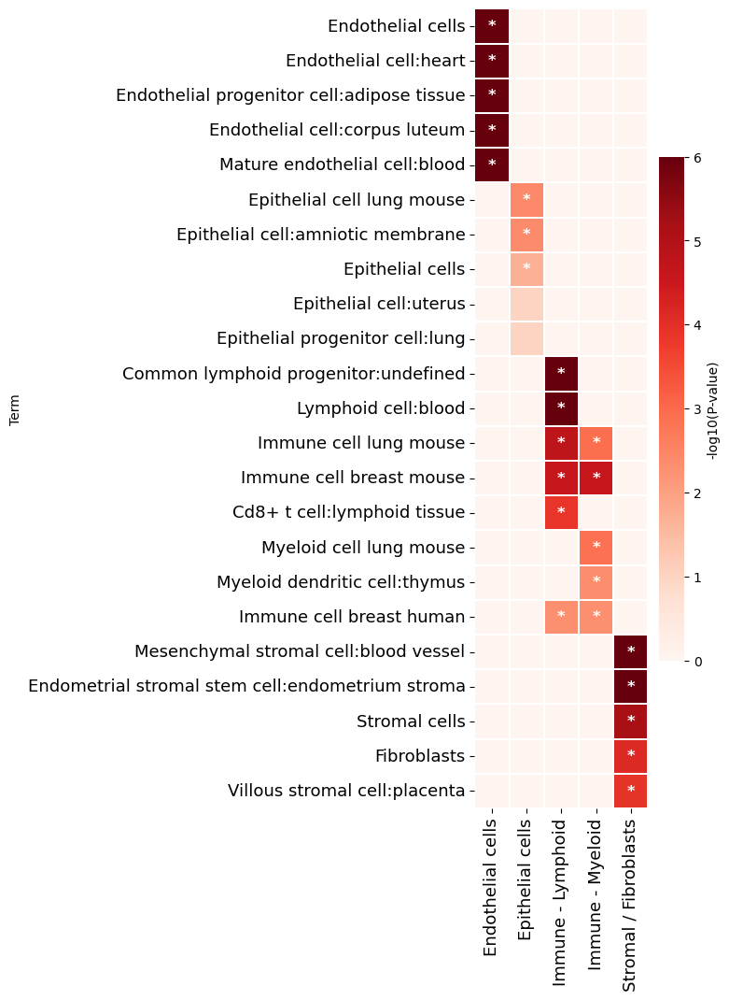

In [8]:
df_filtered = df[
    df.apply(
        lambda x: any(
            (
                (t in x['Term']) if '-' not in x['Term']
                else (t in x['Term'].split('-')[1].strip())
            )
            for t in str(x['Leiden']).split()
        ),
        axis=1
    )
]

df_sorted = df_filtered.sort_values(by='Rank')

fig, ax = heatmap_with_groupwise_ordering(
    df= df_sorted,
    n=5,
    group_by='Leiden',
    order_by="P-value",
    cmap='Reds',
    xlabel_rotation=90,
    xlabel_fontsize=13,
    ylabel_fontsize=13,
    figsize=(3, 14),
    vmin=0, vmax=6,
    cbar_kws={'shrink': 0.5, 'label': '-log10(P-value)'},
    enable_column_order=False,
    enable_highlight_columns=False)

In [16]:
adata

AnnData object with n_obs × n_vars = 300939 × 34694
    obs: 'Sample name', 'Organism', 'Individual', 'Developmental stage', 'Sex', 'Organism part', 'Disease', 'Cycle', 'Age', 'Age group', 'Dataset', 'Hormonal treatment', 'Endometriosis stage', '10x technology', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden_res_0.25', 'leiden_res_0.50', 'leiden_res_0.75', 'leiden_res_1.00', 'celltype_grouped'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'Age group_colors', 'Cyc

# Total Cell type proportion

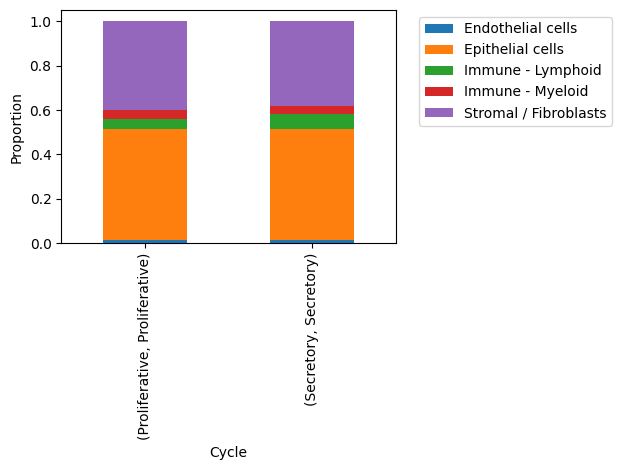

In [34]:
import pandas as pd
import matplotlib.pyplot as plt

df = adata.obs[['Cycle','celltype_grouped']].copy()

prop = (
    df.groupby(['Cycle','celltype_grouped'])
    .size()
    .groupby(level=0)
    .apply(lambda x: x / x.sum())
    .unstack(fill_value=0)
)

prop.plot(kind='bar', stacked=True)

plt.xlabel('Cycle')
plt.ylabel('Proportion')
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.tight_layout()
plt.show()

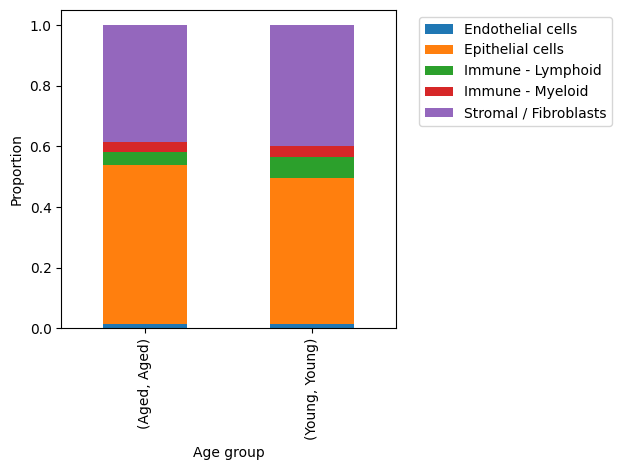

In [35]:
import pandas as pd
import matplotlib.pyplot as plt

df = adata.obs[['Age group','celltype_grouped']].copy()

prop = (
    df.groupby(['Age group','celltype_grouped'])
    .size()
    .groupby(level=0)
    .apply(lambda x: x / x.sum())
    .unstack(fill_value=0)
)

prop.plot(kind='bar', stacked=True)

plt.xlabel('Age group')
plt.ylabel('Proportion')
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.tight_layout()
plt.show()

# Epithelial subtypeing

In [1]:
import scanpy as sc
adata = sc.read_h5ad("/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/h5ad/After_Clustering.h5ad")

In [5]:
import scanpy as sc

adata_source = sc.read_h5ad("/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/h5ad/after_QC_Before_HVG_raw.h5ad")

common_barcodes = adata.obs_names.intersection(adata_source.obs_names)

adata = adata[common_barcodes].copy()
adata_source = adata_source[common_barcodes].copy()

adata._X = adata_source.X.copy()
adata._var = adata_source.var.copy()
adata._n_vars = adata_source.n_vars

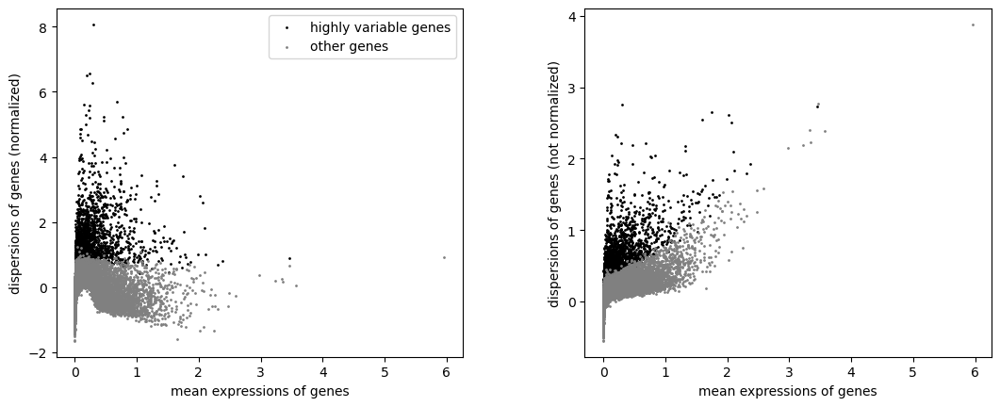

In [7]:
Epithelial = adata[adata.obs['celltype_grouped'] == 'Epithelial cells'].copy()
Epithelial.layers["counts"] = Epithelial.X.copy()
sc.pp.normalize_total(Epithelial)
sc.pp.log1p(Epithelial)

#Epithelial.raw = Epithelial.copy()
#Epithelial.X.expm1().sum(axis = 1)
#Epithelial.layers['normalize'] = Epithelial.X.copy()

sc.pp.highly_variable_genes(Epithelial, n_top_genes=2000, batch_key="Sample name")
sc.pl.highly_variable_genes(Epithelial)
Epithelial = Epithelial[:, Epithelial.var['highly_variable']].copy()

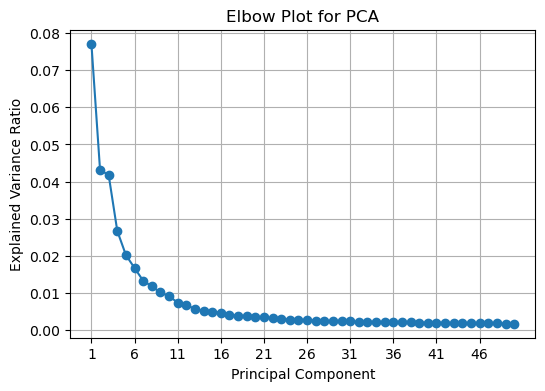

In [8]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

sc.tl.pca(Epithelial)
explained_variance_ratio = Epithelial.uns["pca"]["variance_ratio"]

plt.figure(figsize=(6, 4))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker="o", linestyle="-")
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.title("Elbow Plot for PCA")
plt.xticks(np.arange(1, len(explained_variance_ratio) + 1, step=5))
plt.grid()
plt.show()

In [9]:
sc.tl.pca(Epithelial, n_comps=31, svd_solver='arpack')

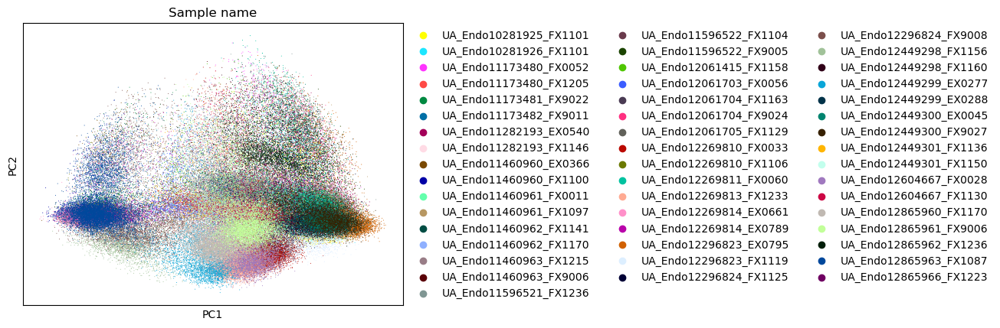

In [10]:
sc.pl.pca(
    Epithelial,
    color=["Sample name"],
    ncols=2,
    size=2,
)

/home/Data_Drive_8TB/kykim/.conda/envs/kykim/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


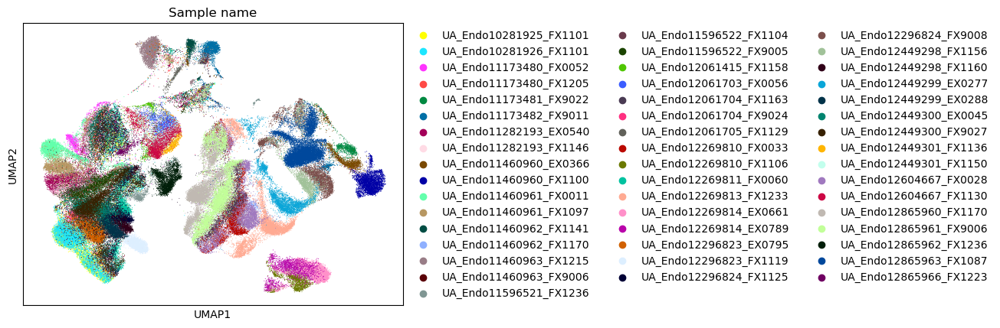

In [11]:
sc.pp.neighbors(Epithelial)
sc.tl.umap(Epithelial)
sc.pl.umap(
    Epithelial,
    color="Sample name",
    # Setting a smaller point size to get prevent overlap
    size=2,
)

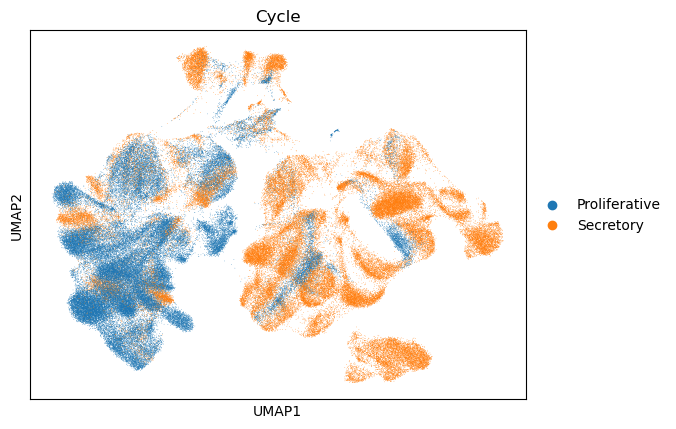

In [12]:
sc.pl.umap(Epithelial, color=["Cycle"])

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.
Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA RTX A5000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/home/Data_Drive_8TB/kykim/.conda/envs/kykim/lib/python3

Epoch 210/400:  52%|█████▎    | 210/400 [36:36<33:07, 10.46s/it, v_num=1, train_loss_step=1.1e+3, train_loss_epoch=1.15e+3] 
Monitored metric elbo_validation did not improve in the last 5 records. Best score: 1159.041. Signaling Trainer to stop.


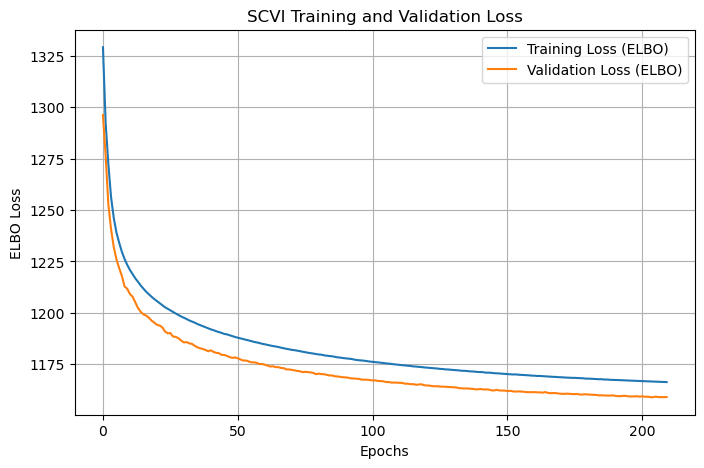

In [13]:
import scvi 
import matplotlib.pyplot as plt

scvi.model.SCVI.setup_anndata(Epithelial, layer="counts", batch_key="Sample name")
vae = scvi.model.SCVI(Epithelial, n_layers=2, n_latent=30, gene_likelihood="nb")

vae.train(max_epochs=400, early_stopping=True, early_stopping_patience=5)

train_loss = vae.history["elbo_train"]
val_loss = vae.history["elbo_validation"]
plt.figure(figsize=(8, 5))
plt.plot(train_loss, label="Training Loss (ELBO)")
plt.plot(val_loss, label="Validation Loss (ELBO)")
plt.xlabel("Epochs")
plt.ylabel("ELBO Loss")
plt.title("SCVI Training and Validation Loss")
plt.legend()
plt.grid()
plt.show()

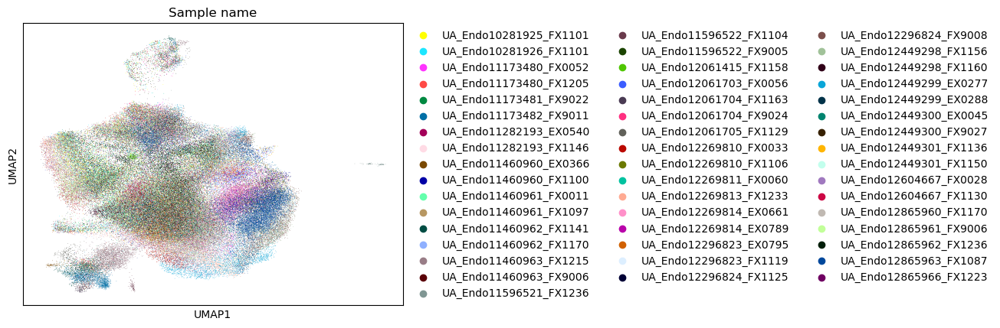

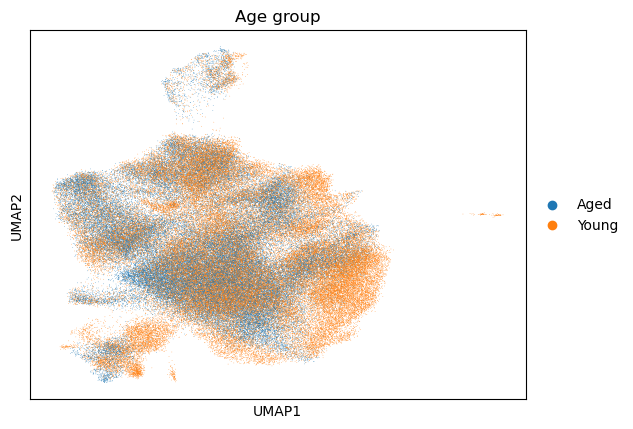

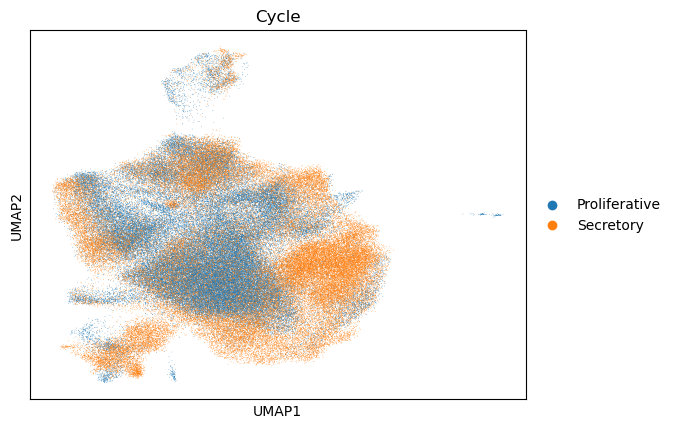

In [14]:
Epithelial.obsm["X_scVI"] = vae.get_latent_representation()
sc.pp.neighbors(Epithelial, use_rep = 'X_scVI')
sc.tl.umap(Epithelial)

sc.pl.umap(Epithelial, color=["Sample name"])
sc.pl.umap(Epithelial, color=["Age group"])
sc.pl.umap(Epithelial, color=["Cycle"])

In [15]:
import scanpy as sc

adata_source = sc.read_h5ad("/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/h5ad/after_QC_Before_HVG_raw.h5ad")

common_barcodes = Epithelial.obs_names.intersection(adata_source.obs_names)

Epithelial = Epithelial[common_barcodes].copy()
adata_source = adata_source[common_barcodes].copy()

adata_source = adata_source[Epithelial.obs_names].copy()

Epithelial._X = adata_source.X.copy()
Epithelial._var = adata_source.var.copy()
Epithelial._n_vars = adata_source.n_vars

In [16]:
sc.pp.normalize_total(Epithelial)
sc.pp.log1p(Epithelial)

In [17]:
for res in [1.00, 1.50, 2.00,2.50]:
    sc.tl.leiden(
        Epithelial, key_added=f"leiden_res_{res:4.2f}", resolution=res, 
        flavor="igraph"
    )

Cluster 0: ['NPAS3', 'ESR1', 'PGR', 'VWA8', 'EYA2', 'CPM', 'PLCB1', 'GREM2', 'SGCD', 'STX18', 'PALLD', 'EPB41L2', 'ANAPC4', 'FNDC3B', 'SORBS2', 'BMPR1B', 'OXR1', 'GCLC', 'KMO', 'ADAM28']
Cluster 1: ['NPAS3', 'ARHGAP26', 'TMEM101', 'CPM', 'MTCL1', 'ESR1', 'DNAJC10', 'PGR', 'KIAA1324', 'MAGI1', 'SMAD9', 'VWA8', 'ANAPC4', 'MCC', 'KMO', 'STX18', 'EPB41L2', 'EYA2', 'MAML3', 'TRMT9B']
Cluster 2: ['MIR924HG', 'DIAPH3', 'LINC01572', 'CENPK', 'BRIP1', 'NSD2', 'C21orf58', 'CENPP', 'POLQ', 'MELK', 'FANCI', 'DLEU2', 'TMPO', 'EZH2', 'ATAD2', 'CEP128', 'BRCA1', 'HELLS', 'NUSAP1', 'MIS18BP1']
Cluster 3: ['AUTS2', 'LINC02163', 'SOX5', 'KIZ', 'PHF21B', 'CASC15', 'DACH1', 'KIF26B', 'ROR1', 'TCF4', 'ITPR2', 'ATXN1', 'BCL2', 'ADGRL3', 'SNTB1', 'ADAMTS19', 'AFF3', 'KAZN', 'HMCN1', 'SDK1']
Cluster 4: ['RIMKLB', 'GRAMD1C', 'MAP3K5', 'SYNE2', 'PAEP', 'CATSPERB', 'SLC1A1', 'SESTD1', 'CDYL2', 'LINC01320', 'SLC15A1', 'A2ML1-AS1', 'LINC01541', 'SNX29', 'CXCL14', 'PHYHIPL', 'PAX8', 'NEAT1', 'MALAT1', 'B4GALNT3']
C

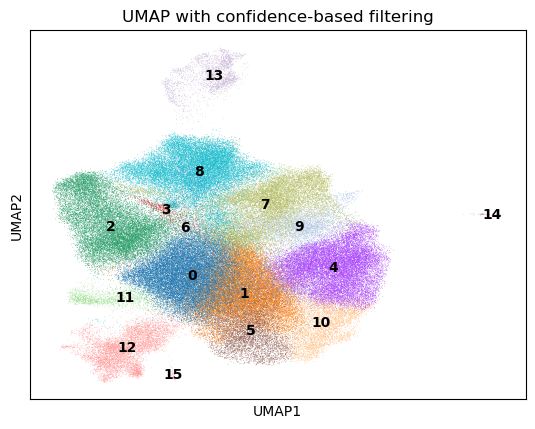

In [122]:
import scanpy as sc
sc.tl.rank_genes_groups(Epithelial, groupby='leiden_res_1.00', method='t-test')  # 또는 'wilcoxon'
top_genes = {}
groups = Epithelial.uns['rank_genes_groups']['names'].dtype.names  # 클러스터 이름들
for group in groups:
    genes = Epithelial.uns['rank_genes_groups']['names'][group][:20]
    top_genes[group] = genes.tolist()


for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {genes}")
sc.pl.umap(
    Epithelial,
    color='leiden_res_1.00',
    title='UMAP with confidence-based filtering',
    legend_loc='on data')

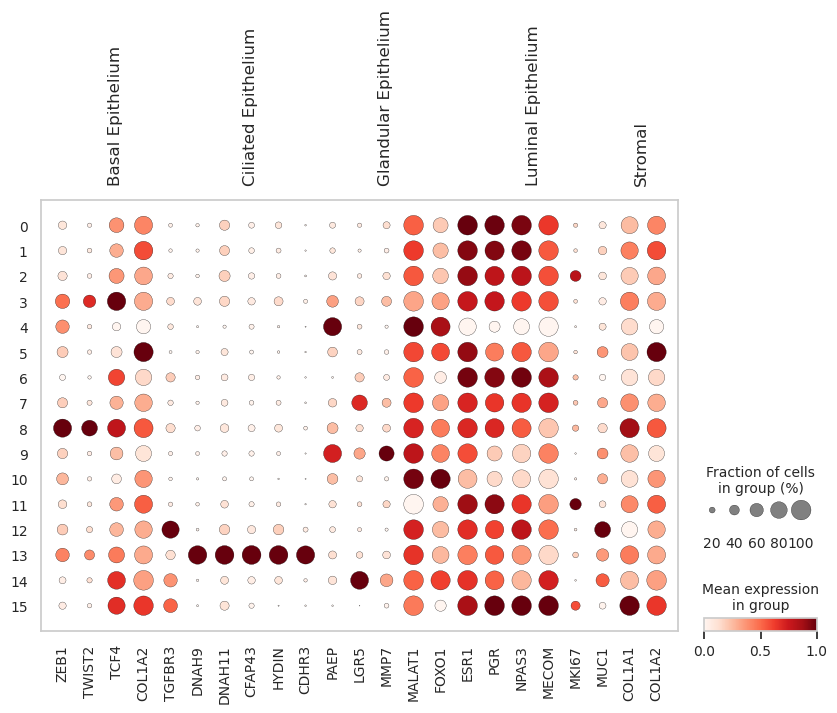

In [369]:
Epithelial_subtype_markers_human = {
    "Basal Epithelium": [
        "ZEB1", "TWIST2", "TCF4", "COL1A2", "TGFBR3",
    ],
    "Ciliated Epithelium": [
        "DNAH9", "DNAH11", "CFAP43", "HYDIN", "CDHR3",
    ],
    "Glandular Epithelium": [
        "PAEP", "LGR5", "MMP7", "MALAT1", "FOXO1",
    ],
    "Luminal Epithelium": [
        "ESR1", "PGR", "NPAS3", "MECOM", "MKI67","MUC1"
    ],
    "Stromal" : ['COL1A1','COL1A2']
}

existing_subtype_markers = {
    subtype: [gene for gene in genes if gene in Epithelial.var_names]
    for subtype, genes in Epithelial_subtype_markers_human.items()}

sc.pl.dotplot(
    Epithelial,
    var_names=existing_subtype_markers,
    groupby="leiden_res_1.00",
    standard_scale="var",
    dendrogram=False)

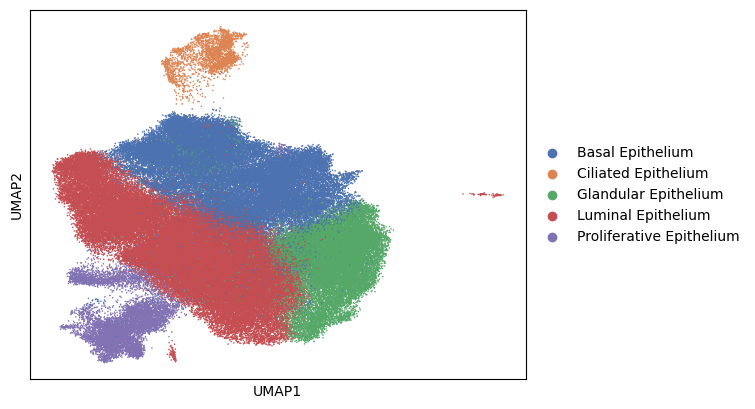

In [2]:
import scanpy as sc

cluster_to_group = {
    0: "Luminal Epithelium",
    1: "Luminal Epithelium",
    2: "Luminal Epithelium",
    3: "Basal Epithelium", 
    4: "Glandular Epithelium",
    5: "Luminal Epithelium",
    6: "Luminal Epithelium",
    7: "Basal Epithelium", #
    8: "Basal Epithelium",  
    9: "Basal Epithelium", #
    10: "Glandular Epithelium",
    11: "Proliferative Epithelium", 
    12: "Proliferative Epithelium",
    13: "Ciliated Epithelium",
    14: "Luminal Epithelium", 
    15: "Luminal Epithelium",
}


Epithelial.obs["subtype"] = Epithelial.obs["leiden_res_1.00"].astype(int).map(cluster_to_group)
sc.pl.umap(
    Epithelial,
    color='subtype',
    title='',
    s = 5
)

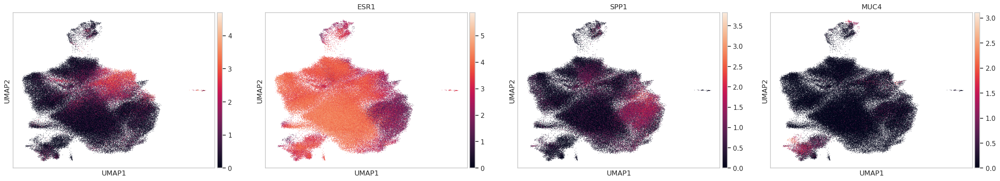

In [161]:
import scanpy as sc
sc.pl.umap(
    Epithelial,
    color=['LGR5','ESR1','SPP1','MUC4'],
    title='',
    s = 2
)

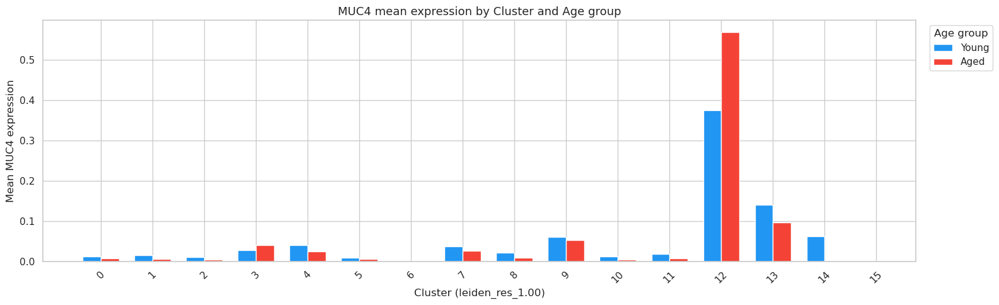

In [372]:
import matplotlib.pyplot as plt
import pandas as pd

gene = "MUC4"

def get_expr_df(adata, gene, group_col, age_col):
    expr = adata[:, gene].X.toarray().flatten() if hasattr(adata[:, gene].X, 'toarray') else adata[:, gene].X.flatten()
    df = pd.DataFrame({
        "expr": expr,
        "cluster": adata.obs[group_col].astype(str).values,
        "age": adata.obs[age_col].values
    })
    return df

df = get_expr_df(Epithelial, gene, "leiden_res_1.00", "Age group")

clusters = sorted(df["cluster"].unique(), key=lambda x: int(x))

mean_df = df.groupby(["cluster", "age"])["expr"].mean().reset_index()
mean_df["cluster"] = pd.Categorical(mean_df["cluster"], categories=clusters, ordered=True)
mean_df = mean_df.sort_values("cluster")

fig, ax = plt.subplots(figsize=(16, 5))

x = range(len(clusters))
width = 0.35

young = mean_df[mean_df["age"] == "Young"].set_index("cluster").reindex(clusters)
aged  = mean_df[mean_df["age"] == "Aged"].set_index("cluster").reindex(clusters)

ax.bar([i - width/2 for i in x], young["expr"], width=width, label="Young", color="#2196F3")
ax.bar([i + width/2 for i in x], aged["expr"],  width=width, label="Aged",  color="#F44336")

ax.set_xticks(list(x))
ax.set_xticklabels(clusters, rotation=45)
ax.set_xlabel("Cluster (leiden_res_1.00)", fontsize=12)
ax.set_ylabel("Mean MUC4 expression", fontsize=12)
ax.set_title("MUC4 mean expression by Cluster and Age group", fontsize=13)
ax.legend(title="Age group", bbox_to_anchor=(1.01, 1), loc='upper left')

plt.tight_layout()
plt.show()

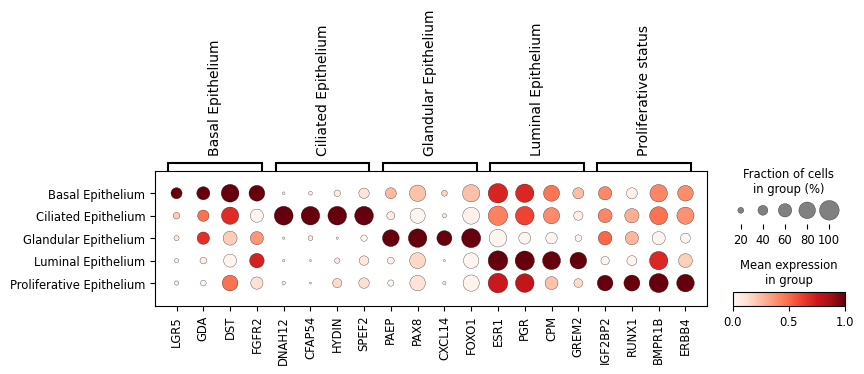

In [3]:
Epithelial_subtype_markers_human = {
    "Basal Epithelium": [
        "LGR5", "GDA", "DST", "FGFR2"
    ],
    "Ciliated Epithelium": [
        "DNAH12", "CFAP54", "HYDIN", "SPEF2"
    ],
    "Glandular Epithelium": [
        "PAEP", "PAX8", "CXCL14", "FOXO1"
    ],
    "Luminal Epithelium": [
        "ESR1", "PGR", "CPM", "GREM2"
    ],
    "Proliferative status": [
        "IGF2BP2", "RUNX1", "BMPR1B", "ERBB4"
    ]
}
existing_subtype_markers = {
    subtype: [gene for gene in genes if gene in Epithelial.var_names]
    for subtype, genes in Epithelial_subtype_markers_human.items()}

sc.pl.dotplot(
    Epithelial,
    var_names=existing_subtype_markers,
    groupby="subtype",
    standard_scale="var",
    dendrogram=False)

In [665]:
import scanpy as sc
sc.tl.rank_genes_groups(Epithelial, groupby='subtype', method='t-test')  # 또는 'wilcoxon'
top_genes = {}
groups = Epithelial.uns['rank_genes_groups']['names'].dtype.names  # 클러스터 이름들
for group in groups:
    genes = Epithelial.uns['rank_genes_groups']['names'][group][:50]
    top_genes[group] = genes.tolist()


for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {genes}")

Cluster Basal Epithelium: ['NRP1', 'DST', 'NLGN4X', 'NR2F2-AS1', 'NLGN1', 'LSAMP', 'PSD3', 'CDH11', 'SVIL', 'LGR5', 'TSHZ3', 'LDB2', 'HPSE2', 'ZEB1', 'TCF7L2', 'MIR99AHG', 'SOX5', 'ATXN1', 'PLEKHH2', 'ALDH1A2', 'AC012409.2', 'TLE4', 'PRDM1', 'RORB', 'FAM155A', 'TWIST2', 'MEIS1', 'SLC24A3', 'SAMD4A', 'KAZN', 'PCSK5', 'SNCAIP', 'RUNX1T1', 'CHSY3', 'GDA', 'DLC1', 'AC092691.1', 'ROBO2', 'TPST1', 'KIF26B', 'DPP6', 'WWTR1', 'GALNT17', 'PLPP1', 'EBF1', 'INPP4B', 'ANTXR1', 'CFI', 'SHISA6', 'KLHL29']
Cluster Ciliated Epithelium: ['DNAH12', 'ARMC3', 'CFAP54', 'CFAP43', 'STK33', 'LRRIQ1', 'CFAP299', 'HYDIN', 'DNAH7', 'DNAH9', 'DNAH11', 'WDR49', 'CDHR3', 'AGBL4', 'TMEM232', 'SPAG17', 'DCDC1', 'DNAH6', 'DNAAF1', 'SPEF2', 'CFAP47', 'RFX3', 'FHAD1', 'CCDC30', 'ZBBX', 'CEP126', 'ADGB', 'CFAP157', 'RFX2', 'MAPK10', 'ULK4', 'RSPH1', 'SPATA17', 'VWA3A', 'CFAP70', 'SPAG16', 'DNAH5', 'TEKT1', 'LINC01091', 'DTHD1', 'SERPINI2', 'DNAI1', 'WDR78', 'WDR66', 'NEK10', 'C4orf47', 'PACRG', 'FANK1', 'MOK', 'CFAP61']

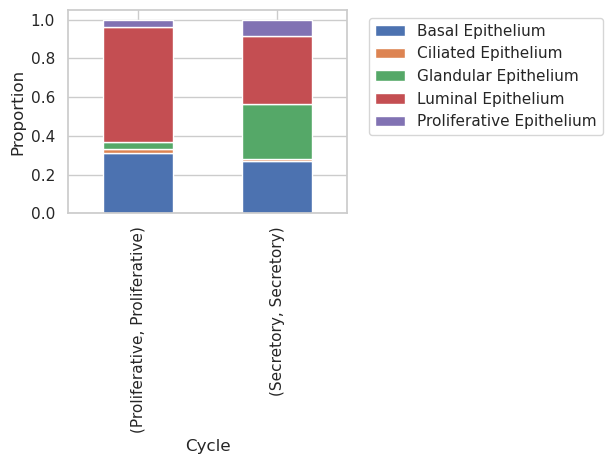

In [667]:
import pandas as pd
import matplotlib.pyplot as plt

df = Epithelial.obs[['Cycle','subtype']].copy()

prop = (
    df.groupby(['Cycle','subtype'])
    .size()
    .groupby(level=0)
    .apply(lambda x: x / x.sum())
    .unstack(fill_value=0)
)

prop.plot(kind='bar', stacked=True)

plt.xlabel('Cycle')
plt.ylabel('Proportion')
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.tight_layout()
plt.show()

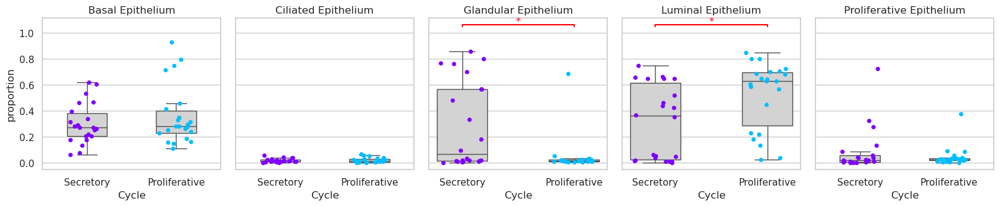

In [668]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ranksums
import warnings
import scanpy as sc

warnings.filterwarnings("ignore")
sns.set(style="whitegrid")

clin_palette = {
    'Secretory': '#8000ff',
    'Proliferative': '#00bfff',
    'Menstrual': '#ff8c00'
}

Epithelial.obs['Each mouse'] = Epithelial.obs['Individual']

adata_filtered = Epithelial[Epithelial.obs['Organism part'] != 'spleen'].copy()
adata_filtered = adata_filtered[
    adata_filtered.obs['Cycle'].isin(['Secretory','Proliferative'])
]

group_order = ['Secretory', 'Proliferative']

subtypes = sorted(adata_filtered.obs['subtype'].dropna().unique())

def normalize_mouse(df):
    total = df['count'].sum()
    df['proportion'] = df['count'] / total if total > 0 else 0
    return df

mouse_props_list = []

for (mouse, cycle), grp_df in adata_filtered.obs.groupby(['Each mouse','Cycle']):
    count_df = grp_df.groupby('subtype').size().reset_index(name='count')
    count_df['Each mouse'] = mouse
    count_df['Cycle'] = cycle
    mouse_props_list.append(normalize_mouse(count_df))

mouse_props = pd.concat(mouse_props_list, ignore_index=True)

n_rows, n_cols = 1, 5
fig, axes = plt.subplots(n_rows, n_cols, figsize=(3.25*n_cols, 3.5*n_rows), sharey=True)

axes = axes.flatten()

for i, subtype in enumerate(subtypes):
    ax = axes[i]

    data_sub = mouse_props[mouse_props['subtype'] == subtype]

    sns.boxplot(
        x='Cycle', y='proportion', data=data_sub, ax=ax,
        order=group_order,
        boxprops={'facecolor': 'lightgray'},
        fliersize=0,
        width=0.45
    )

    for cond in data_sub['Cycle'].unique():
        sub_df = data_sub[data_sub['Cycle'] == cond]
        sns.stripplot(
            x='Cycle', y='proportion', data=sub_df,
            color=clin_palette.get(cond, 'black'),
            jitter=0.2,
            size=5,
            ax=ax,
            order=group_order
        )

    pairs = [('Secretory','Proliferative'),
             ('Secretory','Menstrual'),
             ('Proliferative','Menstrual')]

    for j, (g1, g2) in enumerate(pairs):
        v1 = data_sub[data_sub['Cycle'] == g1]['proportion']
        v2 = data_sub[data_sub['Cycle'] == g2]['proportion']

        if len(v1) > 0 and len(v2) > 0:
            _, p = ranksums(v1, v2)
            if p < 0.05:
                x1, x2 = group_order.index(g1), group_order.index(g2)
                y = 1.05 + j * 0.05
                ax.plot([x1, x1, x2, x2], [y, y+0.01, y+0.01, y], c='red')
                ax.text((x1+x2)/2, y+0.015, "*", ha='center', color='red')

    ax.set_title(subtype)

for j in range(len(subtypes), n_rows * n_cols):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [523]:
# # Epithelial.__dict__['_varm'].clear()
# # Epithelial.__dict__['_layers'].clear()

# del Epithelial.layers['counts']
# del Epithelial.varm['PCs']

In [669]:
Epithelial.write("/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/h5ad/Epithelial.h5ad")

# Mean pseudobulk

In [1]:
import scanpy as sc
Epithelial = sc.read_h5ad("/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/h5ad/Epithelial.h5ad")

In [169]:
import scanpy as sc

adata_source = sc.read_h5ad("/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/h5ad/after_QC_Before_HVG_raw.h5ad")

common_barcodes = Epithelial.obs_names.intersection(adata_source.obs_names)

Epithelial = Epithelial[common_barcodes].copy()
adata_source = adata_source[common_barcodes].copy()

adata_source = adata_source[Epithelial.obs_names].copy()

Epithelial._X = adata_source.X.copy()
Epithelial._var = adata_source.var.copy()
Epithelial._n_vars = adata_source.n_vars

In [170]:
Epithelial = Epithelial#

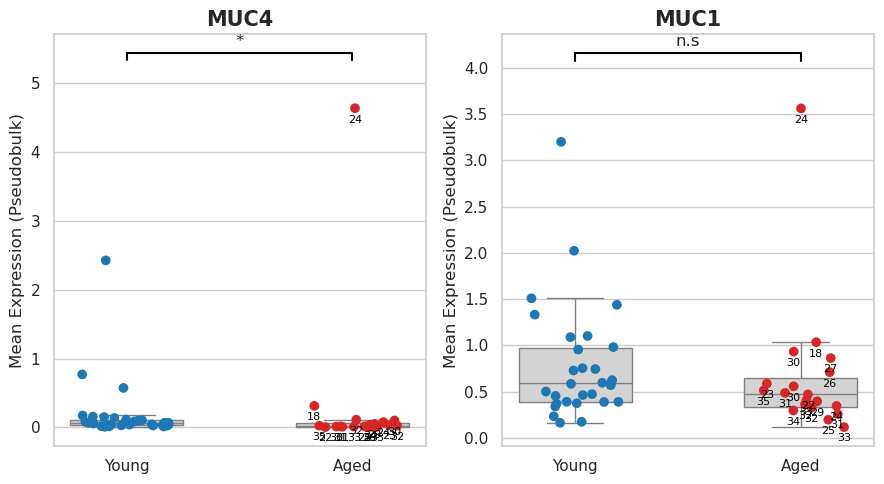

In [171]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ranksums
import numpy as np
import scanpy as sc

adata = Epithelial

genes = ["MUC4", "MUC1"]
genes = [g for g in genes if g in adata.var_names]

age_palette = {'Young': '#1f77b4', 'Aged': '#d62728'}
group_order = ["Young", "Aged"]

plot_list = []
expr_df = adata.to_df()
obs_df = adata.obs

for gene in genes:
    df_gene = expr_df[gene]
    unique_samples = obs_df["Sample name"].unique()
    
    for sample in unique_samples:
        idx = obs_df.index[obs_df["Sample name"] == sample]
        if len(idx) == 0:
            continue
            
        mean_exp = df_gene.loc[idx].mean()
        
        age_val = obs_df.loc[idx, "Age"].iloc[0]
        age_grp = obs_df.loc[idx, "Age group"].iloc[0]
        
        plot_list.append({
            "Gene": gene,
            "Sample": sample,
            "Age": age_val,
            "Age group": age_grp,
            "MeanExpression": mean_exp
        })

plot_df = pd.DataFrame(plot_list)

fig, axes = plt.subplots(1, len(genes), figsize=(4.5 * len(genes), 5))
if len(genes) == 1: axes = [axes]

for i, gene in enumerate(genes):
    ax = axes[i]
    
    sub_df = plot_df[plot_df["Gene"] == gene].copy()
    sub_df["Age group"] = pd.Categorical(sub_df["Age group"], categories=group_order, ordered=True)
    sub_df = sub_df.sort_values("Age group").reset_index(drop=True)

    sns.boxplot(
        data=sub_df, x="Age group", y="MeanExpression", 
        order=group_order, color="lightgray", ax=ax, width=0.5, fliersize=0
    )

    sns.stripplot(
        data=sub_df, x="Age group", y="MeanExpression", hue="Age group",
        palette=age_palette, order=group_order, size=7, jitter=0.2, ax=ax, dodge=False
    )

    y_max = sub_df["MeanExpression"].max()
    y_min = sub_df["MeanExpression"].min()
    y_range = y_max - y_min

    offsets = ax.collections[-1].get_offsets()
    for j, (x_coord, y_coord) in enumerate(offsets):
        row = sub_df.iloc[j]
        ax.text(
            x=x_coord,
            y=y_coord - (y_range * 0.02),
            s=str(int(row["Age"])),
            fontsize=8,
            color='black',
            ha='center',
            va='top'
        )

    young = sub_df[sub_df["Age group"] == "Young"]["MeanExpression"]
    aged = sub_df[sub_df["Age group"] == "Aged"]["MeanExpression"]
    stat, p = ranksums(young, aged)
    
    sig = "***" if p < 0.001 else "**" if p < 0.01 else "*" if p < 0.05 else "n.s"
    y_line = y_max + (y_range * 0.15)
    
    ax.plot([0, 0, 1, 1], [y_line, y_line*1.02, y_line*1.02, y_line], lw=1.5, c='black')
    ax.text(0.5, y_line*1.03, sig, ha='center', va='bottom', fontsize=12)

    ax.set_title(f"{gene}", fontsize=15, fontweight='bold')
    ax.set_xlabel("")
    ax.set_ylabel("Mean Expression (Pseudobulk)")
    if ax.get_legend(): ax.get_legend().remove()

plt.tight_layout()
plt.show()

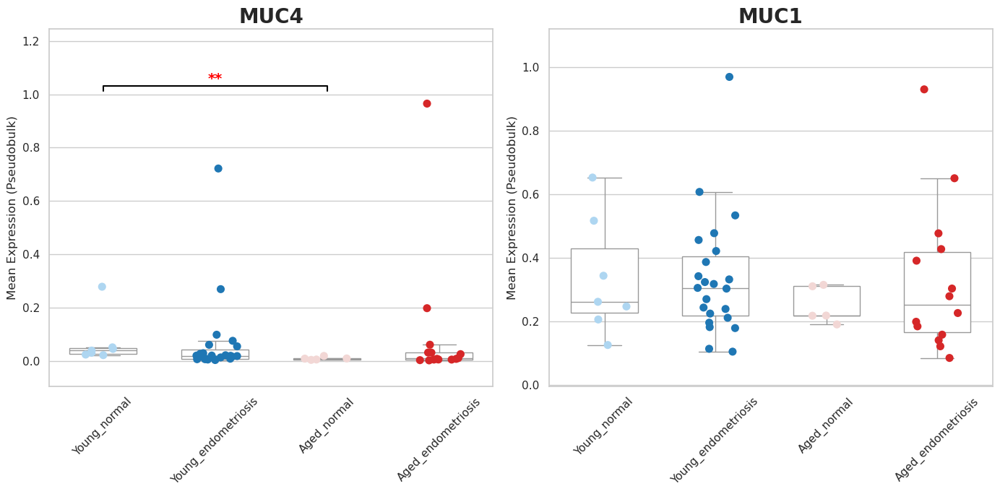

In [172]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ranksums
import numpy as np
import scanpy as sc
from itertools import combinations

file_path = "/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/h5ad/Epithelial.h5ad"
adata = sc.read_h5ad(file_path)

adata.obs['Condition'] = adata.obs['Age group'].astype(str) + "_" + adata.obs['Disease'].astype(str)

genes = ["MUC4", "MUC1"]
genes = [g for g in genes if g in adata.var_names]

group_order = [
    "Young_normal", "Young_endometriosis", 
    "Aged_normal", "Aged_endometriosis"
]

condition_palette = {
    "Young_normal": "#AED6F1",
    "Young_endometriosis": "#1F77B4",
    "Aged_normal": "#F2D7D5",
    "Aged_endometriosis": "#D62728"
}

plot_list = []
expr_df = adata.to_df()
obs_df = adata.obs

for gene in genes:
    df_gene = expr_df[gene]
    unique_samples = obs_df["Sample name"].unique()
    
    for sample in unique_samples:
        idx = obs_df.index[obs_df["Sample name"] == sample]
        if len(idx) == 0: continue
            
        mean_exp = df_gene.loc[idx].mean()
        condition = obs_df.loc[idx, "Condition"].iloc[0]
        
        plot_list.append({
            "Gene": gene,
            "Sample": sample,
            "Condition": condition,
            "MeanExpression": mean_exp
        })

plot_df = pd.DataFrame(plot_list)

fig, axes = plt.subplots(1, len(genes), figsize=(7 * len(genes), 7))
if len(genes) == 1: axes = [axes]

for i, gene in enumerate(genes):
    ax = axes[i]
    sub_df = plot_df[plot_df["Gene"] == gene].copy()
    
    actual_groups = [g for g in group_order if g in sub_df["Condition"].unique()]
    sub_df["Condition"] = pd.Categorical(sub_df["Condition"], categories=actual_groups, ordered=True)
    sub_df = sub_df.sort_values("Condition").reset_index(drop=True)

    sns.boxplot(
        data=sub_df, x="Condition", y="MeanExpression", 
        order=actual_groups, color="white", ax=ax, width=0.6, fliersize=0
    )

    sns.stripplot(
        data=sub_df, x="Condition", y="MeanExpression", hue="Condition",
        palette=condition_palette, order=actual_groups, size=8, jitter=0.2, ax=ax, dodge=False
    )

    y_max_base = sub_df["MeanExpression"].max()
    y_range = y_max_base - sub_df["MeanExpression"].min()
    line_offset = y_range * 0.12  # 브래킷 사이의 간격
    current_y_top = y_max_base + (y_range * 0.05)

    combos = list(combinations(actual_groups, 2))

    for g1, g2 in combos:
        data1 = sub_df[sub_df["Condition"] == g1]["MeanExpression"]
        data2 = sub_df[sub_df["Condition"] == g2]["MeanExpression"]
        
        if len(data1) < 2 or len(data2) < 2: continue
        
        stat, p = ranksums(data1, data2)
        
        if p < 0.05:
            sig = "***" if p < 0.001 else "**" if p < 0.01 else "*"
            
            x1 = actual_groups.index(g1)
            x2 = actual_groups.index(g2)
            
            ax.plot([x1, x1, x2, x2], [current_y_top, current_y_top + (y_range*0.02), current_y_top + (y_range*0.02), current_y_top], 
                    lw=1.5, c='black')
            ax.text((x1 + x2) * 0.5, current_y_top + (y_range*0.02), sig, 
                    ha='center', va='bottom', color='red', fontsize=14, fontweight='bold')
            
            current_y_top += line_offset

    ax.set_title(f"{gene}", fontsize=20, fontweight='bold')
    ax.set_xlabel("")
    ax.set_ylabel("Mean Expression (Pseudobulk)")
    ax.set_xticklabels(actual_groups, rotation=45)
    ax.set_ylim(bottom=sub_df["MeanExpression"].min() - (y_range*0.1), top=current_y_top + line_offset)
    
    if ax.get_legend(): ax.get_legend().remove()

plt.tight_layout()
plt.show()

# Epithelial DESeq

In [173]:
import scanpy as sc
Epithelial = sc.read_h5ad("/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/h5ad/Epithelial.h5ad")

In [174]:
temp_comb = Epithelial.obs['Age group'].astype(str) + "_" + Epithelial.obs['Disease'].astype(str)


status_map = {
    "Young_normal": "Young_normal",
    "Young_endometriosis": "Young_endometriosis",
    "Aged_normal": "Aged_normal",
    "Aged_endometriosis": "Aged_endometriosis"
}

Epithelial.obs['Status'] = temp_comb.map(status_map)
print(Epithelial.obs['Status'].value_counts())

Status
Young_endometriosis    66588
Aged_endometriosis     47796
Aged_normal            18713
Young_normal           17125
Name: count, dtype: int64


In [175]:
print(Epithelial.obs["Cycle"].value_counts())
print(Epithelial.obs["Age group"].value_counts())
print(Epithelial.obs["Hormonal treatment"].value_counts())
print(Epithelial.obs["Endometriosis stage"].value_counts())
print(Epithelial.obs["Dataset"].value_counts())

Cycle
Secretory        76636
Proliferative    73586
Name: count, dtype: int64
Age group
Young    83713
Aged     66509
Name: count, dtype: int64
Series([], Name: count, dtype: int64)
Endometriosis stage
0    35838
1    35342
2    32449
3    24242
4    22351
Name: count, dtype: int64
Dataset
Mareckova-nuclei            127432
Mareckova-cells & nuclei     22790
Name: count, dtype: int64


In [176]:
#del Epithelial.layers['normalize']
#del Epithelial.layers['counts']
#del Epithelial.varm['PCs']

In [190]:
adata = Epithelial[Epithelial.obs['subtype'] == 'Luminal Epithelium'].copy()

In [191]:
import scanpy as sc

adata_raw = sc.read_h5ad("/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/h5ad/raw_total.h5ad")
adata_anno = adata

common_cells = adata_raw.obs_names.intersection(adata_anno.obs_names)

adata_raw = adata_raw[common_cells].copy()
adata_anno = adata_anno[common_cells].copy()

adata_raw.obs["subtype"] = adata_anno.obs["subtype"]
adata_raw.obs['Status'] = adata_anno.obs['Status']

In [192]:
adata_raw.obs['Age group'] = (adata_raw.obs['Age'] > 35).map({True: 'Aged', False: 'Young'})

In [193]:
import pandas as pd
import os

outdir = "/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/DESeq2/"
os.makedirs(outdir, exist_ok=True)
counts = adata_raw.X
genes = adata_raw.var_names
for mc in adata_raw.obs["subtype"].unique():
    ad = adata_raw[adata_raw.obs["subtype"] == mc]
    
    mat = ad.X
    df = pd.DataFrame(
        mat.T.toarray() if hasattr(mat, "toarray") else mat.T,
        index=genes, columns=ad.obs_names)
    
    pb = df.groupby(ad.obs["Sample name"], axis=1).sum()
    pb.to_csv(f"{outdir}/pseudobulk_module_cluster_{mc}.csv")

In [194]:
outdir = "/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/DESeq2/"
os.makedirs(outdir, exist_ok=True)

df = (
    adata_raw.obs[["Sample name", "Cycle","Age group", "Disease","Age","Endometriosis stage","Dataset",
                  "Hormonal treatment","Status"]]
    .drop_duplicates()
    .sort_values("Sample name"))
df.to_csv(f"{outdir}/sample_id_age_group.csv", index=False)

In [20]:
import pandas as pd

df = pd.read_csv(
    "/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/DESeq2/Total_Luminal_bulk_rna_ntd_preprocess.csv",
    index_col=0)

dfs = pd.read_csv(
    "/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/DESeq2/sample_id_age_group.csv",
    index_col=0)

In [21]:
df

,UA_Endo10281925_FX1101,UA_Endo10281926_FX1101,UA_Endo11282193_EX0540,UA_Endo11282193_FX1146,UA_Endo11460961_FX0011,UA_Endo11460962_FX1170,UA_Endo11460963_FX9006,UA_Endo11596521_FX1236,UA_Endo11596522_FX1104,UA_Endo11596522_FX9005,...,UA_Endo12269814_EX0789,UA_Endo12296824_FX9008,UA_Endo12449298_FX1160,UA_Endo12449299_EX0277,UA_Endo12604667_FX0028,UA_Endo12604667_FX1130,UA_Endo12865960_FX1170,UA_Endo12865961_FX9006,UA_Endo12865963_FX1087,UA_Endo12865966_FX1223
AL627309.1,3.254179,3.509378,2.485157,2.513817,3.804014,3.146206,3.082791,2.686314,2.424434,2.480380,...,4.793798,0.000000,3.323694,2.286262,2.631405,2.552414,2.965896,2.662283,2.664017,3.795904
AL627309.5,5.445286,5.251651,3.397607,3.761651,4.733268,4.420781,4.599784,4.237513,4.346589,4.090138,...,4.234609,3.790657,4.202419,2.737191,4.158082,3.135180,3.715437,3.269600,3.545462,4.003381
AL627309.4,4.028572,3.480161,0.000000,0.000000,0.224547,0.836186,0.000000,0.000000,0.000000,0.818366,...,4.793798,0.000000,2.794913,0.376624,1.818820,1.779501,1.187424,1.448245,0.000000,1.654536
AL669831.2,2.652474,2.218082,0.000000,0.836098,0.418806,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.309279,0.000000,1.951413,1.480163,1.425075,0.980559,0.888802,1.106017,0.000000,2.896206
LINC01409,7.823125,7.561388,6.996916,6.654239,6.607319,7.353695,6.972026,6.671954,7.345385,7.014048,...,7.412285,7.276745,7.816899,7.673434,7.411347,7.404024,7.595967,7.193375,6.137368,7.520412
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AL354822.1,2.302082,1.312623,5.506416,4.252472,4.742374,5.053037,6.767342,3.977891,5.868153,5.346857,...,0.000000,7.015570,5.273798,7.796617,7.983509,4.690270,3.282334,6.349282,3.545462,5.309902
AL592183.1,0.183424,0.424863,7.333442,8.338618,7.937788,7.641597,8.372653,8.685999,7.849509,7.245771,...,9.135710,9.077439,8.338969,6.752101,7.617302,8.120863,7.331884,8.261372,7.848823,8.558185
AC240274.1,3.147857,3.307948,4.363741,3.919709,4.115685,4.062337,3.658088,3.828158,3.880546,3.449468,...,3.309279,3.790657,3.567504,2.371895,2.899225,4.284764,3.738633,3.890453,0.000000,4.854338
AC004556.3,3.822814,3.760893,0.749600,0.836098,1.123583,0.000000,1.411730,1.352382,0.699575,0.466448,...,0.000000,3.790657,3.542361,0.376624,1.086460,1.298567,0.712577,1.522468,0.000000,0.000000


In [22]:
gene = "MUC4"

common_samples = df.columns.intersection(dfs.index)

expr = df.loc[gene, common_samples]

meta = dfs.loc[common_samples, "Age group"]

sub_df = pd.DataFrame({
    "sample_id": common_samples,
    "Age group": meta,
    "Expression": expr
})

young_df = sub_df[sub_df["Age group"] == "Young"]
aged_df = sub_df[sub_df["Age group"] == "Aged"]

aged_sorted = aged_df.sort_values(by="Expression", ascending=True)
young_sorted = young_df.sort_values(by="Expression", ascending=False)

print("Aged (low → high):")
print(aged_sorted["sample_id"].tolist())

print("\nYoung (high → low):")
print(young_sorted["sample_id"].tolist())

Aged (low → high):
['UA_Endo11173481_FX9022', 'UA_Endo11173480_FX1205', 'UA_Endo11596522_FX9005', 'UA_Endo11460961_FX0011', 'UA_Endo11282193_FX1146', 'UA_Endo12865960_FX1170', 'UA_Endo12449300_FX9027', 'UA_Endo12269813_FX1233', 'UA_Endo11282193_EX0540', 'UA_Endo10281925_FX1101', 'UA_Endo12061704_FX1163', 'UA_Endo12449299_EX0288', 'UA_Endo11173480_FX0052', 'UA_Endo10281926_FX1101', 'UA_Endo12449301_FX1150', 'UA_Endo12449298_FX1160', 'UA_Endo11460960_FX1100', 'UA_Endo12269814_EX0789']

Young (high → low):
['UA_Endo11460963_FX1215', 'UA_Endo12269814_EX0661', 'UA_Endo12296824_FX9008', 'UA_Endo12061705_FX1129', 'UA_Endo12269810_FX1106', 'UA_Endo11460962_FX1170', 'UA_Endo12865963_FX1087', 'UA_Endo12061703_FX0056', 'UA_Endo12604667_FX1130', 'UA_Endo11460960_EX0366', 'UA_Endo12296823_EX0795', 'UA_Endo12296823_FX1119', 'UA_Endo12865962_FX1236', 'UA_Endo11460963_FX9006', 'UA_Endo12449298_FX1156', 'UA_Endo12865966_FX1223', 'UA_Endo11596521_FX1236', 'UA_Endo12865961_FX9006', 'UA_Endo12061704_FX902

In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr

age_palette = {
    'endometrosis': '#1f77b4',
    'normal': '#d62728'
}

exclude_samples = {}
slope = 1
intercept = 0 
threshold_scale = 20

common_samples = df.columns.intersection(dfs.index)
common_samples = [s for s in common_samples if s not in exclude_samples]

df_sub = df[common_samples]
dfs_sub = dfs.loc[common_samples]

mxd1_vst = df_sub.loc["MXD1", common_samples]
muc4_vst = df_sub.loc["MUC4", common_samples]

mxd1_z = (mxd1_vst - np.mean(mxd1_vst)) / np.std(mxd1_vst)
muc4_z = (muc4_vst - np.mean(muc4_vst)) / np.std(muc4_vst)

scatter_df = pd.DataFrame({
    "sample_id": common_samples,
    "MXD1": mxd1_z,
    "MUC4": muc4_z,
    "Disease": dfs_sub.loc[common_samples, "Disease"].values
})

x = scatter_df["MXD1"].values
y = scatter_df["MUC4"].values

residuals = y - (slope * x + intercept)
sd = np.std(residuals)

scatter_df["outlier"] = np.abs(residuals) > threshold_scale * sd

inliers = scatter_df[~scatter_df["outlier"]]

if len(inliers) >= 2:
    r_p, p_p = pearsonr(inliers["MXD1"], inliers["MUC4"])
    r_s, p_s = spearmanr(inliers["MXD1"], inliers["MUC4"])
else:
    r_p, p_p = np.nan, np.nan
    r_s, p_s = np.nan, np.nan

plt.figure(figsize=(6,6))

sns.scatterplot(
    data=inliers,
    x="MXD1",
    y="MUC4",
    hue="Disease",
    palette=age_palette,
    s=60
)

sns.scatterplot(
    data=scatter_df[scatter_df["outlier"]],
    x="MXD1",
    y="MUC4",
    color="gray",
    s=80,
    legend=False
)

xmin, xmax = plt.xlim()
x_line = np.array([xmin, xmax])
y_line = slope * x_line + intercept
plt.plot(x_line, y_line, linestyle='--')

plt.title(f"Z-score Scaled\nPearson r={r_p:.3f}, p={p_p:.2e}\nSpearman r={r_s:.3f}, p={p_s:.2e}", fontsize=12)

plt.xlabel("MXD1 (Z-score)")
plt.ylabel("MUC4 (Z-score)")

plt.tight_layout()
plt.show()

ValueError: The palette dictionary is missing keys: {'endometriosis'}

<Figure size 600x600 with 0 Axes>

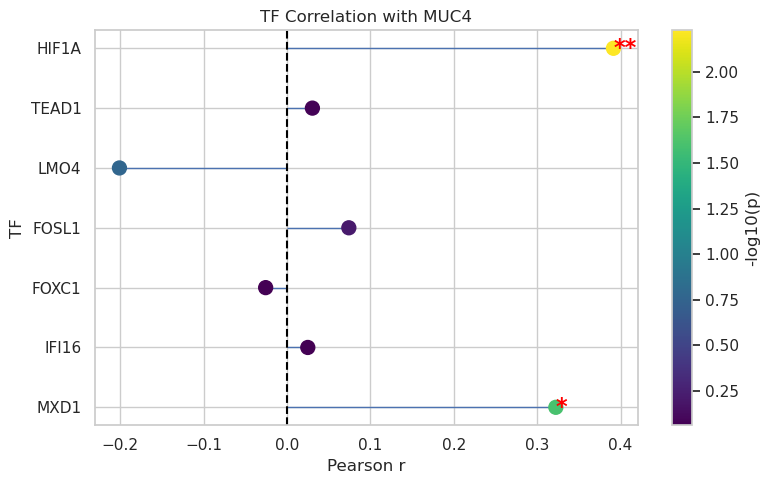

In [201]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

epi_path = "/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/DESeq2/Total_Luminal_bulk_rna_ntd_preprocess.csv"

exclude_samples = {}

epi = pd.read_csv(epi_path, index_col=0)
epi = epi[[s for s in epi.columns if s not in exclude_samples]]

target = "MUC4"
genes = ["MXD1", "IFI16", "FOXC1", "FOSL1", "LMO4", "TEAD1", "HIF1A"]

results = []

for g in genes:
    if g not in epi.index or target not in epi.index:
        continue
    x = epi.loc[g]
    y = epi.loc[target]
    df = pd.DataFrame({"x": x, "y": y}).fillna(0)
    r, p = pearsonr(df["x"], df["y"])
    results.append([g, r, p, -np.log10(p)])

res = pd.DataFrame(results, columns=["gene", "pearson_r", "p", "logp"])

def star(p):
    if p < 0.001:
        return "***"
    if p < 0.01:
        return "**"
    if p < 0.05:
        return "*"
    return ""

plt.figure(figsize=(8,5))

y_pos = np.arange(len(res))

for i in range(len(res)):
    plt.hlines(
        y=y_pos[i],
        xmin=0,
        xmax=res["pearson_r"][i],
        linewidth=1
    )

sc = plt.scatter(
    res["pearson_r"],
    y_pos,
    s=100,
    c=res["logp"],
    cmap="viridis",
    zorder=3
)

for i in range(len(res)):
    plt.text(
        res["pearson_r"][i],
        y_pos[i],
        star(res["p"][i]),
        va="center",
        ha="left",
        fontsize=16,
        color="red",
        fontweight="bold"
    )

plt.yticks(y_pos, res["gene"])
plt.axvline(0, linestyle='--', color='black')
plt.xlabel("Pearson r")
plt.ylabel("TF")
plt.title("TF Correlation with MUC4")
plt.colorbar(sc, label="-log10(p)")
plt.tight_layout()
plt.show()

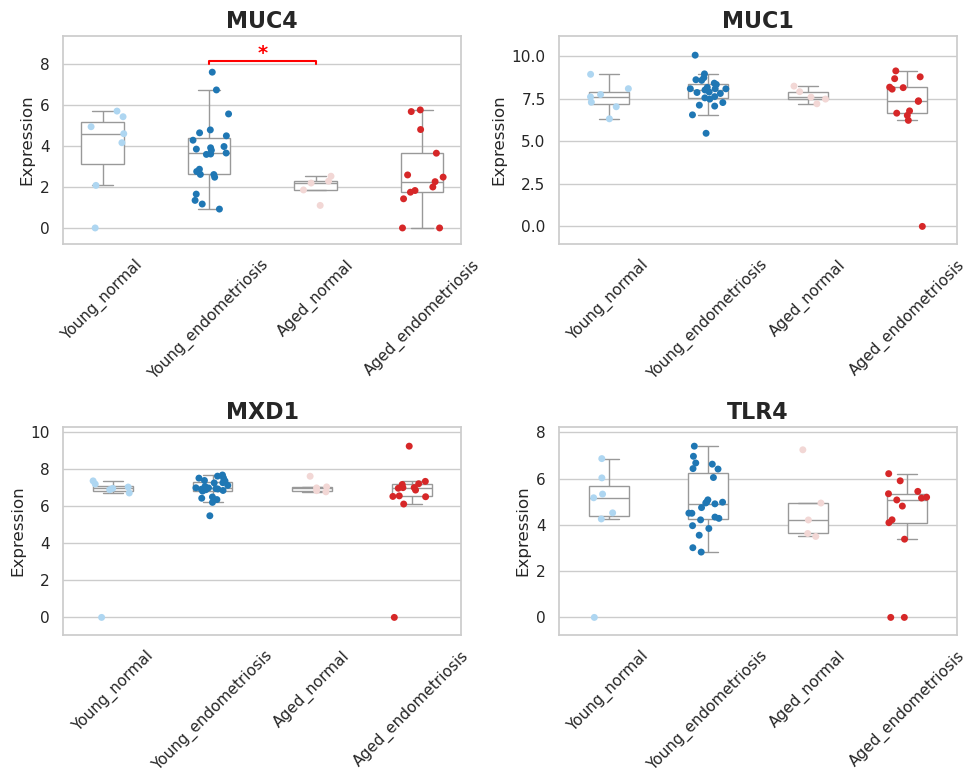

In [207]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ranksums
from itertools import combinations

df = pd.read_csv(
    "/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/DESeq2/Total_Luminal_bulk_rna_ntd_preprocess.csv",
    index_col=0)

dfs = pd.read_csv(
    "/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/DESeq2/sample_id_age_group.csv",
    index_col=0)

if 'Status' not in dfs.columns:
    dfs['Status'] = dfs['Age group'].astype(str) + "_" + dfs['Disease'].astype(str)

genes = ["MUC4", "MUC1", "MXD1", "TLR4"]

status_palette = {
    "Young_normal": "#AED6F1",
    "Young_endometriosis": "#1F77B4",
    "Aged_normal": "#F2D7D5",
    "Aged_endometriosis": "#D62728"
}

group_order = ["Young_normal", "Young_endometriosis", "Aged_normal", "Aged_endometriosis"]

plot_list = []
common_samples = df.columns.intersection(dfs.index)

df_sub = df[common_samples]
dfs_sub = dfs.loc[common_samples]

for gene in genes:
    if gene not in df_sub.index:
        continue
    for sample in common_samples:
        plot_list.append({
            "Gene": gene,
            "sample_id": sample,
            "Status": dfs_sub.loc[sample, "Status"],
            "Expression": df_sub.loc[gene, sample]
        })

plot_df = pd.DataFrame(plot_list)

fig, axes = plt.subplots(2, 2, figsize=(10, 8))
axes = axes.flatten()

for i, gene in enumerate(genes):
    ax = axes[i]
    sub_df = plot_df[plot_df["Gene"] == gene].copy()
    
    actual_groups = [g for g in group_order if g in sub_df["Status"].unique()]
    sub_df["Status"] = pd.Categorical(sub_df["Status"], categories=actual_groups, ordered=True)
    sub_df = sub_df.sort_values("Status").reset_index(drop=True)

    sns.boxplot(
        data=sub_df, x="Status", y="Expression",
        order=actual_groups, width=0.4, color="white", ax=ax, fliersize=0
    )

    sns.stripplot(
    data=sub_df, x="Status", y="Expression", hue="Status",
    palette=status_palette, order=actual_groups,
    size=5, jitter=0.2, ax=ax, dodge=False
)
    y_min, y_max_base = sub_df["Expression"].min(), sub_df["Expression"].max()
    y_range = y_max_base - y_min
    line_offset = y_range * 0.12
    current_y_top = y_max_base + (y_range * 0.05)

    combos = list(combinations(actual_groups, 2))

    for g1, g2 in combos:
        data1 = sub_df[sub_df["Status"] == g1]["Expression"]
        data2 = sub_df[sub_df["Status"] == g2]["Expression"]
        
        if len(data1) < 2 or len(data2) < 2: continue
        
        stat, p = ranksums(data1, data2)
        
        if p < 0.05:
            sig = "***" if p < 0.001 else "**" if p < 0.01 else "*"
            x1, x2 = actual_groups.index(g1), actual_groups.index(g2)
            
            ax.plot([x1, x1, x2, x2], [current_y_top, current_y_top + (y_range*0.02), current_y_top + (y_range*0.02), current_y_top], 
                    lw=1.5, c='red')
            ax.text((x1 + x2) * 0.5, current_y_top + (y_range*0.01), sig, 
                    ha='center', va='bottom', color='red', fontsize=14, fontweight='bold')
            
            current_y_top += line_offset

    ax.set_title(gene, fontsize=16, fontweight='bold')
    ax.set_xlabel("")
    ax.set_ylabel("Expression", fontsize=12)
    ax.set_xticklabels(actual_groups, rotation=45)
    
    ax.set_ylim(y_min - (y_range*0.1), current_y_top + (line_offset*0.5))

    if ax.get_legend():
        ax.get_legend().remove()

plt.tight_layout()
plt.show()

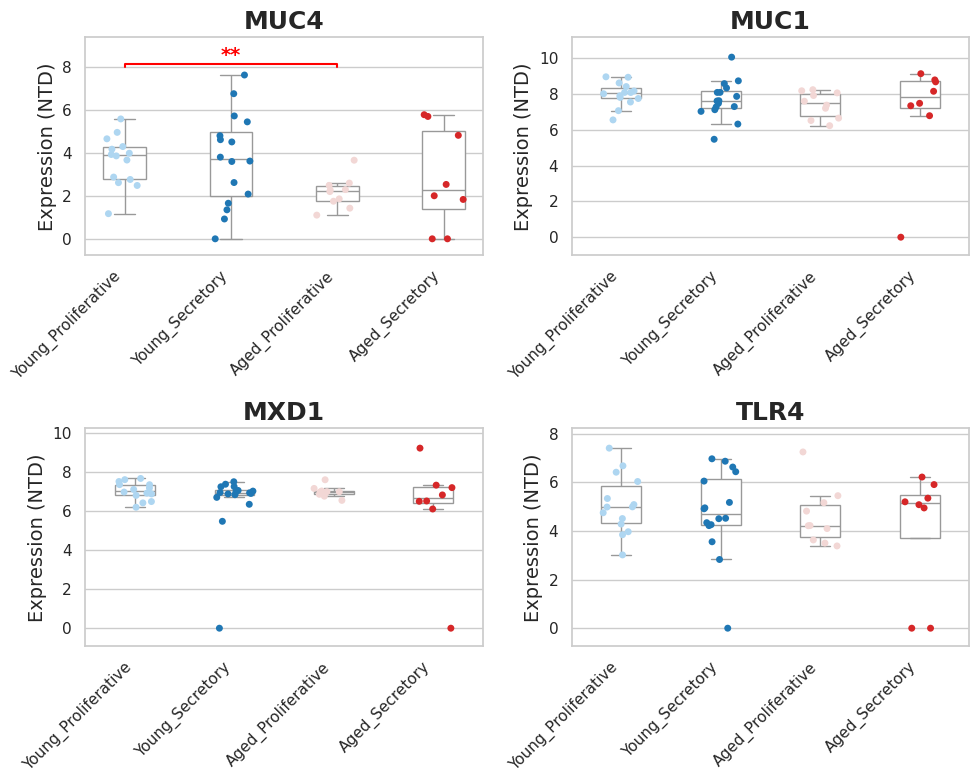

In [213]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ranksums
from itertools import combinations
import numpy as np

df = pd.read_csv(
    "/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/DESeq2/Total_Luminal_bulk_rna_ntd_preprocess.csv",
    index_col=0)

dfs = pd.read_csv(
    "/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/DESeq2/sample_id_age_group.csv",
    index_col=0)

dfs['Status'] = dfs['Age group'].astype(str) + "_" + dfs['Cycle'].astype(str)

genes = ["MUC4", "MUC1", "MXD1", "TLR4"]

group_order = [
    "Young_Proliferative", "Young_Secretory", 
    "Aged_Proliferative", "Aged_Secretory"
]

status_palette = {
    "Young_Proliferative": "#AED6F1",
    "Young_Secretory": "#1F77B4",
    "Aged_Proliferative": "#F2D7D5",
    "Aged_Secretory": "#D62728"
}

plot_list = []
common_samples = df.columns.intersection(dfs.index)
df_sub = df[common_samples]
dfs_sub = dfs.loc[common_samples]

for gene in genes:
    if gene not in df_sub.index:
        continue
    for sample in common_samples:
        plot_list.append({
            "Gene": gene,
            "sample_id": sample,
            "Status": dfs_sub.loc[sample, "Status"],
            "Expression": df_sub.loc[gene, sample]
        })

plot_df = pd.DataFrame(plot_list)

fig, axes = plt.subplots(2, 2, figsize=(10, 8))
axes = axes.flatten()

for i, gene in enumerate(genes):
    ax = axes[i]
    sub_df = plot_df[plot_df["Gene"] == gene].copy()
    
    actual_groups = [g for g in group_order if g in sub_df["Status"].unique()]
    sub_df["Status"] = pd.Categorical(sub_df["Status"], categories=actual_groups, ordered=True)
    sub_df = sub_df.sort_values("Status").reset_index(drop=True)

    sns.boxplot(
        data=sub_df, x="Status", y="Expression",
        order=actual_groups, width=0.4, color="white", ax=ax, fliersize=0
    )

    sns.stripplot(
    data=sub_df, x="Status", y="Expression", hue="Status",
    palette=status_palette, order=actual_groups,
    size=5, jitter=0.2, ax=ax, dodge=False
)

    y_min, y_max_base = sub_df["Expression"].min(), sub_df["Expression"].max()
    y_range = y_max_base - y_min
    line_offset = y_range * 0.12
    current_y_top = y_max_base + (y_range * 0.05)

    combos = list(combinations(actual_groups, 2))

    for g1, g2 in combos:
        data1 = sub_df[sub_df["Status"] == g1]["Expression"]
        data2 = sub_df[sub_df["Status"] == g2]["Expression"]
        
        if len(data1) < 2 or len(data2) < 2: continue
        
        stat, p = ranksums(data1, data2)
        
        if p < 0.05:
            sig = "***" if p < 0.001 else "**" if p < 0.01 else "*"
            x1, x2 = actual_groups.index(g1), actual_groups.index(g2)
            
            ax.plot([x1, x1, x2, x2], 
                    [current_y_top, current_y_top + (y_range*0.02), current_y_top + (y_range*0.02), current_y_top], 
                    lw=1.5, c='red')
            
            ax.text((x1 + x2) * 0.5, current_y_top + (y_range*0.01), sig, 
                    ha='center', va='bottom', color='red', fontsize=14, fontweight='bold')
            
            current_y_top += line_offset

    ax.set_title(gene, fontsize=18, fontweight='bold')
    ax.set_xlabel("")
    ax.set_ylabel("Expression (NTD)", fontsize=14)
    ax.set_xticklabels(actual_groups, rotation=45, ha='right')
    
    ax.set_ylim(y_min - (y_range * 0.1), current_y_top + (line_offset * 0.5))

    if ax.get_legend():
        ax.get_legend().remove()

plt.tight_layout()
plt.show()

# T cell subtyping

In [4]:
import scanpy as sc
adata = sc.read_h5ad("/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/h5ad/After_Clustering.h5ad")

In [5]:
import scanpy as sc

adata_source = sc.read_h5ad("/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/h5ad/after_QC_Before_HVG_raw.h5ad")

common_barcodes = adata.obs_names.intersection(adata_source.obs_names)

adata = adata[common_barcodes].copy()
adata_source = adata_source[common_barcodes].copy()

adata._X = adata_source.X.copy()
adata._var = adata_source.var.copy()
adata._n_vars = adata_source.n_vars

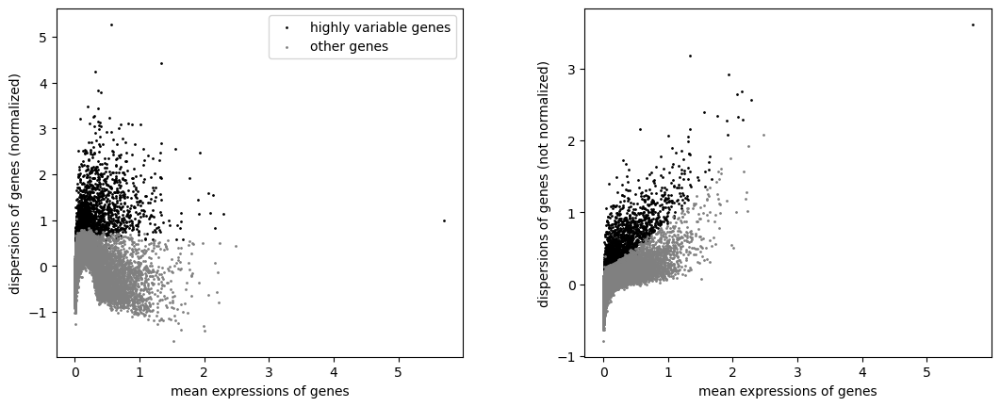

In [6]:
Lymphoid = adata[adata.obs['celltype_grouped'] == 'Immune - Lymphoid'].copy()
Lymphoid.layers["counts"] = Lymphoid.X.copy()
sc.pp.normalize_total(Lymphoid)
sc.pp.log1p(Lymphoid)

#Epithelial.raw = Epithelial.copy()
#Epithelial.X.expm1().sum(axis = 1)
#Epithelial.layers['normalize'] = Epithelial.X.copy()

sc.pp.highly_variable_genes(Lymphoid, n_top_genes=2000, batch_key="Sample name")
sc.pl.highly_variable_genes(Lymphoid)
Lymphoid = Lymphoid[:, Lymphoid.var['highly_variable']].copy()

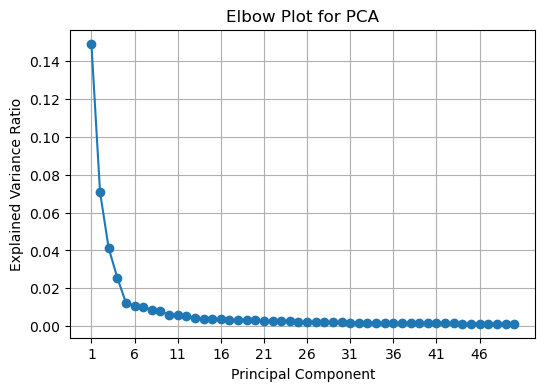

In [7]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

sc.tl.pca(Lymphoid)
explained_variance_ratio = Lymphoid.uns["pca"]["variance_ratio"]

plt.figure(figsize=(6, 4))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker="o", linestyle="-")
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.title("Elbow Plot for PCA")
plt.xticks(np.arange(1, len(explained_variance_ratio) + 1, step=5))
plt.grid()
plt.show()

In [8]:
sc.tl.pca(Lymphoid, n_comps=31, svd_solver='arpack')

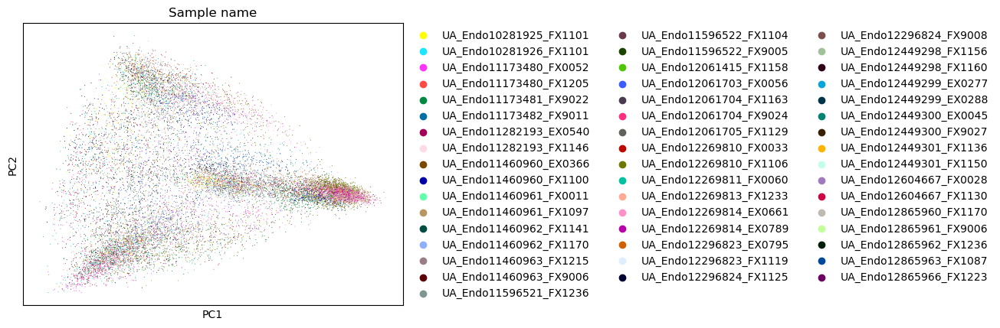

In [9]:
sc.pl.pca(
    Lymphoid,
    color=["Sample name"],
    ncols=2,
    size=2,
)

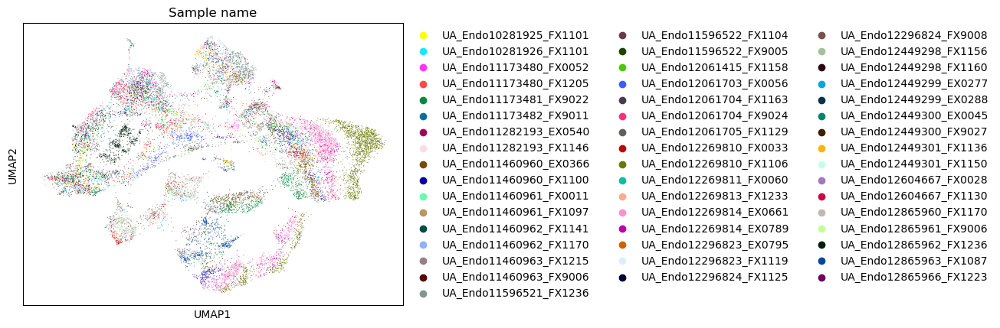

In [10]:
sc.pp.neighbors(Lymphoid)
sc.tl.umap(Lymphoid)
sc.pl.umap(
    Lymphoid,
    color="Sample name",
    # Setting a smaller point size to get prevent overlap
    size=2,
)

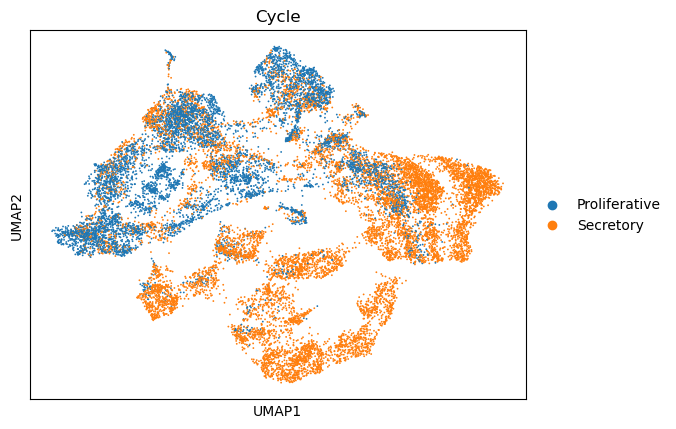

In [11]:
sc.pl.umap(Lymphoid, color=["Cycle"])

Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 93/400:  23%|██▎       | 93/400 [01:50<06:06,  1.19s/it, v_num=1, train_loss_step=1.56e+3, train_loss_epoch=1.33e+3]
Monitored metric elbo_validation did not improve in the last 5 records. Best score: 1343.638. Signaling Trainer to stop.


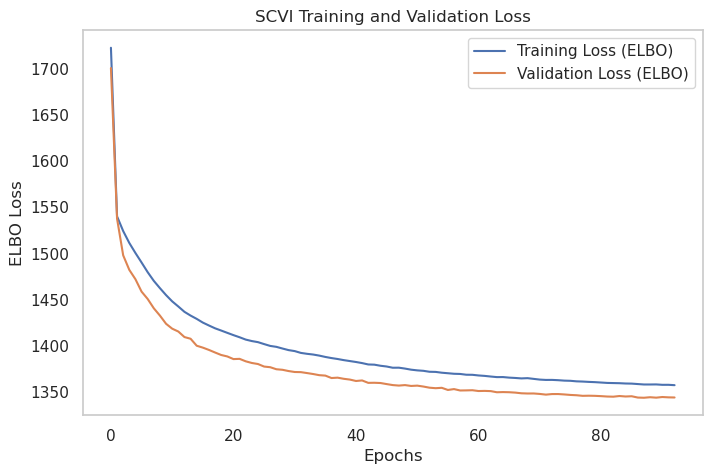

In [26]:
import scvi 
import matplotlib.pyplot as plt

scvi.model.SCVI.setup_anndata(Lymphoid, layer="counts", batch_key="Sample name")
vae = scvi.model.SCVI(Lymphoid, n_layers=2, n_latent=30, gene_likelihood="nb")

vae.train(max_epochs=400, early_stopping=True, early_stopping_patience=5)

train_loss = vae.history["elbo_train"]
val_loss = vae.history["elbo_validation"]
plt.figure(figsize=(8, 5))
plt.plot(train_loss, label="Training Loss (ELBO)")
plt.plot(val_loss, label="Validation Loss (ELBO)")
plt.xlabel("Epochs")
plt.ylabel("ELBO Loss")
plt.title("SCVI Training and Validation Loss")
plt.legend()
plt.grid()
plt.show()

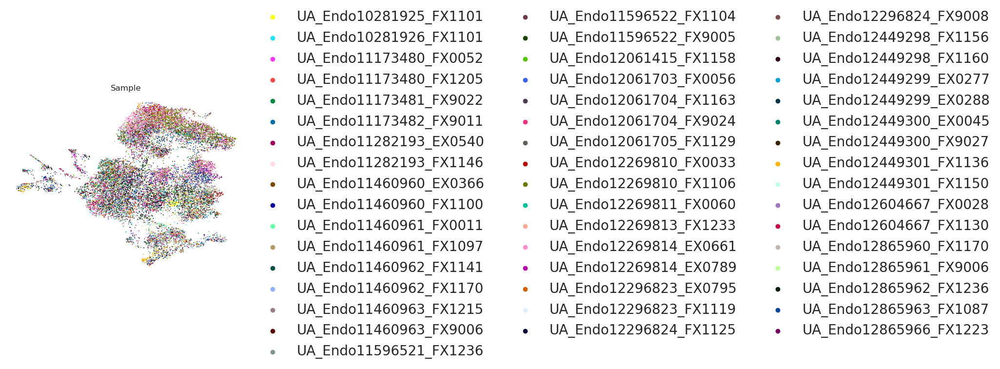

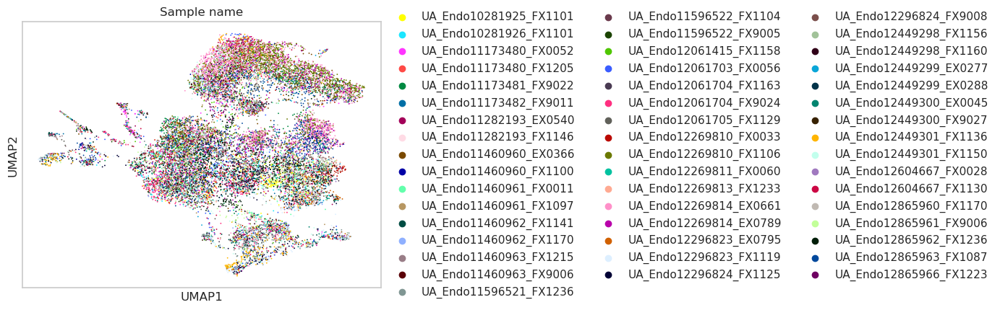

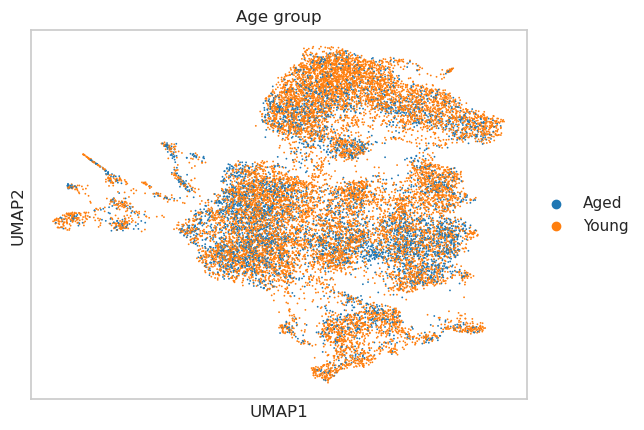

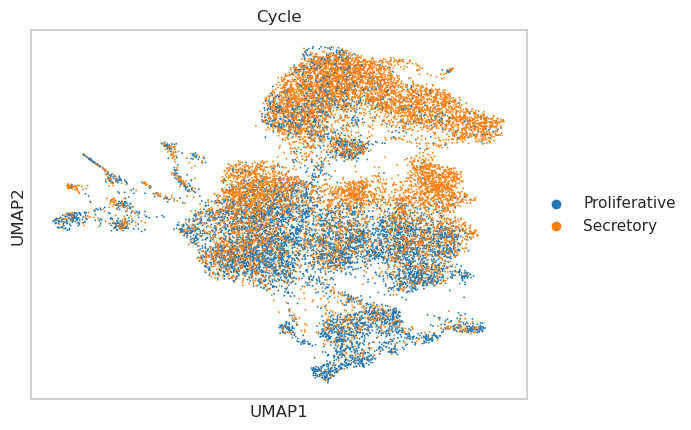

In [27]:
Lymphoid.obsm["X_scVI"] = vae.get_latent_representation()
sc.pp.neighbors(Lymphoid, use_rep = 'X_scVI')
sc.tl.umap(Lymphoid)
sc.pl.umap(
    Lymphoid,
    color=['Sample name'],
    frameon=False,
    size= 8,
    legend_fontsize=20,
    legend_fontoutline=3,
    title="Sample",
    show=False)

sc.pl.umap(Lymphoid, color=["Sample name"])
sc.pl.umap(Lymphoid, color=["Age group"])
sc.pl.umap(Lymphoid, color=["Cycle"])

Cluster 0: ['EYA2', 'STX18', 'RHEX', 'ESR1', 'KIAA1324', 'PLCB1', 'VWA8', 'SORBS2', 'NPAS3', 'TMEM101', 'MECOM', 'TMCC1', 'PGR', 'OXR1', 'POC1B', 'SMAD9', 'PPP1R13B', 'MAGI1', 'STXBP6', 'ASRGL1']
Cluster 1: ['DIAPH3', 'NSD2', 'C21orf58', 'LINC01572', 'CENPK', 'MIR924HG', 'MELK', 'EZH2', 'CCDC14', 'POLQ', 'BRIP1', 'CEP128', 'TMPO', 'CNTLN', 'NUSAP1', 'SMC4', 'AGAP1', 'LINC01515', 'SRSF10', 'MIS18BP1']
Cluster 2: ['LINC01541', 'GABRP', 'GLIS3', 'PAX8', 'SESTD1', 'RHPN2', 'RBM47', 'SYNE2', 'PTPRK', 'SNX29', 'TJP1', 'FGD4', 'MAP3K5', 'MAP7', 'SLC1A1', 'PLEKHA7', 'GRAMD1C', 'B4GALNT3', 'ARID5B', 'NABP1']
Cluster 3: ['NR2F2-AS1', 'COL5A1', 'CDH11', 'PALLD', 'TSHZ3', 'MRC2', 'PRRX1', 'RUNX1T1', 'DLC1', 'COL3A1', 'IGF1', 'PMEPA1', 'TWIST2', 'AC087477.2', 'DENND2A', 'CLMP', 'LSAMP', 'TLE4', 'HOXA10', 'ALDH1A2']
Cluster 4: ['NR2F2-AS1', 'CDH11', 'TSHZ3', 'CLMP', 'TPST1', 'COL5A1', 'WT1', 'MEG3', 'NID1', 'NR2F2', 'ZEB1', 'MEIS1', 'PDZRN3', 'SULF2', 'COL6A2', 'TWIST2', 'SLC24A3', 'APCDD1', 'PHLDB1

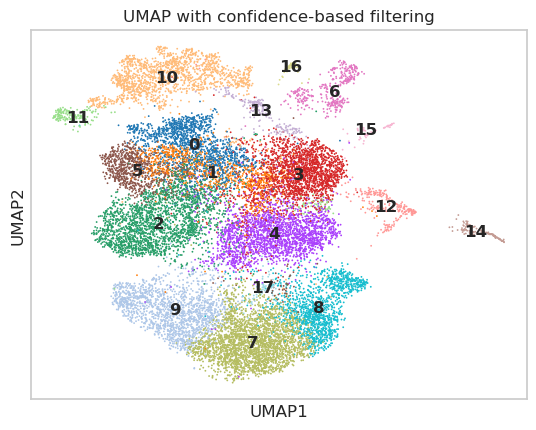

In [45]:
for res in [1,1.5,2,2.5]:
    sc.tl.leiden(
        Lymphoid, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

sc.tl.rank_genes_groups(Lymphoid, groupby='leiden_res_1.00', method='t-test')  # 또는 'wilcoxon'

top_genes = {}

groups = Lymphoid.uns['rank_genes_groups']['names'].dtype.names  # 클러스터 이름들

for group in groups:
    genes = Lymphoid.uns['rank_genes_groups']['names'][group][:20]
    top_genes[group] = genes.tolist()

for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {genes}")
sc.pl.umap(
    Lymphoid,
    color='leiden_res_1.00',
    title='UMAP with confidence-based filtering',
    legend_loc='on data')

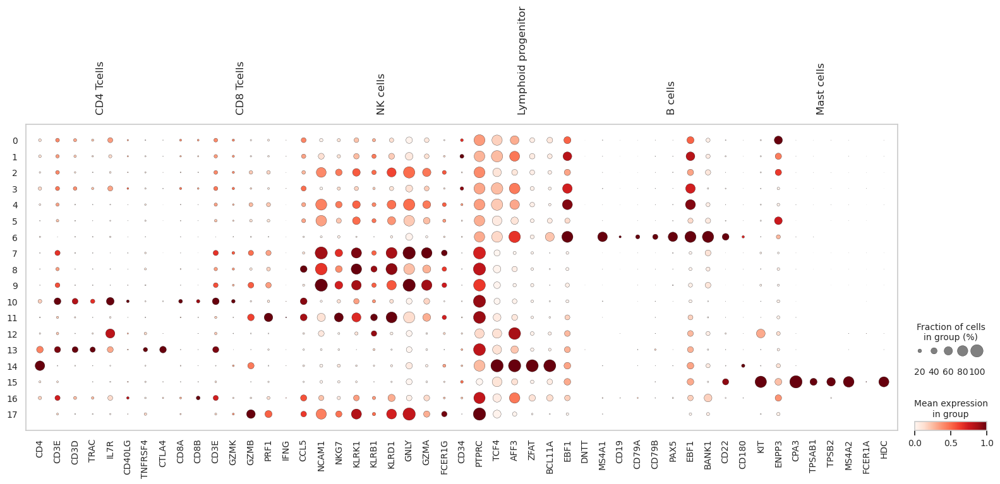

In [112]:
Epithelial_subtype_markers_human={
"CD4 Tcells":["CD4","CD3E","CD3D","TRAC","IL7R","CD40LG","TNFRSF4","CTLA4"],
"CD8 Tcells":["CD8A","CD8B","CD3E","GZMK","GZMB","PRF1","IFNG","CCL5"],
"NK cells":["NCAM1","NKG7","KLRK1","KLRB1","KLRD1","GNLY","GZMA","FCER1G"],
"Lymphoid progenitor":["CD34","PTPRC","TCF4","AFF3","ZFAT","BCL11A","EBF1","DNTT"],
"B cells":["MS4A1","CD19","CD79A","CD79B","PAX5","EBF1","BANK1","CD22","CD180"],
"Mast cells":["KIT","ENPP3","CPA3","TPSAB1","TPSB2","MS4A2","FCER1A","HDC"]
}

existing_subtype_markers = {
    subtype: [gene for gene in genes if gene in Lymphoid.var_names]
    for subtype, genes in Epithelial_subtype_markers_human.items()}

sc.pl.dotplot(
    Lymphoid,
    var_names=existing_subtype_markers,
    groupby="leiden_res_1.00",
    standard_scale="var",
    dendrogram=False)

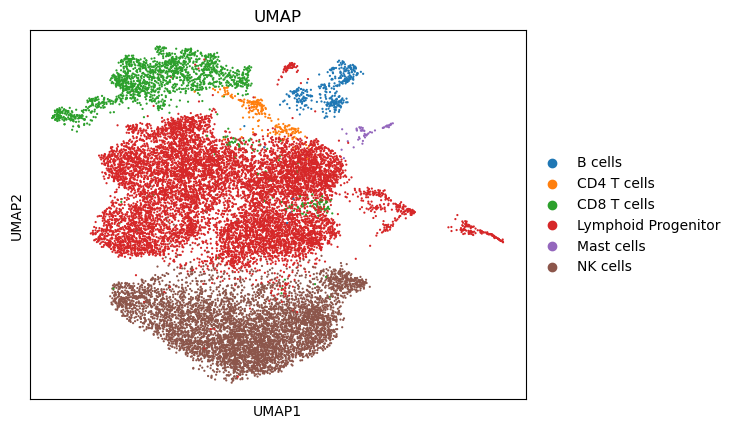

Cluster B cells: ['MS4A1', 'BANK1', 'PAX5', 'FCRL1', 'LINC00926', 'BLK', 'MEF2C', 'RALGPS2', 'GNG7', 'CD74', 'MARCH1', 'ARHGAP24', 'CAMK1D', 'WDFY4', 'LINC02397', 'POU2F2', 'AFF3', 'FCHSD2', 'BCL11A', 'COL19A1', 'PRKCB', 'ST6GAL1', 'NIBAN3', 'STX7', 'ADAM28', 'RIPOR2', 'CD22', 'BLNK', 'CD37', 'ADAM19', 'HLA-DQA1', 'IGHM', 'AC120193.1', 'CDK14', 'CD79B', 'HLA-DRB1', 'LY86', 'CIITA', 'HLA-DRA', 'AC119396.1']
Cluster CD4 T cells: ['IKZF2', 'BCL11B', 'MCF2L2', 'LINC02694', 'PHACTR2', 'STAM', 'AL136456.1', 'PHTF2', 'SPOCK2', 'TNIK', 'DUSP16', 'SH3KBP1', 'AC093865.1', 'LDLRAD4', 'ICOS', 'TIGIT', 'CD4', 'CD28', 'TOX', 'RTKN2', 'SLAMF1', 'ETS1', 'IL2RA', 'CTLA4', 'ITGA4', 'GLCCI1', 'ZC3H12D', 'TNFRSF1B', 'HNRNPLL', 'AC013652.1', 'BATF', 'ZNF831', 'ARHGAP25', 'LINC01934', 'SAMSN1', 'NIBAN1', 'CD2', 'FOXP3', 'IL32', 'PDE4B']
Cluster CD8 T cells: ['BCL11B', 'ARHGAP15', 'LINC00861', 'RIPOR2', 'THEMIS', 'APBB1IP', 'PRKCQ', 'GNG2', 'ARHGAP25', 'PRKCB', 'CAMK4', 'LCK', 'PTPRC', 'CLEC2D', 'ELMO1', 'CD

/home/Data_Drive_8TB/kykim/.conda/envs/kykim/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:458: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (


In [2]:
cluster_to_group = {
    0: "Lymphoid Progenitor",
    1: "Lymphoid Progenitor",
    2: "Lymphoid Progenitor",
    3: "Lymphoid Progenitor",
    4: "Lymphoid Progenitor",
    5: "Lymphoid Progenitor",
    6: "B cells",
    7: "NK cells",
    8: "NK cells",
    9: "NK cells",
    10: "CD8 T cells",
    11: "CD8 T cells",
    12: "Lymphoid Progenitor",
    13: "CD4 T cells",
    14: "Lymphoid Progenitor",
    15: "Mast cells",
    16: "Lymphoid Progenitor",
    17: "NK cells"
}

Lymphoid.obs["subtype"] = Lymphoid.obs["leiden_res_1.00"].astype(int).map(cluster_to_group)
sc.pl.umap(
    Lymphoid,
    color='subtype',
    title='UMAP',
    s = 10)

sc.tl.rank_genes_groups(Lymphoid, groupby='subtype', method='t-test')  # 또는 'wilcoxon'
top_genes = {}
groups = Lymphoid.uns['rank_genes_groups']['names'].dtype.names  # 클러스터 이름들
for group in groups:
    genes = Lymphoid.uns['rank_genes_groups']['names'][group][:40]
    top_genes[group] = genes.tolist()


for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {genes}")

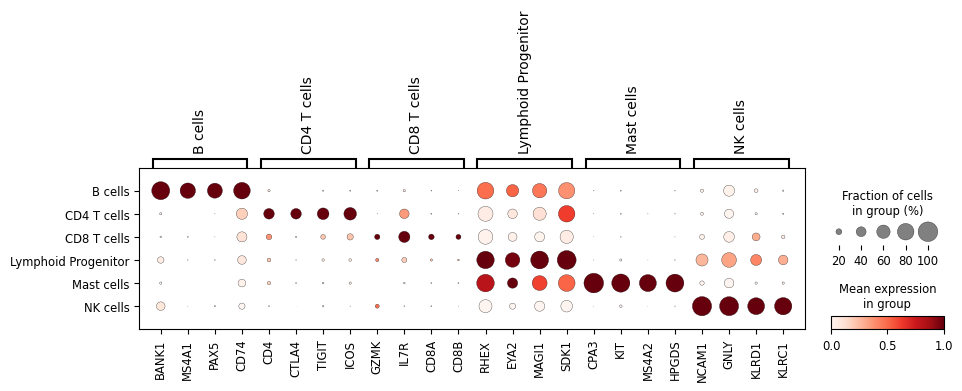

In [3]:
Epithelial_subtype_markers_human={
"B cells":["BANK1","MS4A1","PAX5","CD74"],
"CD4 T cells":["CD4","CTLA4","TIGIT","ICOS"],
"CD8 T cells":["GZMK","IL7R","CD8A","CD8B"],
"Lymphoid Progenitor":["RHEX","EYA2","MAGI1","SDK1"],
"Mast cells":["CPA3","KIT","MS4A2","HPGDS"],
"NK cells":["NCAM1","GNLY","KLRD1","KLRC1"],
}

existing_subtype_markers = {
    subtype: [gene for gene in genes if gene in Lymphoid.var_names]
    for subtype, genes in Epithelial_subtype_markers_human.items()}

sc.pl.dotplot(
    Lymphoid,
    var_names=existing_subtype_markers,
    groupby="subtype",
    standard_scale="var",
    dendrogram=False)

In [333]:
Lymphoid.write("/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/h5ad/Lymphoid.h5ad")

In [1]:
import scanpy as sc
Lymphoid = sc.read_h5ad("/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/h5ad/Lymphoid.h5ad")

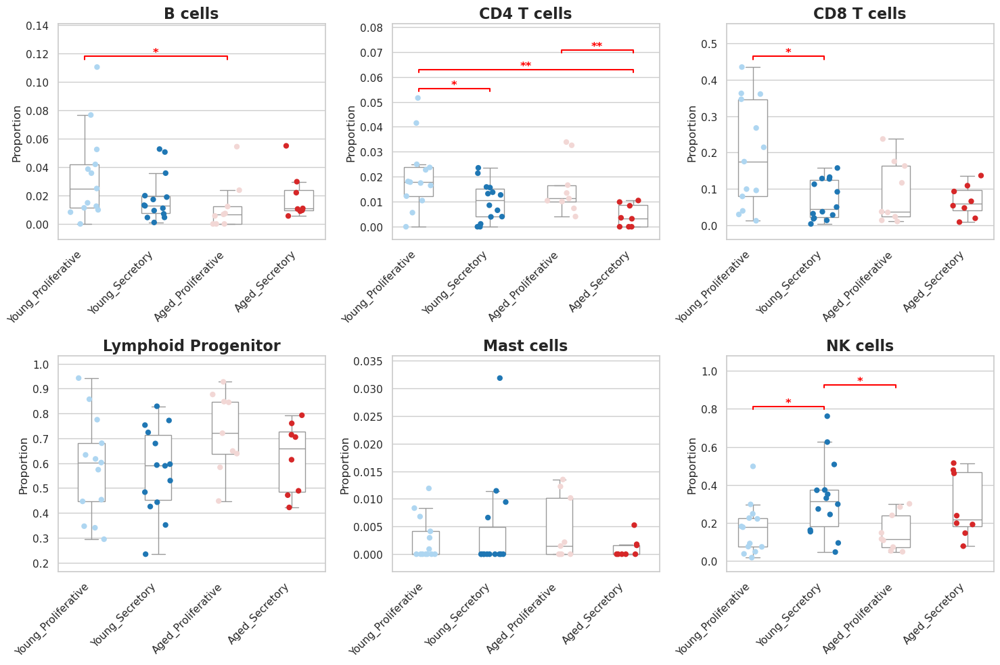

In [240]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ranksums
from itertools import combinations
import warnings

warnings.filterwarnings("ignore")
sns.set(style="whitegrid")

status_palette = {
    "Young_Proliferative": "#AED6F1",
    "Young_Secretory": "#1F77B4",
    "Aged_Proliferative": "#F2D7D5",
    "Aged_Secretory": "#D62728"
}

group_order = [
    "Young_Proliferative", "Young_Secretory", 
    "Aged_Proliferative", "Aged_Secretory"
]

adata_filtered = Lymphoid[Lymphoid.obs['Organism part'] != 'spleen'].copy()
adata_filtered = adata_filtered[
    adata_filtered.obs['Cycle'].isin(['Secretory', 'Proliferative'])
].copy()

adata_filtered.obs['Status'] = (
    adata_filtered.obs['Age group'].astype(str) + "_" + 
    adata_filtered.obs['Cycle'].astype(str)
)

subtypes = sorted(adata_filtered.obs['subtype'].dropna().unique())

def normalize_mouse(df):
    total = df['count'].sum()
    df['proportion'] = df['count'] / total if total > 0 else 0
    return df

mouse_props_list = []
for (mouse, status), grp_df in adata_filtered.obs.groupby(['Individual', 'Status']):
    count_df = grp_df.groupby('subtype').size().reset_index(name='count')
    count_df['Individual'] = mouse
    count_df['Status'] = status
    mouse_props_list.append(normalize_mouse(count_df))

mouse_props = pd.concat(mouse_props_list, ignore_index=True)

n_rows = (len(subtypes) + 3) // 4
n_cols = 3
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 5*n_rows))
axes = axes.flatten()

for i, subtype in enumerate(subtypes):
    ax = axes[i]
    data_sub = mouse_props[mouse_props['subtype'] == subtype].copy()
    
    actual_groups = [g for g in group_order if g in data_sub['Status'].unique()]
    data_sub['Status'] = pd.Categorical(data_sub['Status'], categories=actual_groups, ordered=True)
    data_sub = data_sub.sort_values('Status')

    sns.boxplot(
        x='Status', y='proportion', data=data_sub, ax=ax,
        order=actual_groups,
        color="white",
        fliersize=0,
        width=0.4
    )

    sns.stripplot(
        x='Status', y='proportion', data=data_sub,
        hue='Status',
        palette=status_palette,
        jitter=0.2,
        size=6,
        ax=ax,
        order=actual_groups,
        dodge=False
    )

    y_min, y_max_base = data_sub['proportion'].min(), data_sub['proportion'].max()
    y_range = y_max_base - y_min if (y_max_base - y_min) > 0 else 0.1
    line_offset = y_range * 0.15
    current_y_top = y_max_base + (y_range * 0.05)

    combos = list(combinations(actual_groups, 2))

    for g1, g2 in combos:
        v1 = data_sub[data_sub['Status'] == g1]['proportion']
        v2 = data_sub[data_sub['Status'] == g2]['proportion']

        if len(v1) >= 2 and len(v2) >= 2:
            _, p = ranksums(v1, v2)
            if p < 0.05:
                sig = "***" if p < 0.001 else "**" if p < 0.01 else "*"
                x1, x2 = actual_groups.index(g1), actual_groups.index(g2)
                
                ax.plot([x1, x1, x2, x2], 
                        [current_y_top, current_y_top + (y_range*0.02), current_y_top + (y_range*0.02), current_y_top], 
                        lw=1.5, c='red')
                
                ax.text((x1+x2)/2, current_y_top + (y_range*0.01), sig, 
                        ha='center', va='bottom', color='red', fontsize=12, fontweight='bold')
                
                current_y_top += line_offset

    ax.set_title(subtype, fontsize=16, fontweight='bold')
    ax.set_xlabel("")
    ax.set_ylabel("Proportion", fontsize=12)
    ax.set_xticklabels(actual_groups, rotation=45, ha='right')
    ax.set_ylim(y_min - (y_range*0.1), current_y_top + (line_offset*0.5))
    
    if ax.get_legend():
        ax.get_legend().remove()

for j in range(len(subtypes), n_rows * n_cols):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

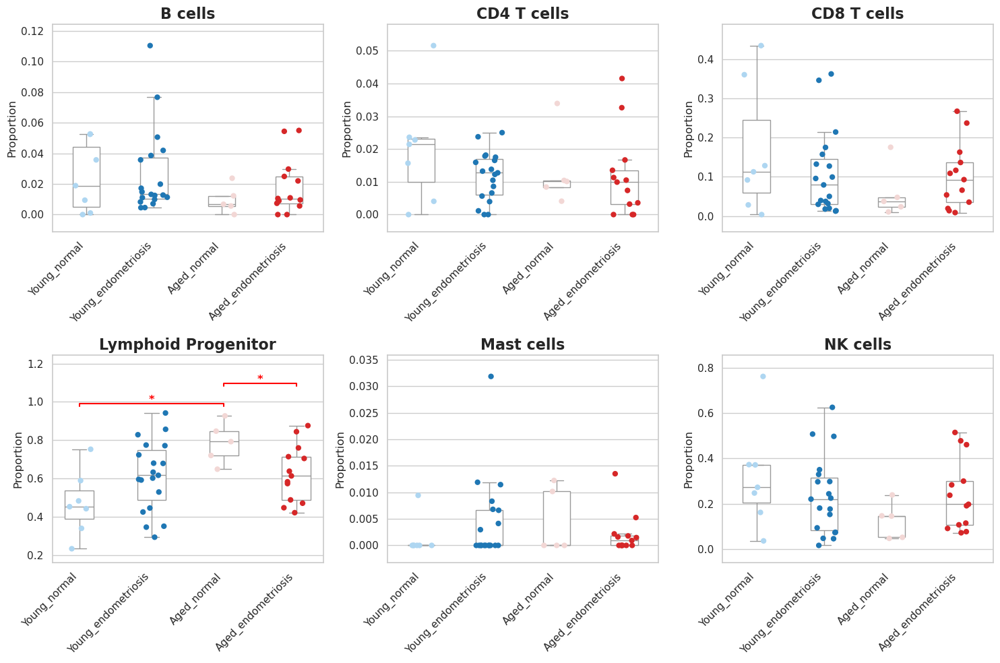

In [241]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ranksums
from itertools import combinations
import warnings

warnings.filterwarnings("ignore")
sns.set(style="whitegrid")

status_palette = {
    "Young_normal": "#AED6F1",
    "Young_endometriosis": "#1F77B4",
    "Aged_normal": "#F2D7D5",
    "Aged_endometriosis": "#D62728"
}

group_order = [
    "Young_normal", "Young_endometriosis", 
    "Aged_normal", "Aged_endometriosis"
]

Lymphoid.obs['age_num'] = pd.to_numeric(Lymphoid.obs['Age'], errors='coerce')
Lymphoid.obs['age_group_custom'] = np.where(Lymphoid.obs['age_num'] >= 35, 'Aged', 'Young')

adata_filtered = Lymphoid[Lymphoid.obs['Organism part'] != 'spleen'].copy()

adata_filtered.obs['Status'] = (
    adata_filtered.obs['age_group_custom'].astype(str) + "_" + 
    adata_filtered.obs['Disease'].astype(str)
)

subtypes = sorted(adata_filtered.obs['subtype'].dropna().unique())

def normalize_mouse(df):
    total = df['count'].sum()
    df['proportion'] = df['count'] / total if total > 0 else 0
    return df

mouse_props_list = []
for (mouse, status), grp_df in adata_filtered.obs.groupby(['Individual', 'Status']):
    count_df = grp_df.groupby('subtype').size().reset_index(name='count')
    count_df['Individual'] = mouse
    count_df['Status'] = status
    mouse_props_list.append(normalize_mouse(count_df))

mouse_props = pd.concat(mouse_props_list, ignore_index=True)

n_rows = (len(subtypes) + 3) // 4
n_cols = 3
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 5*n_rows))
axes = axes.flatten()

for i, subtype in enumerate(subtypes):
    ax = axes[i]
    data_sub = mouse_props[mouse_props['subtype'] == subtype].copy()
    
    actual_groups = [g for g in group_order if g in data_sub['Status'].unique()]
    data_sub['Status'] = pd.Categorical(data_sub['Status'], categories=actual_groups, ordered=True)
    data_sub = data_sub.sort_values('Status')

    sns.boxplot(
        x='Status', y='proportion', data=data_sub, ax=ax,
        order=actual_groups,
        color="white",
        fliersize=0,
        width=0.4
    )

    sns.stripplot(
        x='Status', y='proportion', data=data_sub,
        hue='Status',
        palette=status_palette,
        jitter=0.2,
        size=6,
        ax=ax,
        order=actual_groups,
        dodge=False
    )

    y_min, y_max_base = data_sub['proportion'].min(), data_sub['proportion'].max()
    y_range = y_max_base - y_min if (y_max_base - y_min) > 0 else 0.1
    line_offset = y_range * 0.15
    current_y_top = y_max_base + (y_range * 0.05)

    combos = list(combinations(actual_groups, 2))

    for g1, g2 in combos:
        v1 = data_sub[data_sub['Status'] == g1]['proportion']
        v2 = data_sub[data_sub['Status'] == g2]['proportion']

        if len(v1) >= 2 and len(v2) >= 2:
            _, p = ranksums(v1, v2)
            if p < 0.05:
                sig = "***" if p < 0.001 else "**" if p < 0.01 else "*"
                x1, x2 = actual_groups.index(g1), actual_groups.index(g2)
                
                ax.plot([x1, x1, x2, x2], 
                        [current_y_top, current_y_top + (y_range*0.02), current_y_top + (y_range*0.02), current_y_top], 
                        lw=1.5, c='red')
                
                ax.text((x1+x2)/2, current_y_top + (y_range*0.01), sig, 
                        ha='center', va='bottom', color='red', fontsize=12, fontweight='bold')
                
                current_y_top += line_offset

    ax.set_title(subtype, fontsize=16, fontweight='bold')
    ax.set_xlabel("")
    ax.set_ylabel("Proportion", fontsize=12)
    ax.set_xticklabels(actual_groups, rotation=45, ha='right')
    ax.set_ylim(y_min - (y_range*0.1), current_y_top + (line_offset*0.5))
    
    if ax.get_legend():
        ax.get_legend().remove()

for j in range(len(subtypes), n_rows * n_cols):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [246]:
for subtype in subtypes:
    data_sub = mouse_props[mouse_props['subtype'] == subtype]

    if subtype == "CD8 T cells":
        v1 = data_sub[data_sub['Status'] == 'Young_normal']['proportion']
        v2 = data_sub[data_sub['Status'] == 'Aged_normal']['proportion']

        if len(v1) > 0 and len(v2) > 0:
            _, p = ranksums(v1, v2)
            print("CD8 T cell p-value:", p)

CD8 T cell p-value: 0.29115222318363554


In [42]:
Lymphoid.X.max()

7.4117975

In [247]:
import scanpy as sc

adata_source = sc.read_h5ad("/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/h5ad/after_QC_Before_HVG_raw.h5ad")

common_barcodes = Lymphoid.obs_names.intersection(adata_source.obs_names)

Lymphoid = Lymphoid[common_barcodes].copy()
adata_source = adata_source[common_barcodes].copy()

adata_source = adata_source[Lymphoid.obs_names].copy()

Lymphoid._X = adata_source.X.copy()
Lymphoid._var = adata_source.var.copy()
Lymphoid._n_vars = adata_source.n_vars

In [248]:
#Lymphoid.X = Lymphoid.layers['counts']
adata = Lymphoid[Lymphoid.obs['subtype'] == 'CD8 T cells'].copy()

import pandas as pd
import os

outdir = "/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/DESeq2/"
os.makedirs(outdir, exist_ok=True)
counts = adata.X
genes = adata.var_names
for mc in adata.obs["subtype"].unique():
    ad = adata[adata.obs["subtype"] == mc]
    
    mat = ad.X
    df = pd.DataFrame(
        mat.T.toarray() if hasattr(mat, "toarray") else mat.T,
        index=genes, columns=ad.obs_names)
    
    pb = df.groupby(ad.obs["Sample name"], axis=1).sum()
    pb.to_csv(f"{outdir}/pseudobulk_module_cluster_{mc}.csv")

In [249]:
outdir = "/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/DESeq2/"
os.makedirs(outdir, exist_ok=True)

df = (
    adata.obs[["Sample name", "Cycle","Age group", "Disease","Age","Endometriosis stage","Dataset",
                  "Hormonal treatment"]]
    .drop_duplicates()
    .sort_values("Sample name"))
df.to_csv(f"{outdir}/CD8_sample_id_age_group.csv", index=False)

In [329]:
import pandas as pd

df = pd.read_csv(
    "/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/DESeq2/Total_CD8T_bulk_rna_vsd_preprocess.csv",
    index_col=0)

dfs = pd.read_csv(
    "/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/DESeq2/CD8_sample_id_age_group.csv",
    index_col=0)

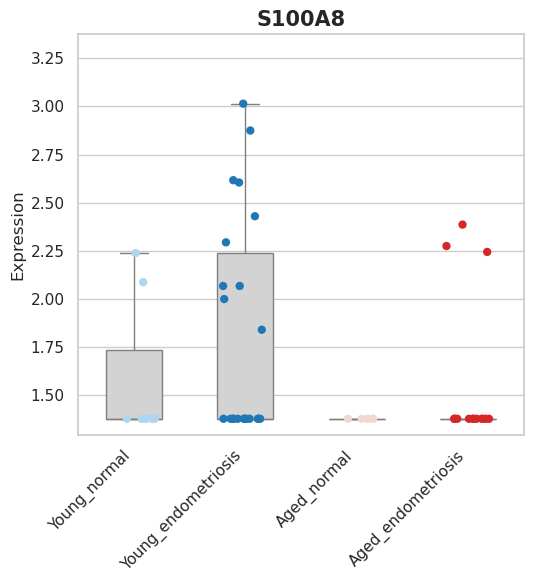

In [312]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ranksums
from itertools import combinations
import numpy as np

dfs['Status'] = dfs['Age group'].astype(str) + "_" + dfs['Disease'].astype(str)

genes = ["S100A8"]

group_order = [
    "Young_normal", "Young_endometriosis", 
    "Aged_normal", "Aged_endometriosis"
]

status_palette = {
    "Young_normal": "#AED6F1",
    "Young_endometriosis": "#1F77B4",
    "Aged_normal": "#F2D7D5",
    "Aged_endometriosis": "#D62728"
}

plot_list = []
common_samples = df.columns.intersection(dfs.index)
df_sub = df[common_samples]
dfs_sub = dfs.loc[common_samples]

for gene in genes:
    if gene not in df_sub.index:
        continue
    for sample in common_samples:
        plot_list.append({
            "Gene": gene,
            "sample_id": sample,
            "Status": dfs_sub.loc[sample, "Status"],
            "Expression": df_sub.loc[gene, sample]
        })

plot_df = pd.DataFrame(plot_list)

fig, axes = plt.subplots(1, len(genes), figsize=(5.5 * len(genes), 6))
if len(genes) == 1: axes = [axes]

for i, gene in enumerate(genes):
    ax = axes[i]
    sub_df = plot_df[plot_df["Gene"] == gene].copy()
    
    actual_groups = [g for g in group_order if g in sub_df["Status"].unique()]
    sub_df["Status"] = pd.Categorical(sub_df["Status"], categories=actual_groups, ordered=True)
    sub_df = sub_df.sort_values("Status").reset_index(drop=True)

    sns.boxplot(
        data=sub_df, x="Status", y="Expression",
        order=actual_groups, width=0.5, color="lightgray", ax=ax, fliersize=0
    )

    sns.stripplot(
        data=sub_df, x="Status", y="Expression", hue="Status",
        palette=status_palette, order=actual_groups, size=6, jitter=0.2, ax=ax, dodge=False
    )

    y_min, y_max_base = sub_df["Expression"].min(), sub_df["Expression"].max()
    y_range = y_max_base - y_min
    line_offset = y_range * 0.12
    current_y_top = y_max_base + (y_range * 0.1)

    combos = list(combinations(actual_groups, 2))
    for g1, g2 in combos:
        data1 = sub_df[sub_df["Status"] == g1]["Expression"]
        data2 = sub_df[sub_df["Status"] == g2]["Expression"]
        
        if len(data1) < 2 or len(data2) < 2: continue
        stat, p = ranksums(data1, data2)
        
        if p < 0.05:
            sig = "***" if p < 0.001 else "**" if p < 0.01 else "*"
            x1, x2 = actual_groups.index(g1), actual_groups.index(g2)
            
            ax.plot([x1, x1, x2, x2], [current_y_top, current_y_top + (y_range*0.02), current_y_top + (y_range*0.02), current_y_top], 
                    lw=1.5, c='red')
            ax.text((x1 + x2) * 0.5, current_y_top + (y_range*0.01), sig, 
                    ha='center', va='bottom', color='red', fontsize=12, fontweight='bold')
            current_y_top += line_offset

    ax.set_title(gene, fontsize=15, fontweight='bold')
    ax.set_xlabel("")
    ax.set_ylabel("Expression")
    ax.set_xticklabels(actual_groups, rotation=45, ha='right')
    ax.set_ylim(y_min - (y_range*0.05), current_y_top + line_offset)

    if ax.get_legend():
        ax.get_legend().remove()

plt.tight_layout()
plt.show()

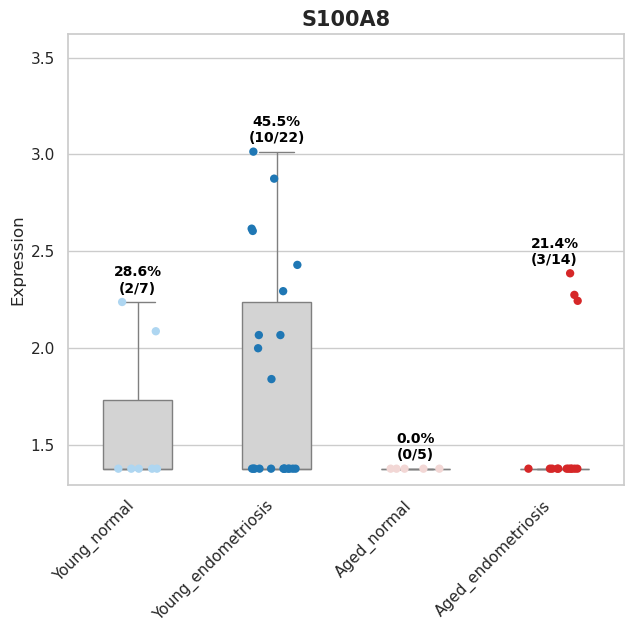

In [332]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ranksums
from itertools import combinations
import numpy as np

dfs['Status'] = dfs['Age group'].astype(str) + "_" + dfs['Disease'].astype(str)

genes = ["S100A8"]

group_order = [
    "Young_normal", "Young_endometriosis", 
    "Aged_normal", "Aged_endometriosis"
]

status_palette = {
    "Young_normal": "#AED6F1",
    "Young_endometriosis": "#1F77B4",
    "Aged_normal": "#F2D7D5",
    "Aged_endometriosis": "#D62728"
}

plot_list = []
common_samples = df.columns.intersection(dfs.index)
df_sub = df[common_samples]
dfs_sub = dfs.loc[common_samples]

for gene in genes:
    if gene not in df_sub.index:
        continue
    for sample in common_samples:
        plot_list.append({
            "Gene": gene,
            "sample_id": sample,
            "Status": dfs_sub.loc[sample, "Status"],
            "Expression": df_sub.loc[gene, sample]
        })

plot_df = pd.DataFrame(plot_list)

fig, axes = plt.subplots(1, len(genes), figsize=(6.5 * len(genes), 6.5))
if len(genes) == 1: axes = [axes]

for i, gene in enumerate(genes):
    ax = axes[i]
    sub_df = plot_df[plot_df["Gene"] == gene].copy()
    
    actual_groups = [g for g in group_order if g in sub_df["Status"].unique()]
    sub_df["Status"] = pd.Categorical(sub_df["Status"], categories=actual_groups, ordered=True)
    sub_df = sub_df.sort_values("Status").reset_index(drop=True)

    sns.boxplot(
        data=sub_df, x="Status", y="Expression",
        order=actual_groups, width=0.5, color="lightgray", ax=ax, fliersize=0
    )

    sns.stripplot(
        data=sub_df, x="Status", y="Expression", hue="Status",
        palette=status_palette, order=actual_groups, size=6, jitter=0.2, ax=ax, dodge=False
    )

    y_min, y_max_base = sub_df["Expression"].min(), sub_df["Expression"].max()
    y_range = y_max_base - y_min
    
    threshold = 1.50
    for idx, status in enumerate(actual_groups):
        grp_data = sub_df[sub_df["Status"] == status]
        n_total = len(grp_data)
        n_high = len(grp_data[grp_data["Expression"] >= threshold])
        perc = (n_high / n_total * 100) if n_total > 0 else 0
        
        y_pos = grp_data["Expression"].max() if n_total > 0 else y_min
        ax.text(idx, y_pos + (y_range * 0.02), f"{perc:.1f}%\n({n_high}/{n_total})", 
                ha='center', va='bottom', fontsize=10, fontweight='bold', color='black')

    line_offset = y_range * 0.12
    current_y_top = y_max_base + (y_range * 0.25)

    combos = list(combinations(actual_groups, 2))
    for g1, g2 in combos:
        data1 = sub_df[sub_df["Status"] == g1]["Expression"]
        data2 = sub_df[sub_df["Status"] == g2]["Expression"]
        
        if len(data1) < 2 or len(data2) < 2: continue
        stat, p = ranksums(data1, data2)
        
        if p < 0.05:
            sig = "***" if p < 0.001 else "**" if p < 0.01 else "*"
            x1, x2 = actual_groups.index(g1), actual_groups.index(g2)
            
            ax.plot([x1, x1, x2, x2], [current_y_top, current_y_top + (y_range*0.02), current_y_top + (y_range*0.02), current_y_top], 
                    lw=1.5, c='red')
            ax.text((x1 + x2) * 0.5, current_y_top + (y_range*0.01), sig, 
                    ha='center', va='bottom', color='red', fontsize=12, fontweight='bold')
            current_y_top += line_offset

    ax.set_title(gene, fontsize=15, fontweight='bold')
    ax.set_xlabel("")
    ax.set_ylabel("Expression")
    ax.set_xticklabels(actual_groups, rotation=45, ha='right')
    ax.set_ylim(y_min - (y_range * 0.05), current_y_top + line_offset)

    if ax.get_legend():
        ax.get_legend().remove()

plt.tight_layout()
plt.show()

In [316]:
for gene in genes:
    sub_df = plot_df[plot_df["Gene"] == gene]
    print(gene, sub_df[sub_df["Expression"] > 1.5]["sample_id"].tolist())

S100A8 ['UA_Endo11460962_FX1170', 'UA_Endo11596521_FX1236', 'UA_Endo12061703_FX0056', 'UA_Endo12061705_FX1129', 'UA_Endo12296823_FX1119', 'UA_Endo12296824_FX1125', 'UA_Endo12449300_EX0045', 'UA_Endo12449301_FX1136', 'UA_Endo12449301_FX1150', 'UA_Endo11460962_FX1141', 'UA_Endo12061415_FX1158', 'UA_Endo12061704_FX9024', 'UA_Endo12269813_FX1233', 'UA_Endo12604667_FX0028', 'UA_Endo12865963_FX1087']


In [294]:
import pandas as pd
from scipy.stats import ranksums
from itertools import combinations

dfs['Status'] = dfs['Age group'].astype(str) + "_" + dfs['Disease'].astype(str)

genes = ["S100A8"]

group_order = [
    "Young_normal", "Young_endometriosis", 
    "Aged_normal", "Aged_endometriosis"
]

common_samples = df.columns.intersection(dfs.index)
df_sub = df[common_samples]
dfs_sub = dfs.loc[common_samples]

for gene in genes:
    if gene not in df_sub.index:
        continue

    tmp = pd.DataFrame({
        "Status": dfs_sub["Status"],
        "Expression": df_sub.loc[gene]
    })

    actual_groups = [g for g in group_order if g in tmp["Status"].unique()]
    combos = list(combinations(actual_groups, 2))

    print(f"\n=== {gene} ===")

    for g1, g2 in combos:
        v1 = tmp[tmp["Status"] == g1]["Expression"]
        v2 = tmp[tmp["Status"] == g2]["Expression"]

        if len(v1) < 2 or len(v2) < 2:
            continue

        _, p = ranksums(v1, v2)

        print(f"{g1} vs {g2} : {p:.4e}")


=== S100A8 ===
Young_normal vs Young_endometriosis : 4.4459e-01
Young_normal vs Aged_normal : 4.1679e-01
Young_normal vs Aged_endometriosis : 9.7024e-01
Young_endometriosis vs Aged_normal : 1.1865e-01
Young_endometriosis vs Aged_endometriosis : 2.0567e-01
Aged_normal vs Aged_endometriosis : 4.8745e-01


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ranksums
from itertools import combinations
import numpy as np

dfs['Status'] = dfs['Age group'].astype(str) + "_" + dfs['Cycle'].astype(str)

genes = ["S100A8"]

group_order = [
    "Young_Proliferative", "Young_Secretory", 
    "Aged_Proliferative", "Aged_Secretory"
]

status_palette = {
    "Young_Proliferative": "#AED6F1",
    "Young_Secretory": "#1F77B4",
    "Aged_Proliferative": "#F2D7D5",
    "Aged_Secretory": "#D62728"
}

plot_list = []
common_samples = df.columns.intersection(dfs.index)
df_sub = df[common_samples]
dfs_sub = dfs.loc[common_samples]

for gene in genes:
    if gene not in df_sub.index:
        continue
    for sample in common_samples:
        plot_list.append({
            "Gene": gene,
            "sample_id": sample,
            "Status": dfs_sub.loc[sample, "Status"],
            "Expression": df_sub.loc[gene, sample]
        })

plot_df = pd.DataFrame(plot_list)

fig, axes = plt.subplots(1, len(genes), figsize=(6.5 * len(genes), 6.5))
if len(genes) == 1: axes = [axes]

for i, gene in enumerate(genes):
    ax = axes[i]
    sub_df = plot_df[plot_df["Gene"] == gene].copy()
    
    actual_groups = [g for g in group_order if g in sub_df["Status"].unique()]
    sub_df["Status"] = pd.Categorical(sub_df["Status"], categories=actual_groups, ordered=True)
    sub_df = sub_df.sort_values("Status").reset_index(drop=True)

    sns.boxplot(
        data=sub_df, x="Status", y="Expression",
        order=actual_groups, width=0.5, color="lightgray", ax=ax, fliersize=0
    )

    sns.stripplot(
        data=sub_df, x="Status", y="Expression", hue="Status",
        palette=status_palette, order=actual_groups, size=6, jitter=0.2, ax=ax, dodge=False
    )

    y_min, y_max_base = sub_df["Expression"].min(), sub_df["Expression"].max()
    y_range = y_max_base - y_min
    
    threshold = 1.50
    for idx, status in enumerate(actual_groups):
        grp_data = sub_df[sub_df["Status"] == status]
        n_total = len(grp_data)
        n_high = len(grp_data[grp_data["Expression"] >= threshold])
        perc = (n_high / n_total * 100) if n_total > 0 else 0
        
        y_pos = grp_data["Expression"].max() if n_total > 0 else y_min
        ax.text(idx, y_pos + (y_range * 0.02), f"{perc:.1f}%\n({n_high}/{n_total})", 
                ha='center', va='bottom', fontsize=10, fontweight='bold', color='black')

    line_offset = y_range * 0.12
    current_y_top = y_max_base + (y_range * 0.25)

    combos = list(combinations(actual_groups, 2))
    for g1, g2 in combos:
        data1 = sub_df[sub_df["Status"] == g1]["Expression"]
        data2 = sub_df[sub_df["Status"] == g2]["Expression"]
        
        if len(data1) < 2 or len(data2) < 2: continue
        stat, p = ranksums(data1, data2)
        
        if p < 0.05:
            sig = "***" if p < 0.001 else "**" if p < 0.01 else "*"
            x1, x2 = actual_groups.index(g1), actual_groups.index(g2)
            
            ax.plot([x1, x1, x2, x2], [current_y_top, current_y_top + (y_range*0.02), current_y_top + (y_range*0.02), current_y_top], 
                    lw=1.5, c='red')
            ax.text((x1 + x2) * 0.5, current_y_top + (y_range*0.01), sig, 
                    ha='center', va='bottom', color='red', fontsize=12, fontweight='bold')
            current_y_top += line_offset

    ax.set_title(gene, fontsize=15, fontweight='bold')
    ax.set_xlabel("")
    ax.set_ylabel("Expression")
    ax.set_xticklabels(actual_groups, rotation=45, ha='right')
    ax.set_ylim(y_min - (y_range * 0.05), current_y_top + line_offset)

    if ax.get_legend():
        ax.get_legend().remove()

plt.tight_layout()
plt.show()

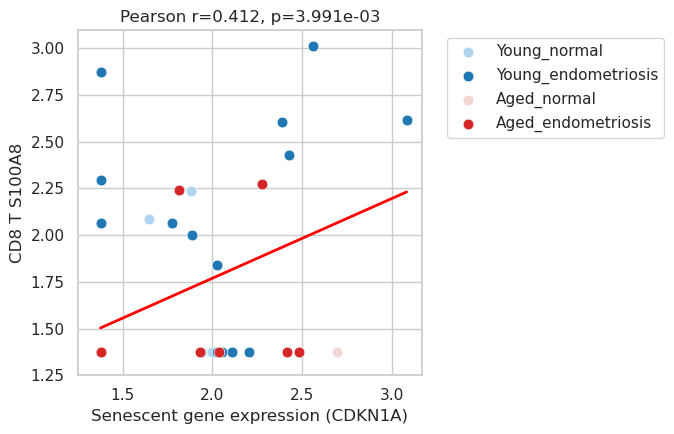

In [323]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
import numpy as np

cd8_path = "/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/DESeq2/Total_CD8T_bulk_rna_vsd_preprocess.csv"
epi_path = "/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/DESeq2/Total_Luminal_bulk_rna_vsd_preprocess.csv"
meta_path = "/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/DESeq2/sample_id_age_group.csv"

cd8 = pd.read_csv(cd8_path, index_col=0)
epi = pd.read_csv(epi_path, index_col=0)
meta = pd.read_csv(meta_path, index_col=0)

meta['Status'] = meta['Age group'].astype(str) + "_" + meta['Disease'].astype(str)

common_samples = cd8.columns.intersection(epi.columns).intersection(meta.index)
final_samples = [s for s in common_samples]

cd8_sub = cd8[final_samples]
meta_sub = meta.loc[final_samples]

x_val = cd8_sub.loc["CDKN1A"]
y_val = cd8_sub.loc["S100A8"]

plot_df = pd.DataFrame({
    "x": x_val,
    "y": y_val,
    "Status": meta_sub["Status"]
}).dropna()

status_palette = {
    "Young_normal": "#AED6F1",
    "Young_endometriosis": "#1F77B4",
    "Aged_normal": "#F2D7D5",
    "Aged_endometriosis": "#D62728"
}

group_order = [
    "Young_normal", "Young_endometriosis", 
    "Aged_normal", "Aged_endometriosis"
]

pearson_r, pearson_p = pearsonr(plot_df["x"], plot_df["y"])

plt.figure(figsize=(7, 4.5))

for status in group_order:
    if status in plot_df["Status"].unique():
        sub = plot_df[plot_df["Status"] == status]
        plt.scatter(sub["x"], sub["y"], label=status, color=status_palette.get(status, 'gray'), s=60, edgecolor='white', linewidth=0.5)

m, b = np.polyfit(plot_df["x"], plot_df["y"], 1)
x_line = np.linspace(plot_df["x"].min(), plot_df["x"].max(), 100)
plt.plot(x_line, m * x_line + b, color='red', linewidth=2)

plt.xlim(left=1.25)
plt.ylim(bottom=1.25)

plt.xlabel("Senescent gene expression (CDKN1A)")
plt.ylabel("CD8 T S100A8")
plt.title(f"Pearson r={pearson_r:.3f}, p={pearson_p:.3e}")

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

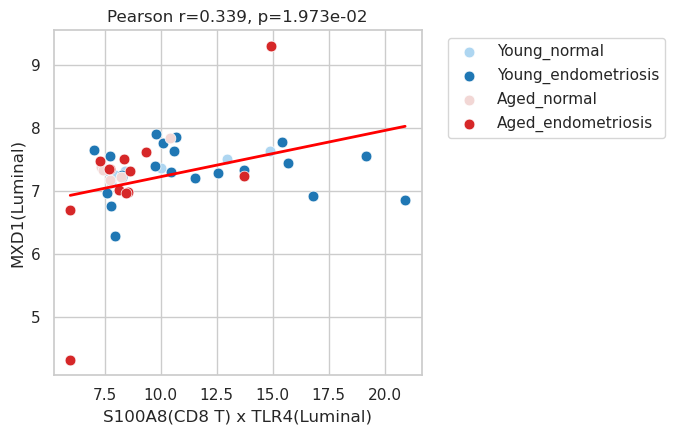

In [327]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
import numpy as np

cd8_path = "/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/DESeq2/Total_CD8T_bulk_rna_vsd_preprocess.csv"
epi_path = "/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/DESeq2/Total_Luminal_bulk_rna_vsd_preprocess.csv"
meta_path = "/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/DESeq2/sample_id_age_group.csv"

cd8 = pd.read_csv(cd8_path, index_col=0)
epi = pd.read_csv(epi_path, index_col=0)
meta = pd.read_csv(meta_path, index_col=0)

meta['Status'] = meta['Age group'].astype(str) + "_" + meta['Disease'].astype(str)

common_samples = cd8.columns.intersection(epi.columns).intersection(meta.index)
final_samples = [s for s in common_samples]

cd8_sub = cd8[final_samples]
epi_sub = epi[final_samples]
meta_sub = meta.loc[final_samples]

x_val = cd8_sub.loc["S100A8"] * epi_sub.loc['TLR4']
y_val = epi_sub.loc["MXD1"]

plot_df = pd.DataFrame({
    "x": x_val,
    "y": y_val,
    "Status": meta_sub["Status"]
}).dropna()

status_palette = {
    "Young_normal": "#AED6F1",
    "Young_endometriosis": "#1F77B4",
    "Aged_normal": "#F2D7D5",
    "Aged_endometriosis": "#D62728"
}

group_order = [
    "Young_normal", "Young_endometriosis", 
    "Aged_normal", "Aged_endometriosis"
]

pearson_r, pearson_p = pearsonr(plot_df["x"], plot_df["y"])

plt.figure(figsize=(7, 4.5))

for status in group_order:
    if status in plot_df["Status"].unique():
        sub = plot_df[plot_df["Status"] == status]
        plt.scatter(
            sub["x"], sub["y"], 
            label=status, 
            color=status_palette.get(status, 'gray'), 
            s=60, 
            edgecolor='white', 
            linewidth=0.5
        )

m, b = np.polyfit(plot_df["x"], plot_df["y"], 1)
x_line = np.linspace(plot_df["x"].min(), plot_df["x"].max(), 100)
plt.plot(x_line, m * x_line + b, color='red', linewidth=2)

plt.xlabel("S100A8(CD8 T) x TLR4(Luminal)")
plt.ylabel("MXD1(Luminal)")
plt.title(f"Pearson r={pearson_r:.3f}, p={pearson_p:.3e}")

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

# Mean expression

# 

# 보류

In [26]:
import scvi 

scvi.model.SCVI.setup_anndata(Epithelial, layer="counts", batch_key="Sample name")
vae = scvi.model.SCVI(Epithelial, n_layers=2, n_latent=30, gene_likelihood="nb")

vae.train(max_epochs=400, early_stopping=True, early_stopping_patience=10)

/home/Data_Drive_8TB/kykim/.conda/envs/kykim/lib/python3.9/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/home/Data_Drive_8TB/kykim/.conda/envs/kykim/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to 

Epoch 298/400:  74%|███████▍  | 298/400 [1:14:35<25:31, 15.02s/it, v_num=1, train_loss_step=6.28e+3, train_loss_epoch=6.28e+3]
Monitored metric elbo_validation did not improve in the last 10 records. Best score: 6294.556. Signaling Trainer to stop.


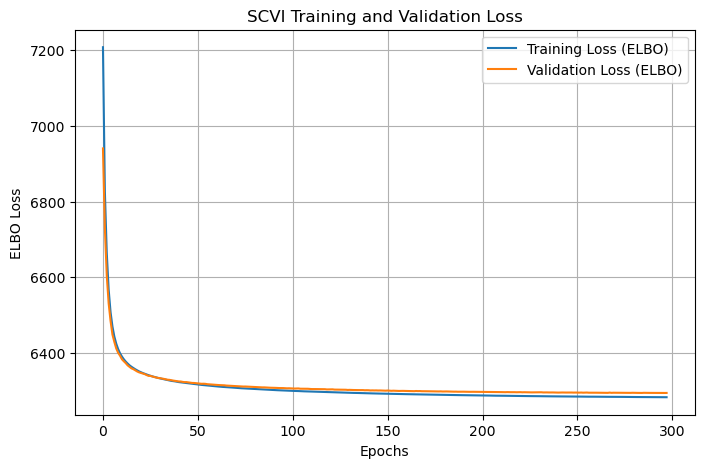

In [27]:
import matplotlib.pyplot as plt

train_loss = vae.history["elbo_train"]
val_loss = vae.history["elbo_validation"]
plt.figure(figsize=(8, 5))
plt.plot(train_loss, label="Training Loss (ELBO)")
plt.plot(val_loss, label="Validation Loss (ELBO)")
plt.xlabel("Epochs")
plt.ylabel("ELBO Loss")
plt.title("SCVI Training and Validation Loss")
plt.legend()
plt.grid()
plt.show()

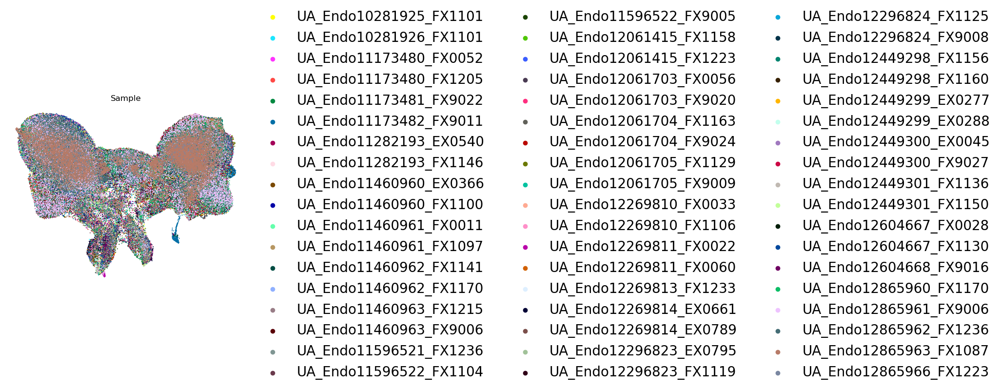

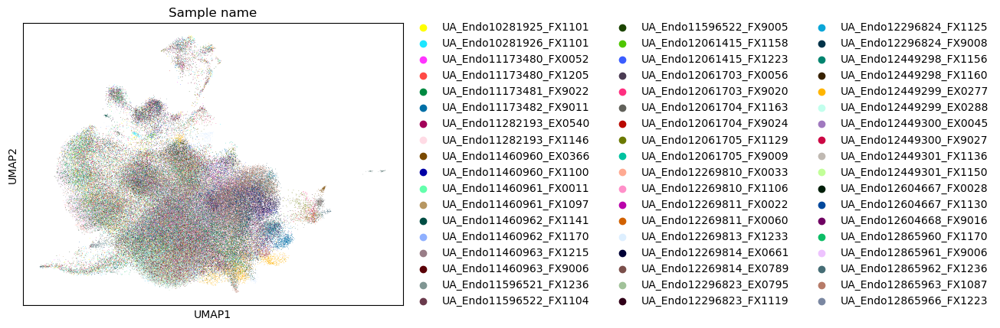

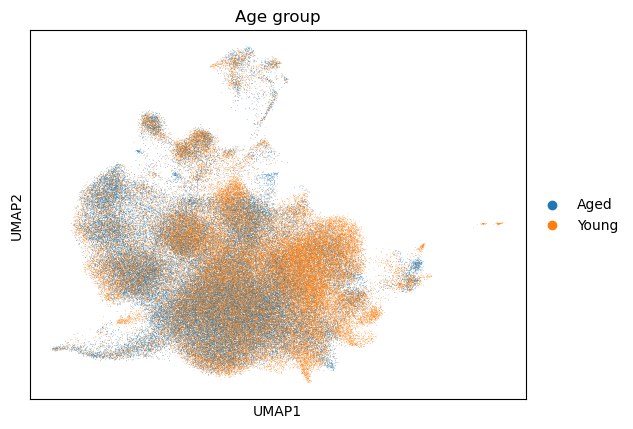

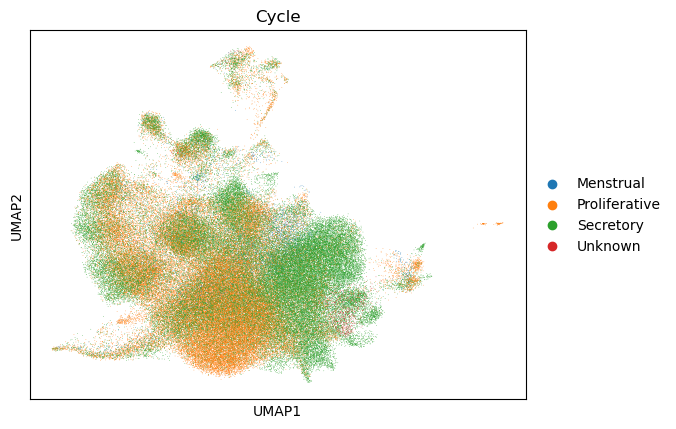

Text(0.5, 1.0, 'scVI')

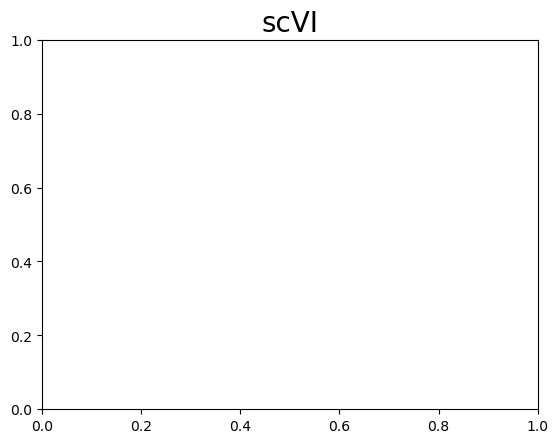

In [58]:
Epithelial.obsm["X_scVI"] = vae.get_latent_representation()
sc.pp.neighbors(Epithelial, use_rep = 'X_scVI')
sc.tl.umap(Epithelial)
sc.pl.umap(
    adata,
    color=['Sample name'],
    frameon=False,
    size= 8,
    legend_fontsize=20,
    legend_fontoutline=3,
    title="Sample",
    show=False)

sc.pl.umap(Epithelial, color=["Sample name"])
sc.pl.umap(Epithelial, color=["Age group"])
sc.pl.umap(Epithelial, color=["Cycle"])

plt.title("scVI", fontsize=20)

In [83]:
for res in [1.00,1.50,2.00]:
    sc.tl.leiden(
        Epithelial, key_added=f"leiden_res_{res:4.2f}", resolution=res, 
        flavor="igraph"
    )

In [11]:
Epithelial = Epithelial.raw.to_adata()

In [33]:
Epithelial.write("/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/h5ad/Epithelial.h5ad")

/home/Data_Drive_8TB/kykim/.conda/envs/kykim/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:435: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/Data_Drive_8TB/kykim/.conda/envs/kykim/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:437: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/Data_Drive_8TB/kykim/.conda/envs/kykim/lib/python3.9/site-packages/scanpy/tools/_rank_g

Cluster 0: ['NPAS3', 'CPM', 'PGR', 'EYA2', 'VWA8', 'FNDC3B', 'EPB41L2', 'ESR1', 'KMO', 'TRMT9B', 'MID1', 'BMPR1B', 'OXR1', 'DNAJC10', 'MAGI1', 'AC246817.1', 'MTCL1', 'PRKN', 'STX18', 'AC068587.4', 'AC108519.1', 'FAM13B', 'KIAA1324', 'SMAD9', 'TMEM101', 'PLEKHA5', 'MECOM', 'PALLD', 'MCC', 'UTRN']
Cluster 1: ['HELLS', 'MMS22L', 'BRIP1', 'MIR924HG', 'POLA1', 'PRKDC', 'CENPK', 'CENPP', 'PRIM2', 'FANCI', 'ATAD2', 'FANCA', 'DTL', 'BRCA1', 'MYO19', 'NSD2', 'NASP', 'WDHD1', 'KNTC1', 'RBL1', 'ESR1', 'ATAD5', 'DIAPH3', 'CDCA7', 'EZH2', 'RFC3', 'CLSPN', 'POLQ', 'LIG1', 'CNTLN']
Cluster 2: ['ESR1', 'PLCB1', 'PGR', 'PALLD', 'STX18', 'GREM2', 'PCDH7', 'SORBS2', 'CCDC170', 'NFIA', 'EYA2', 'STXBP6', 'NPAS3', 'MIA2', 'VWA8', 'ANAPC4', 'FRAS1', 'CTNNA2', 'FNDC3B', 'LEF1', 'GABPB1-AS1', 'AL365259.1', 'BMPR1B', 'NAV2', 'DYNC1I1', 'ROR2', 'PTPRG', 'ADAM28', 'PLEKHA5', 'AC120193.1']
Cluster 3: ['ENPP3', 'UBE2D2', 'AC024230.1', 'PPM1H', 'USP53', 'PAPSS1', 'DLG5', 'PKHD1L1', 'TSHZ2', 'SAT1', 'COL1A2', 'MAP2K6

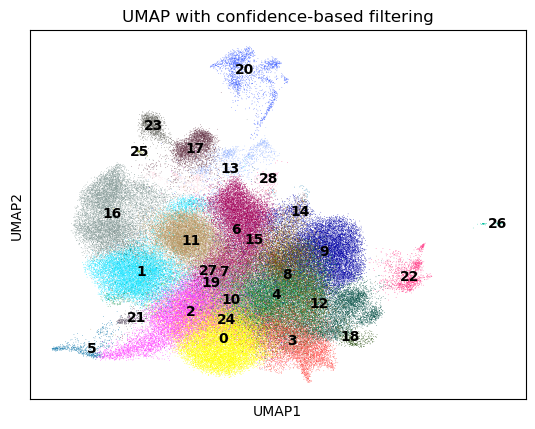

In [84]:
import scanpy as sc
sc.tl.rank_genes_groups(Epithelial, groupby='leiden_res_1.50', method='t-test')  # 또는 'wilcoxon'
top_genes = {}
groups = Epithelial.uns['rank_genes_groups']['names'].dtype.names  # 클러스터 이름들
for group in groups:
    genes = Epithelial.uns['rank_genes_groups']['names'][group][:30]
    top_genes[group] = genes.tolist()


for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {genes}")
sc.pl.umap(
    Epithelial,
    color='leiden_res_1.50',
    title='UMAP with confidence-based filtering',
    legend_loc='on data')

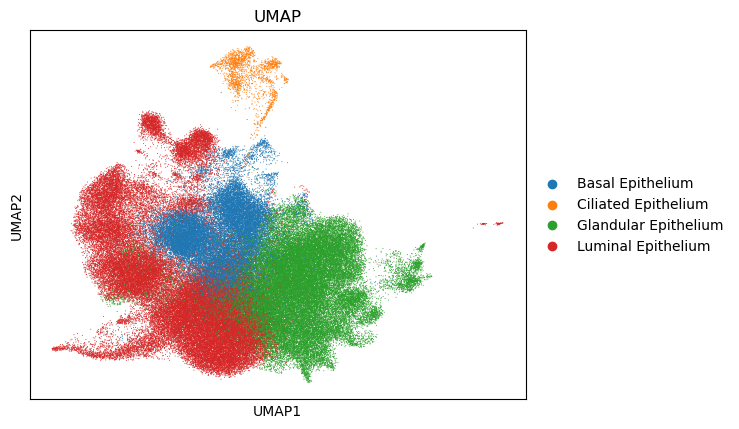

In [98]:
cluster_to_group = {
    0: "Luminal Epithelium",
    1: "Luminal Epithelium",
    2: "Luminal Epithelium",
    3: "Glandular Epithelium",
    4: "Glandular Epithelium",
    5: "Luminal Epithelium",
    6: "Basal Epithelium",
    7: "Luminal Epithelium",
    8: "Glandular Epithelium",
    9: "Glandular Epithelium",
    10: "Luminal Epithelium",
    11: "Basal Epithelium",
    12: "Glandular Epithelium",
    13: "Basal Epithelium",
    14: "Basal Epithelium",
    15: "Glandular Epithelium",
    16: "Luminal Epithelium",
    17: "Luminal Epithelium",
    18: "Glandular Epithelium",
    19: "Luminal Epithelium",
    20: "Ciliated Epithelium",
    21: "Luminal Epithelium",
    22: "Glandular Epithelium",
    23: "Luminal Epithelium",
    24: "Basal Epithelium",
    25: "Luminal Epithelium",
    26: "Luminal Epithelium",
    27: "Basal Epithelium",
    28: "Basal Epithelium"
}


Epithelial.obs["subtype"] = Epithelial.obs["leiden_res_1.50"].astype(int).map(cluster_to_group)
sc.pl.umap(
    Epithelial,
    color='subtype',
    title='UMAP',
    s = 2
)

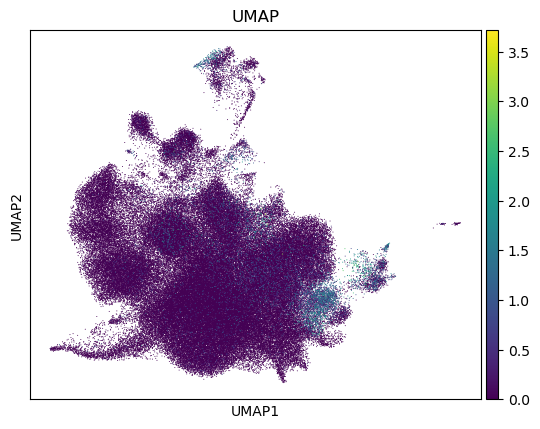

In [123]:
sc.pl.umap(
    Epithelial,
    color='MUC4',
    title='UMAP',
    s = 2
)

In [100]:
import scanpy as sc
sc.tl.rank_genes_groups(Epithelial, groupby='subtype', method='t-test')  # 또는 'wilcoxon'
top_genes = {}
groups = Epithelial.uns['rank_genes_groups']['names'].dtype.names  # 클러스터 이름들
for group in groups:
    genes = Epithelial.uns['rank_genes_groups']['names'][group][:30]
    top_genes[group] = genes.tolist()

for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {genes}")

Cluster Basal Epithelium: ['LGR5', 'GDA', 'DST', 'VTCN1', 'NLGN4X', 'PTGS1', 'CD47', 'ERBB4', 'KCNMA1', 'KCTD1', 'SOX6', 'PAPOLA', 'AC079380.1', 'COL3A1', 'CFI', 'FAM155A', 'PTPRM', 'DAB1', 'LINC00639', 'NRP1', 'LIMCH1', 'CCDC6', 'RNF150', 'SEMA3C', 'RBMS3', 'GPR137C', 'AC015631.1', 'SOX5', 'FGF9', 'KLHL29']
Cluster Ciliated Epithelium: ['ARMC3', 'DNAH12', 'CFAP43', 'CFAP54', 'STK33', 'LRRIQ1', 'CFAP299', 'HYDIN', 'DNAH7', 'DNAH9', 'DNAH11', 'WDR49', 'CDHR3', 'AGBL4', 'TMEM232', 'DCDC1', 'SPAG17', 'RFX3', 'DNAH6', 'CFAP47', 'DNAAF1', 'SPEF2', 'FHAD1', 'CCDC30', 'ADGB', 'CEP126', 'RFX2', 'ZBBX', 'CFAP157', 'SPATA17']
Cluster Glandular Epithelium: ['LINC01320', 'FOXO1', 'NEAT1', 'CATSPERB', 'RIMKLB', 'MALAT1', 'MAP3K5', 'GRAMD1C', 'PAEP', 'CD55', 'SLC15A1', 'TC2N', 'SLC1A1', 'CDYL2', 'CXCL14', 'SESTD1', 'AC079352.1', 'DAPK1', 'SYNE2', 'PHYHIPL', 'MFSD4A', 'LINC02532', 'A2ML1-AS1', 'MAOA', 'AC012593.1', 'PAX8', 'CP', 'SNX29', 'CD44', 'RGS6']
Cluster Luminal Epithelium: ['PGR', 'ESR1', 'PA

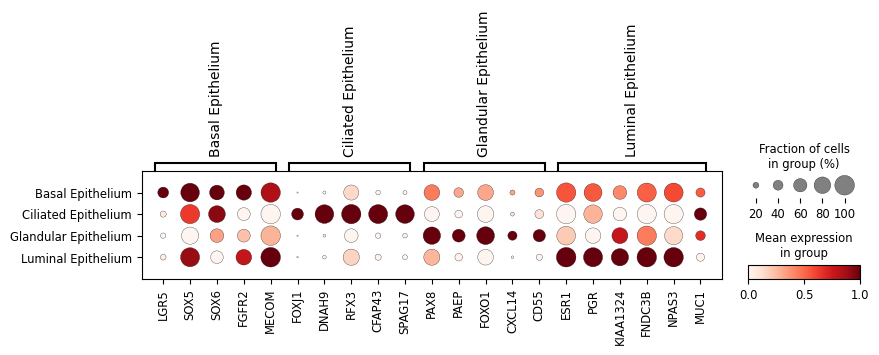

In [141]:
Epithelial_subtype_markers_human = {
    "Basal Epithelium": ['LGR5','SOX5','SOX6','FGFR2','MECOM'],
    "Ciliated Epithelium": ['FOXJ1','DNAH9','RFX3','CFAP43','SPAG17'],
    "Glandular Epithelium": ['PAX8','PAEP','FOXO1','CXCL14','CD55'],
    "Luminal Epithelium": ['ESR1','PGR','KIAA1324','FNDC3B','NPAS3',"MUC1"]}

existing_subtype_markers = {
    subtype: [gene for gene in genes if gene in Epithelial.var_names]
    for subtype, genes in Epithelial_subtype_markers_human.items()}

sc.pl.dotplot(
    Epithelial,
    var_names=existing_subtype_markers,
    groupby="subtype",
    standard_scale="var",
    dendrogram=False)

In [106]:
Epithelial.write("/home/Data_Drive_8TB/kykim/1. Oval/Save_data/Human/h5ad/Epithelial.h5ad")

/tmp/ipykernel_3125532/1330101849.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(['Cycle','subtype'])
/tmp/ipykernel_3125532/1330101849.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(['Cycle','subtype'])


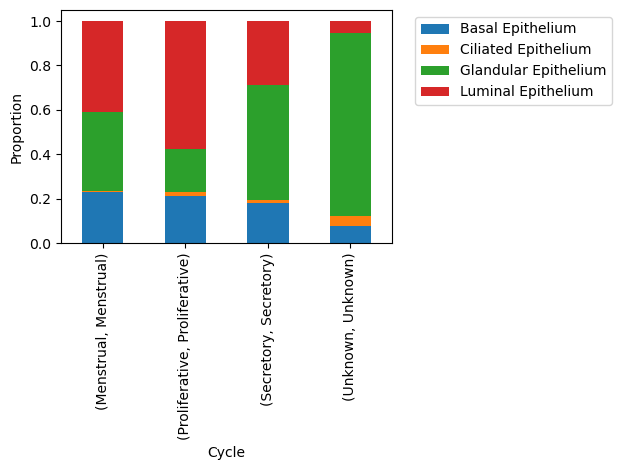

In [108]:
import pandas as pd
import matplotlib.pyplot as plt

df = Epithelial.obs[['Cycle','subtype']].copy()

prop = (
    df.groupby(['Cycle','subtype'])
    .size()
    .groupby(level=0)
    .apply(lambda x: x / x.sum())
    .unstack(fill_value=0)
)

prop.plot(kind='bar', stacked=True)

plt.xlabel('Cycle')
plt.ylabel('Proportion')
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.tight_layout()
plt.show()

/tmp/ipykernel_3125532/2311669120.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(['Age group','subtype'])
/tmp/ipykernel_3125532/2311669120.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(['Age group','subtype'])


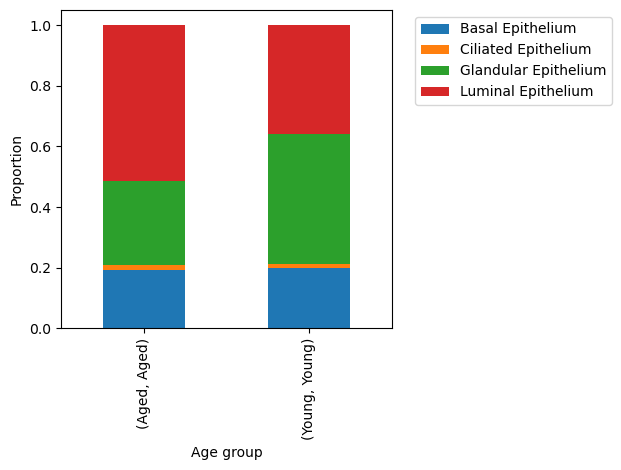

In [110]:
import pandas as pd
import matplotlib.pyplot as plt

df = Epithelial.obs[['Age group','subtype']].copy()

prop = (
    df.groupby(['Age group','subtype'])
    .size()
    .groupby(level=0)
    .apply(lambda x: x / x.sum())
    .unstack(fill_value=0)
)

prop.plot(kind='bar', stacked=True)

plt.xlabel('Age group')
plt.ylabel('Proportion')
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.tight_layout()
plt.show()

In [139]:
Epithelial.obs["Age group"] = np.where(Epithelial.obs["Age"] >= 40, "Aged", "Young")

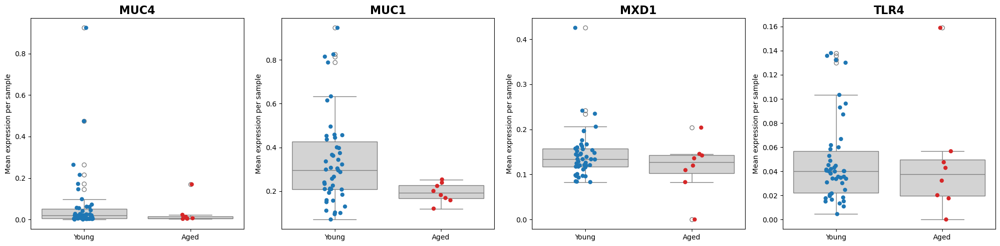

In [140]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

genes = ["MUC4", "MUC1","MXD1","TLR4"]

age_palette = {
    'Young': '#1f77b4',
    'Aged': '#d62728'
}

plot_list = []

le_cells = Epithelial.obs["subtype"] == "Luminal Epithelium"

obs_df = Epithelial.obs

for gene in genes:
    if gene not in Epithelial.var_names:
        continue

    gene_exp = Epithelial[:, gene].X.toarray().flatten()

    for sample_id in obs_df.loc[le_cells, "Sample name"].unique():
        idx = obs_df.index[(obs_df["Sample name"] == sample_id) & le_cells]
        if len(idx) == 0:
            continue

        idx_pos = [Epithelial.obs_names.get_loc(i) for i in idx]
        exp = gene_exp[idx_pos].mean()

        age = obs_df.loc[idx, "Age group"].iloc[0]

        if pd.isna(age):
            continue

        plot_list.append({
            "Gene": gene,
            "sample_id": sample_id,
            "Age group": age,
            "MeanExpression": exp
        })

plot_df = pd.DataFrame(plot_list)

fig, axes = plt.subplots(1, len(genes), figsize=(5 * len(genes), 5))

if len(genes) == 1:
    axes = [axes]

for i, gene in enumerate(genes):
    ax = axes[i]
    sub_df = plot_df[plot_df["Gene"] == gene].copy()

    sns.boxplot(
        data=sub_df,
        x="Age group",
        y="MeanExpression",
        color="lightgray",
        ax=ax
    )

    sns.stripplot(
        data=sub_df,
        x="Age group",
        y="MeanExpression",
        hue="Age group",
        palette=age_palette,
        size=6,
        dodge=False,
        ax=ax
    )

    ax.set_title(gene, fontsize=16, fontweight='bold')
    ax.set_xlabel("")
    ax.set_ylabel("Mean expression per sample")

    leg = ax.get_legend()
    if leg is not None:
        leg.remove()

plt.tight_layout()
plt.show()

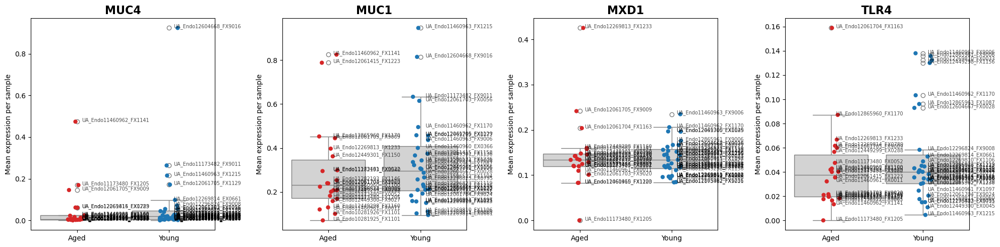

In [135]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

genes = ["MUC4", "MUC1","MXD1","TLR4"]

age_palette = {
    'Young': '#1f77b4',
    'Aged': '#d62728'
}

plot_list = []

le_cells = Epithelial.obs["subtype"] == "Luminal Epithelium"

obs_df = Epithelial.obs

for gene in genes:
    if gene not in Epithelial.var_names:
        continue

    gene_exp = Epithelial[:, gene].X.toarray().flatten()

    for sample_id in obs_df.loc[le_cells, "Sample name"].unique():
        idx = obs_df.index[(obs_df["Sample name"] == sample_id) & le_cells]
        if len(idx) == 0:
            continue

        idx_pos = [Epithelial.obs_names.get_loc(i) for i in idx]
        exp = gene_exp[idx_pos].mean()

        age = obs_df.loc[idx, "Age group"].iloc[0]

        if pd.isna(age):
            continue

        plot_list.append({
            "Gene": gene,
            "sample_id": sample_id,
            "Age group": age,
            "MeanExpression": exp
        })

plot_df = pd.DataFrame(plot_list)

fig, axes = plt.subplots(1, len(genes), figsize=(5 * len(genes), 5))

if len(genes) == 1:
    axes = [axes]

for i, gene in enumerate(genes):
    ax = axes[i]
    sub_df = plot_df[plot_df["Gene"] == gene].copy()

    sns.boxplot(
        data=sub_df,
        x="Age group",
        y="MeanExpression",
        color="lightgray",
        ax=ax
    )

    strip = sns.stripplot(
        data=sub_df,
        x="Age group",
        y="MeanExpression",
        hue="Age group",
        palette=age_palette,
        size=6,
        dodge=False,
        ax=ax
    )

    ax.set_title(gene, fontsize=16, fontweight='bold')
    ax.set_xlabel("")
    ax.set_ylabel("Mean expression per sample")

    # 🔑 sample_id 텍스트 추가
    for j, point in sub_df.iterrows():
        x = list(sub_df["Age group"].unique()).index(point["Age group"])
        y = point["MeanExpression"]

        ax.text(
            x + 0.05,   # 오른쪽으로 살짝 이동
            y,
            str(point["sample_id"]),
            fontsize=7,
            alpha=0.7
        )

    leg = ax.get_legend()
    if leg is not None:
        leg.remove()

plt.tight_layout()
plt.show()

/tmp/ipykernel_3125532/1908519505.py:25: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  expr


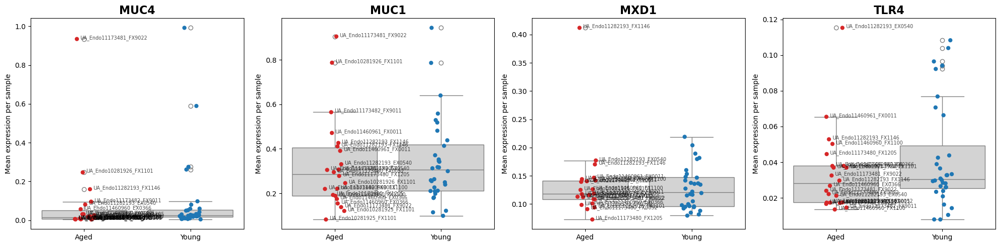

In [137]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

genes = ["MUC4", "MUC1", "MXD1", "TLR4"]

age_palette = {
    'Young': '#1f77b4',
    'Aged': '#d62728'
}

adata_sub = Epithelial[:, genes].copy()

expr = pd.DataFrame(
    adata_sub.X.toarray(),
    index=adata_sub.obs_names,
    columns=genes
)

expr["Sample name"] = adata_sub.obs["Sample name"].values
expr["Age group"] = adata_sub.obs["Age group"].values

plot_df = (
    expr
    .groupby(["Sample name", "Age group"], sort=False)
    .mean()
    .reset_index()
    .melt(id_vars=["Sample name", "Age group"], var_name="Gene", value_name="MeanExpression")
)

fig, axes = plt.subplots(1, len(genes), figsize=(5 * len(genes), 5))

if len(genes) == 1:
    axes = [axes]

for i, gene in enumerate(genes):
    ax = axes[i]
    sub_df = plot_df[plot_df["Gene"] == gene].copy()

    sns.boxplot(
        data=sub_df,
        x="Age group",
        y="MeanExpression",
        color="lightgray",
        ax=ax
    )

    strip = sns.stripplot(
        data=sub_df,
        x="Age group",
        y="MeanExpression",
        hue="Age group",
        palette=age_palette,
        size=6,
        dodge=False,
        ax=ax
    )

    ax.set_title(gene, fontsize=16, fontweight='bold')
    ax.set_xlabel("")
    ax.set_ylabel("Mean expression per sample")

    # 🔑 실제 점 좌표 기반 label
    offsets = strip.collections[0].get_offsets()

    for (x, y), sample_id in zip(offsets, sub_df["Sample name"]):
        ax.text(
            x + 0.03,
            y,
            str(sample_id),
            fontsize=7,
            alpha=0.7
        )

    leg = ax.get_legend()
    if leg is not None:
        leg.remove()

plt.tight_layout()
plt.show()